In [1]:
import pandas as pd
import numpy as np

import warnings
warnings.simplefilter("ignore")

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from datetime import datetime
import datetime as dt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

from pylab import rcParams
sns.set_style("whitegrid", {'axes.grid' : True})


In [2]:
def get_uniq(df):
    print('\033[1m'+ 'Уникальные значения'+'\033[0m'+'\n')
    for i in df.columns.to_list():
        print('\033[34m\033[1m'+ 'Признак {} имеет {} следующих уникальных значений:'.format(i, 
                                                                            len(df[i].unique()))+'\033[0m')
        print(df[i].unique())
        print('\033[1m' + '---------------------------------------------------------------------------------'+ '\033[0m')


In [3]:
def get_nan(df):
    df_null = pd.concat([df.isna().sum().to_frame(name='count_missig_value'), 
           df.isna().mean().to_frame(name='pct_missig_value')], axis=1)
    df_null['pct_missig_value'] = np.round(df_null['pct_missig_value']*100, 2)
    print(df_null)
    

In [4]:
def get_types(df):
    for t in set(df.dtypes):
        print('\033[34m\033[1m' + "Переменные типа" + '\033[0m', t)
        print(df.select_dtypes(include = [t]).describe(), '\n')
        

In [5]:
df1 = pd.read_excel('https://raw.githubusercontent.com/edwan70/Datasets/main/gelen_ozer.xlsx', sheet_name='gelen_ozer')
df1

,SampleID,DateTime,Object,Type,ValuePerSec,SourceElement,Unit
0,13,2024-02-08 09:20:51.000,MonObj25,7,-45.4,"Мощность приёма, Radio1",dB
1,13,2024-02-08 09:47:45.000,MonObj25,7,-45.4,"Мощность приёма, Radio1",dB
2,13,2024-02-08 10:38:56.000,MonObj25,7,-45.7,"Мощность приёма, Radio1",dB
3,13,2024-02-08 10:39:38.000,MonObj25,7,-45.1,"Мощность приёма, Radio1",dB
4,13,2024-02-08 10:49:33.000,MonObj25,7,-45.1,"Мощность приёма, Radio1",dB
...,...,...,...,...,...,...,...
164868,31,2024-03-09 09:02:13.000,MonObj38,8,-44.8,"Мощность приёма, Radio2",dB
164869,31,2024-03-09 09:08:07.000,MonObj38,8,-44.5,"Мощность приёма, Radio2",dB
164870,31,2024-03-09 09:05:20.000,MonObj38,8,-46.4,"Мощность приёма, Radio2",dB
164871,31,2024-03-09 09:03:47.000,MonObj38,8,-46.0,"Мощность приёма, Radio2",dB


In [6]:
# df1 = pd.read_excel('gelen_ozer.xlsx', sheet_name='gelen_ozer')
# df1


In [7]:
rename_dic = dict(zip(df1.columns,
['receiver_id', 'ДатаВремя', 'object_id', 'channel_id',
                      'Значение', 'description', 'unit']))

df1.rename(columns=rename_dic, inplace = True)


In [8]:
df1


,receiver_id,ДатаВремя,object_id,channel_id,Значение,description,unit
0,13,2024-02-08 09:20:51.000,MonObj25,7,-45.4,"Мощность приёма, Radio1",dB
1,13,2024-02-08 09:47:45.000,MonObj25,7,-45.4,"Мощность приёма, Radio1",dB
2,13,2024-02-08 10:38:56.000,MonObj25,7,-45.7,"Мощность приёма, Radio1",dB
3,13,2024-02-08 10:39:38.000,MonObj25,7,-45.1,"Мощность приёма, Radio1",dB
4,13,2024-02-08 10:49:33.000,MonObj25,7,-45.1,"Мощность приёма, Radio1",dB
...,...,...,...,...,...,...,...
164868,31,2024-03-09 09:02:13.000,MonObj38,8,-44.8,"Мощность приёма, Radio2",dB
164869,31,2024-03-09 09:08:07.000,MonObj38,8,-44.5,"Мощность приёма, Radio2",dB
164870,31,2024-03-09 09:05:20.000,MonObj38,8,-46.4,"Мощность приёма, Radio2",dB
164871,31,2024-03-09 09:03:47.000,MonObj38,8,-46.0,"Мощность приёма, Radio2",dB


In [9]:
get_nan(df1)


             count_missig_value  pct_missig_value
receiver_id                   0               0.0
ДатаВремя                     0               0.0
object_id                     0               0.0
channel_id                    0               0.0
Значение                      0               0.0
description                   0               0.0
unit                          0               0.0


In [10]:
df1.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 164873 entries, 0 to 164872
Data columns (total 7 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   receiver_id  164873 non-null  int64  
 1   ДатаВремя    164873 non-null  object 
 2   object_id    164873 non-null  object 
 3   channel_id   164873 non-null  int64  
 4   Значение     164873 non-null  float64
 5   description  164873 non-null  object 
 6   unit         164873 non-null  object 
dtypes: float64(1), int64(2), object(4)
memory usage: 8.8+ MB


In [11]:
get_types(df1)


Переменные типа float64
            Значение
count  164873.000000
mean      -42.447395
std         3.880220
min       -99.900000
25%       -45.100000
50%       -42.300000
75%       -39.800000
max       -29.700000 

Переменные типа int64
         receiver_id     channel_id
count  164873.000000  164873.000000
mean       26.031570       8.139386
std         5.652766       1.354831
min        13.000000       7.000000
25%        20.000000       7.000000
50%        29.000000       8.000000
75%        30.000000       8.000000
max        31.000000      12.000000 

Переменные типа object
                       ДатаВремя  object_id               description    unit
count                     164873     164873                    164873  164873
unique                    111712          6                         6       1
top      2024-02-12 18:29:53.000   MonObj37   Мощность приёма, Radio2      dB
freq                           6      58381                     69226  164873 



In [12]:
df1.duplicated().sum()


0

In [13]:
df1["ДатаВремя"] = pd.to_datetime(df1["ДатаВремя"])
df1['Дата'] = df1['ДатаВремя'].dt.strftime('%Y-%m')
df1["ДатаВремя"].describe()


count                           164873
mean     2024-02-23 04:35:44.294693632
min                2024-02-08 07:06:48
25%                2024-02-13 13:28:07
50%                2024-02-19 17:35:48
75%                2024-03-03 13:24:29
max                2024-03-10 08:21:17
Name: ДатаВремя, dtype: object

In [14]:
df1.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 164873 entries, 0 to 164872
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   receiver_id  164873 non-null  int64         
 1   ДатаВремя    164873 non-null  datetime64[ns]
 2   object_id    164873 non-null  object        
 3   channel_id   164873 non-null  int64         
 4   Значение     164873 non-null  float64       
 5   description  164873 non-null  object        
 6   unit         164873 non-null  object        
 7   Дата         164873 non-null  object        
dtypes: datetime64[ns](1), float64(1), int64(2), object(4)
memory usage: 10.1+ MB


In [15]:
df1['Значение'].describe()


count    164873.000000
mean        -42.447395
std           3.880220
min         -99.900000
25%         -45.100000
50%         -42.300000
75%         -39.800000
max         -29.700000
Name: Значение, dtype: float64

In [16]:
get_uniq(df1)


Уникальные значения

Признак receiver_id имеет 16 следующих уникальных значений:
[13 14 15 16 17 18 19 20 21 22 23 24 28 29 30 31]
---------------------------------------------------------------------------------
Признак ДатаВремя имеет 111712 следующих уникальных значений:
<DatetimeArray>
['2024-02-08 09:20:51', '2024-02-08 09:47:45', '2024-02-08 10:38:56',
 '2024-02-08 10:39:38', '2024-02-08 10:49:33', '2024-02-08 10:50:15',
 '2024-02-08 11:07:17', '2024-02-08 11:09:48', '2024-02-08 11:19:35',
 '2024-02-08 11:33:54',
 ...
 '2024-03-09 08:50:54', '2024-03-09 08:54:20', '2024-03-09 08:55:08',
 '2024-03-09 09:00:32', '2024-03-09 09:02:53', '2024-03-09 09:01:25',
 '2024-03-09 09:02:13', '2024-03-09 09:08:07', '2024-03-09 09:03:47',
 '2024-03-09 09:04:38']
Length: 111712, dtype: datetime64[ns]
---------------------------------------------------------------------------------
Признак object_id имеет 6 следующих уникальных значений:
[' MonObj25' ' MonObj28' ' MonObj27' ' MonObj26' ' MonObj37

In [17]:
def get_agg(df):
    pd.set_option("display.precision", 1)
    np.set_printoptions(precision=1)
    print(df[['Значение', 'Интервал в секундах', 'Интервал в минутах']].agg([np.mean, np.median, np.min, np.max]))
    

### РРЛ Центр - Геленджик

In [18]:
df_cen_gelen1 = df1[(df1['object_id'] == ' MonObj37') &
                    (df1['receiver_id'] == 28) & 
                    (df1['channel_id'] == 7)][['receiver_id', 'ДатаВремя','object_id',
                                                    'channel_id', 'Значение',
                                                    'description', 'unit']]
df_cen_gelen1 = df_cen_gelen1.sort_values(['ДатаВремя'],ascending=True).reset_index().drop(columns=['index'])
df_cen_gelen1['Интервал']=0 # создаем непустой столбец для расчета
df_cen_gelen1['Интервал в секундах']=0
for i in range (1, len(df_cen_gelen1)): # находим интервал между измерениями
    df_cen_gelen1['Интервал'][i] = (df_cen_gelen1['ДатаВремя'][i]-df_cen_gelen1['ДатаВремя'][i-1])
    df_cen_gelen1['Интервал в секундах'][i] = (df_cen_gelen1['ДатаВремя'][i]-df_cen_gelen1['ДатаВремя'][i-1]) \
    .total_seconds()
df_cen_gelen1['Интервал в секундах']=df_cen_gelen1['Интервал в секундах'].astype(int)
df_cen_gelen1 = df_cen_gelen1.sort_values(['Интервал в секундах'],ascending=False).reset_index().drop(columns=['index'])
df_cen_gelen1['Интервал в минутах']=df_cen_gelen1['Интервал в секундах']/60
df_cen_gelen1['Интервал в минутах']=df_cen_gelen1['Интервал в минутах'].astype(int)
df_cen_gelen1


,receiver_id,ДатаВремя,object_id,channel_id,Значение,description,unit,Интервал,Интервал в секундах,Интервал в минутах
0,28,2024-02-27 07:43:11,MonObj37,7,-41.6,"Мощность приёма, Radio1",dB,7 days 06:59:25,629965,10499
1,28,2024-03-01 08:16:13,MonObj37,7,-39.5,"Мощность приёма, Radio1",dB,0 days 11:15:22,40522,675
2,28,2024-03-02 02:25:58,MonObj37,7,-41.0,"Мощность приёма, Radio1",dB,0 days 00:38:01,2281,38
3,28,2024-03-01 08:44:17,MonObj37,7,-41.0,"Мощность приёма, Radio1",dB,0 days 00:28:04,1684,28
4,28,2024-03-06 00:22:43,MonObj37,7,-40.1,"Мощность приёма, Radio1",dB,0 days 00:20:55,1255,20
...,...,...,...,...,...,...,...,...,...,...
29405,28,2024-02-16 07:30:12,MonObj37,7,-50.4,"Мощность приёма, Radio1",dB,0 days 00:00:30,30,0
29406,28,2024-02-09 07:25:20,MonObj37,7,-45.7,"Мощность приёма, Radio1",dB,0 days 00:00:29,29,0
29407,28,2024-02-08 07:33:08,MonObj37,7,-42.6,"Мощность приёма, Radio1",dB,0 days 00:00:25,25,0
29408,28,2024-02-29 20:41:46,MonObj37,7,-51.1,"Мощность приёма, Radio1",dB,0 days 00:00:23,23,0


In [19]:
get_agg(df_cen_gelen1)


        Значение  Интервал в секундах  Интервал в минутах
mean       -44.4                 91.2                 0.8
median     -44.2                 53.0                 0.0
amin       -64.9                  0.0                 0.0
amax       -37.6             629965.0             10499.0


In [20]:
df_cen_gelen1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29410 entries, 0 to 29409
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   receiver_id          29410 non-null  int64         
 1   ДатаВремя            29410 non-null  datetime64[ns]
 2   object_id            29410 non-null  object        
 3   channel_id           29410 non-null  int64         
 4   Значение             29410 non-null  float64       
 5   description          29410 non-null  object        
 6   unit                 29410 non-null  object        
 7   Интервал             29410 non-null  object        
 8   Интервал в секундах  29410 non-null  int64         
 9   Интервал в минутах   29410 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(4), object(4)
memory usage: 2.2+ MB


In [21]:
df_cen_gelen1.to_csv('cen_gelen1.csv', index=False) # Центр - Геленджик 1


In [22]:
df_cen_gelen1_mean= df_cen_gelen1.groupby(by= df_cen_gelen1['ДатаВремя'].dt.date)['Значение']\
.agg([np.mean, np.median]) \
.reset_index().rename(columns={'ДатаВремя': "День", 'mean': "Среднее значение", 'median': "Медиана"})
df_cen_gelen1_mean


,День,Среднее значение,Медиана
0,2024-02-08,-44.0,-43.8
1,2024-02-09,-44.7,-44.5
2,2024-02-10,-43.9,-43.5
3,2024-02-11,-43.3,-43.2
4,2024-02-12,-42.8,-42.3
5,2024-02-13,-43.1,-42.0
6,2024-02-14,-43.7,-42.9
7,2024-02-15,-44.3,-44.2
8,2024-02-16,-46.5,-46.4
9,2024-02-17,-46.8,-47.0


In [23]:
df_cen_gelen2 = df1[(df1['object_id'] == ' MonObj37') &
                    (df1['receiver_id'] == 29) & 
                    (df1['channel_id'] == 8)][['receiver_id', 'ДатаВремя','object_id',
                                                    'channel_id', 'Значение',
                                                    'description', 'unit']]
df_cen_gelen2 = df_cen_gelen2.sort_values(['ДатаВремя'],ascending=True).reset_index().drop(columns=['index'])
df_cen_gelen2['Интервал']=0 # создаем непустой столбец для расчета
df_cen_gelen2['Интервал в секундах']=0
for i in range (1, len(df_cen_gelen2)): # находим интервал между измерениями
    df_cen_gelen2['Интервал'][i] = (df_cen_gelen2['ДатаВремя'][i]-df_cen_gelen2['ДатаВремя'][i-1])
    df_cen_gelen2['Интервал в секундах'][i] = (df_cen_gelen2['ДатаВремя'][i]-df_cen_gelen2['ДатаВремя'][i-1]) \
    .total_seconds()
df_cen_gelen2['Интервал в секундах']=df_cen_gelen2['Интервал в секундах'].astype(int)
df_cen_gelen2 = df_cen_gelen2.sort_values(['Интервал в секундах'],ascending=False).reset_index().drop(columns=['index'])
df_cen_gelen2['Интервал в минутах']=df_cen_gelen2['Интервал в секундах']/60
df_cen_gelen2['Интервал в минутах']=df_cen_gelen2['Интервал в минутах'].astype(int)
df_cen_gelen2


,receiver_id,ДатаВремя,object_id,channel_id,Значение,description,unit,Интервал,Интервал в секундах,Интервал в минутах
0,29,2024-02-27 07:43:11,MonObj37,8,-43.2,"Мощность приёма, Radio2",dB,7 days 06:58:37,629917,10498
1,29,2024-03-01 08:16:13,MonObj37,8,-42.9,"Мощность приёма, Radio2",dB,0 days 11:14:30,40470,674
2,29,2024-02-29 21:01:43,MonObj37,8,-99.9,"Мощность приёма, Radio2",dB,0 days 00:42:06,2526,42
3,29,2024-03-01 08:41:57,MonObj37,8,-40.1,"Мощность приёма, Radio2",dB,0 days 00:25:44,1544,25
4,29,2024-03-06 02:16:23,MonObj37,8,-40.7,"Мощность приёма, Radio2",dB,0 days 00:22:41,1361,22
...,...,...,...,...,...,...,...,...,...,...
28966,29,2024-02-09 07:25:20,MonObj37,8,-40.4,"Мощность приёма, Radio2",dB,0 days 00:00:28,28,0
28967,29,2024-03-07 07:33:20,MonObj37,8,-43.8,"Мощность приёма, Radio2",dB,0 days 00:00:27,27,0
28968,29,2024-03-08 07:58:22,MonObj37,8,-48.5,"Мощность приёма, Radio2",dB,0 days 00:00:26,26,0
28969,29,2024-02-28 07:29:39,MonObj37,8,-44.5,"Мощность приёма, Radio2",dB,0 days 00:00:25,25,0


In [24]:
get_agg(df_cen_gelen2)


        Значение  Интервал в секундах  Интервал в минутах
mean       -44.8                 92.6                 0.8
median     -44.8                 53.0                 0.0
amin       -99.9                  0.0                 0.0
amax       -37.9             629917.0             10498.0


In [25]:
df_cen_gelen2.to_csv('cen_gelen2.csv', index=False) # Центр - Геленджик 2


In [26]:
df_cen_gelen2_mean= df_cen_gelen2.groupby(by= df_cen_gelen2['ДатаВремя'].dt.date)['Значение'] \
.agg([np.mean, np.median]) \
.reset_index().rename(columns={'ДатаВремя': "День", 'mean': "Среднее значение", 'median': "Медиана"})
df_cen_gelen2_mean


,День,Среднее значение,Медиана
0,2024-02-08,-43.6,-43.5
1,2024-02-09,-43.5,-43.5
2,2024-02-10,-43.9,-43.5
3,2024-02-11,-43.9,-43.5
4,2024-02-12,-43.4,-42.9
5,2024-02-13,-43.1,-42.6
6,2024-02-14,-43.8,-42.9
7,2024-02-15,-43.0,-42.6
8,2024-02-16,-42.0,-42.0
9,2024-02-17,-46.8,-46.7


In [27]:
df_gelen_cen1 = df1[(df1['object_id'] == ' MonObj38') &
                    (df1['receiver_id'] == 30) & 
                    (df1['channel_id'] == 7)][['receiver_id', 'ДатаВремя','object_id',
                                                    'channel_id', 'Значение',
                                                    'description', 'unit']]
df_gelen_cen1 = df_gelen_cen1.sort_values(['ДатаВремя'],ascending=True).reset_index().drop(columns=['index'])
df_gelen_cen1['Интервал']=0 # создаем непустой столбец для расчета
df_gelen_cen1['Интервал в секундах']=0
for i in range (1, len(df_gelen_cen1)): # находим интервал между измерениями
    df_gelen_cen1['Интервал'][i] = (df_gelen_cen1['ДатаВремя'][i]-df_gelen_cen1['ДатаВремя'][i-1])
    df_gelen_cen1['Интервал в секундах'][i] = (df_gelen_cen1['ДатаВремя'][i]-df_gelen_cen1['ДатаВремя'][i-1]) \
    .total_seconds()
df_gelen_cen1['Интервал в секундах']=df_gelen_cen1['Интервал в секундах'].astype(int)
df_gelen_cen1 = df_gelen_cen1.sort_values(['Интервал в секундах'],ascending=False).reset_index().drop(columns=['index'])
df_gelen_cen1['Интервал в минутах']=df_gelen_cen1['Интервал в секундах']/60
df_gelen_cen1['Интервал в минутах']=df_gelen_cen1['Интервал в минутах'].astype(int)
df_gelen_cen1


,receiver_id,ДатаВремя,object_id,channel_id,Значение,description,unit,Интервал,Интервал в секундах,Интервал в минутах
0,30,2024-02-27 07:43:12,MonObj38,7,-40.4,"Мощность приёма, Radio1",dB,7 days 06:58:22,629902,10498
1,30,2024-03-01 08:41:59,MonObj38,7,-41.3,"Мощность приёма, Radio1",dB,0 days 00:49:15,2955,49
2,30,2024-03-06 01:08:34,MonObj38,7,-40.7,"Мощность приёма, Radio1",dB,0 days 00:29:14,1754,29
3,30,2024-03-09 23:41:27,MonObj38,7,-40.7,"Мощность приёма, Radio1",dB,0 days 00:26:16,1576,26
4,30,2024-02-29 16:43:23,MonObj38,7,-39.5,"Мощность приёма, Radio1",dB,0 days 00:22:25,1345,22
...,...,...,...,...,...,...,...,...,...,...
27290,30,2024-02-28 01:42:40,MonObj38,7,-43.2,"Мощность приёма, Radio1",dB,0 days 00:00:39,39,0
27291,30,2024-02-13 07:14:14,MonObj38,7,-48.9,"Мощность приёма, Radio1",dB,0 days 00:00:37,37,0
27292,30,2024-02-29 21:13:55,MonObj38,7,-41.3,"Мощность приёма, Radio1",dB,0 days 00:00:36,36,0
27293,30,2024-02-29 07:21:44,MonObj38,7,-41.6,"Мощность приёма, Radio1",dB,0 days 00:00:33,33,0


In [28]:
get_agg(df_gelen_cen1)


        Значение  Интервал в секундах  Интервал в минутах
mean       -42.5                 98.3                 0.9
median     -42.0                 54.0                 0.0
amin       -68.0                  0.0                 0.0
amax       -35.7             629902.0             10498.0


In [29]:
df_gelen_cen1.to_csv('gelen_cen1.csv', index=False) # Геленджик - Центр 1


In [30]:
df_gelen_cen1_mean= df_gelen_cen1.groupby(by= df_gelen_cen1['ДатаВремя'].dt.date)['Значение'] \
.agg([np.mean, np.median]) \
.reset_index().rename(columns={'ДатаВремя': "День", 'mean': "Среднее значение", 'median': "Медиана"})
df_gelen_cen1_mean


,День,Среднее значение,Медиана
0,2024-02-08,-42.1,-42.0
1,2024-02-09,-41.7,-41.6
2,2024-02-10,-42.1,-42.0
3,2024-02-11,-42.8,-42.6
4,2024-02-12,-43.3,-43.2
5,2024-02-13,-43.8,-43.5
6,2024-02-14,-43.4,-42.9
7,2024-02-15,-42.7,-42.3
8,2024-02-16,-40.8,-40.7
9,2024-02-17,-39.4,-39.5


In [31]:
df_gelen_cen2 = df1[(df1['object_id'] == ' MonObj38') &
                    (df1['receiver_id'] == 31) & 
                    (df1['channel_id'] == 8)][['receiver_id', 'ДатаВремя','object_id',
                                                    'channel_id', 'Значение',
                                                    'description', 'unit']]
df_gelen_cen2 = df_gelen_cen2.sort_values(['ДатаВремя'],ascending=True).reset_index().drop(columns=['index'])
df_gelen_cen2['Интервал']=0 # создаем непустой столбец для расчета
df_gelen_cen2['Интервал в секундах']=0
for i in range (1, len(df_gelen_cen2)): # находим интервал между измерениями
    df_gelen_cen2['Интервал'][i] = (df_gelen_cen2['ДатаВремя'][i]-df_gelen_cen2['ДатаВремя'][i-1])
    df_gelen_cen2['Интервал в секундах'][i] = (df_gelen_cen2['ДатаВремя'][i]-df_gelen_cen2['ДатаВремя'][i-1]) \
    .total_seconds()
df_gelen_cen2['Интервал в секундах']=df_gelen_cen2['Интервал в секундах'].astype(int)
df_gelen_cen2 = df_gelen_cen2.sort_values(['Интервал в секундах'],ascending=False).reset_index().drop(columns=['index'])
df_gelen_cen2['Интервал в минутах']=df_gelen_cen2['Интервал в секундах']/60
df_gelen_cen2['Интервал в минутах']=df_gelen_cen2['Интервал в минутах'].astype(int)
df_gelen_cen2


,receiver_id,ДатаВремя,object_id,channel_id,Значение,description,unit,Интервал,Интервал в секундах,Интервал в минутах
0,31,2024-02-27 07:43:13,MonObj38,8,-42.3,"Мощность приёма, Radio2",dB,7 days 06:59:05,629945,10499
1,31,2024-03-01 08:41:59,MonObj38,8,-41.3,"Мощность приёма, Radio2",dB,0 days 00:48:20,2900,48
2,31,2024-03-02 11:18:02,MonObj38,8,-40.7,"Мощность приёма, Radio2",dB,0 days 00:21:44,1304,21
3,31,2024-03-01 20:26:36,MonObj38,8,-41.6,"Мощность приёма, Radio2",dB,0 days 00:16:05,965,16
4,31,2024-03-06 04:39:49,MonObj38,8,-39.5,"Мощность приёма, Radio2",dB,0 days 00:14:56,896,14
...,...,...,...,...,...,...,...,...,...,...
29777,31,2024-02-29 21:13:55,MonObj38,8,-43.5,"Мощность приёма, Radio2",dB,0 days 00:00:36,36,0
29778,31,2024-02-29 07:21:44,MonObj38,8,-39.8,"Мощность приёма, Radio2",dB,0 days 00:00:33,33,0
29779,31,2024-02-29 22:52:05,MonObj38,8,-45.7,"Мощность приёма, Radio2",dB,0 days 00:00:30,30,0
29780,31,2024-02-29 20:41:21,MonObj38,8,-45.7,"Мощность приёма, Radio2",dB,0 days 00:00:26,26,0


In [32]:
get_agg(df_gelen_cen2)


        Значение  Интервал в секундах  Интервал в минутах
mean       -43.6                 90.1                 0.7
median     -43.2                 53.0                 0.0
amin       -60.8                  0.0                 0.0
amax       -36.3             629945.0             10499.0


In [33]:
df_gelen_cen2.to_csv('gelen_cen2.csv', index=False) # Геленджик - Центр 2


In [34]:
df_gelen_cen2_mean= df_gelen_cen2.groupby(by= df_gelen_cen2['ДатаВремя'].dt.date)['Значение'] \
.agg([np.mean, np.median]) \
.reset_index().rename(columns={'ДатаВремя': "День", 'mean': "Среднее значение", 'median': "Медиана"})
df_gelen_cen2_mean


,День,Среднее значение,Медиана
0,2024-02-08,-42.4,-42.3
1,2024-02-09,-43.1,-42.9
2,2024-02-10,-42.6,-42.3
3,2024-02-11,-42.2,-42.0
4,2024-02-12,-41.7,-41.0
5,2024-02-13,-41.8,-40.7
6,2024-02-14,-42.5,-41.3
7,2024-02-15,-42.6,-42.3
8,2024-02-16,-44.3,-44.2
9,2024-02-17,-47.1,-47.3


In [35]:
spisok_df=[df_cen_gelen1, df_cen_gelen2, df_gelen_cen1, df_gelen_cen2]
spisok_df_mean=[df_cen_gelen1_mean, df_cen_gelen2_mean, df_gelen_cen1_mean, df_gelen_cen2_mean]
spisok_title=['РРЛ Центр-Геленджик 1', 'РРЛ Центр-Геленджик 2', 'РРЛ Геленджик-Центр 1', 'РРЛ Геленджик-Центр 2']
colors=['y','gold','indianred','coral']


In [36]:
def get_plot(spisok_df, colors, list_title):
    plt.figure(figsize=(14, 5))
    ax = sns.lineplot(data = spisok_df[i], x = "ДатаВремя", y = "Значение", color = colors[i])
    plt.xticks(np.unique(spisok_df[i]["ДатаВремя"].dt.date.values), rotation=30)
    ax.set(title=spisok_title[i]);
plt.show()


In [37]:
def get_plot_dis(spisok_df, list_title):
    # Распределение значений
    ax = sns.displot(spisok_df[i]['Значение'], kde = False, bins=10)
    ax.set(title=list_title[i]);
plt.show()
    

In [38]:
def get_plot_mean(spisok_df, list_title):
    plt.figure(figsize=(14, 5))
    ax = sns.lineplot(data = spisok_df_mean[i], x = "День", y = "Среднее значение", 
                      color = colors[i], label = 'Среднее значение')
    ax1 = sns.lineplot(data = spisok_df_mean[i], x = "День", y = "Медиана", 
                       color = 'green', label = 'Медиана')
    plt.xticks(spisok_df_mean[i]["День"].values, rotation=30)                                                                     
    ax.set(title=spisok_title[i]);
plt.show()


In [39]:
def get_plot_int(spisok_df, list_title):
    plt.figure(figsize=(14, 5))
    ax = sns.lineplot(data = spisok_df[i][1:], x = "ДатаВремя", y = "Интервал в минутах", color = colors[i])
    plt.xticks(np.unique(spisok_df[i]["ДатаВремя"].dt.date.values), rotation=30)                                                                     
    ax.set(title=spisok_title[i])
    plt.ylabel('Интервал в минутах');
plt.show()


In [40]:
def get_plot_int1(spisok_df, list_colors, list_title):
    df=spisok_df[i][1:]
    plt.figure(figsize=(14, 5))
    plt.title(spisok_title[i])
    plt.scatter(df['ДатаВремя'], df['Интервал в минутах'], c = list_colors[i], cmap='viridis', 
            s=df['Интервал в минутах'], alpha = 0.6)
    plt.xlabel('ДатаВремя')
    plt.xticks(np.unique(spisok_df[i]["ДатаВремя"].dt.date.values), rotation=30)
    plt.ylabel('Интервал в минутах');
plt.show()
    

### Уровни сигнала РРЛ Геленджик.

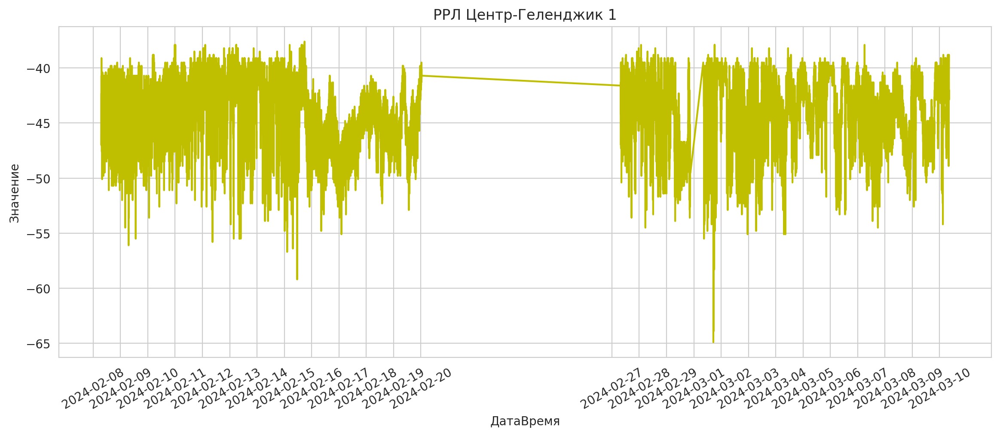

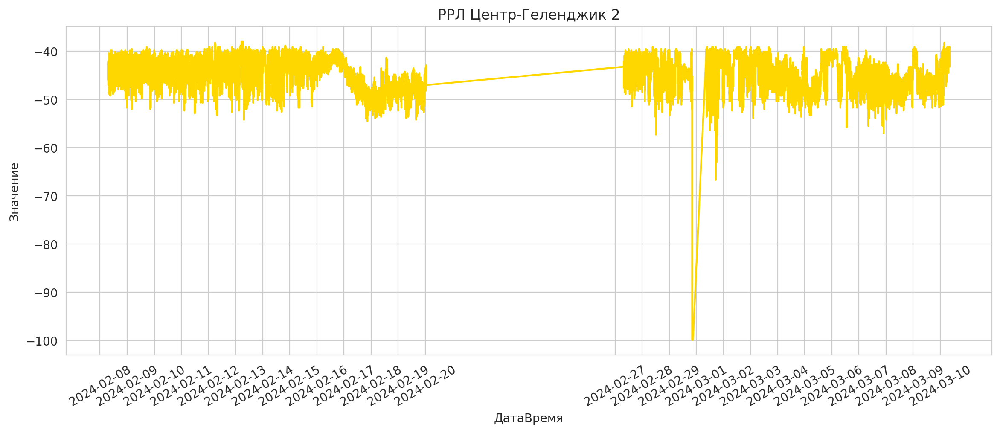

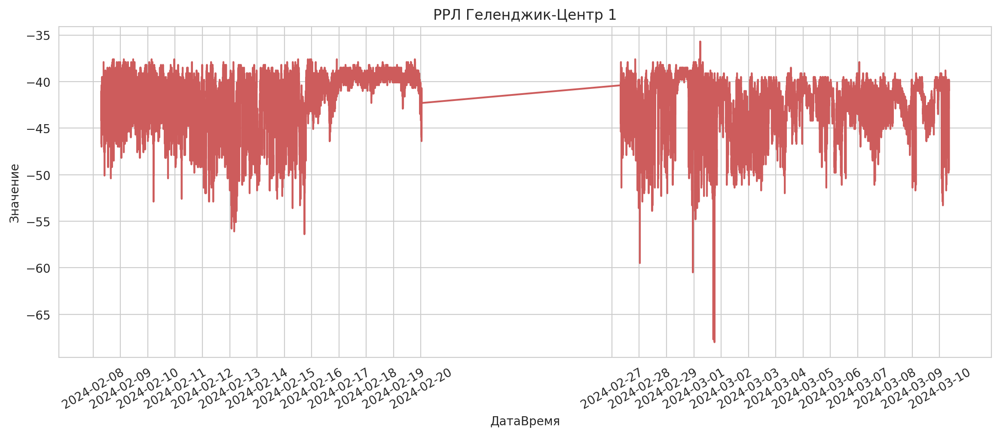

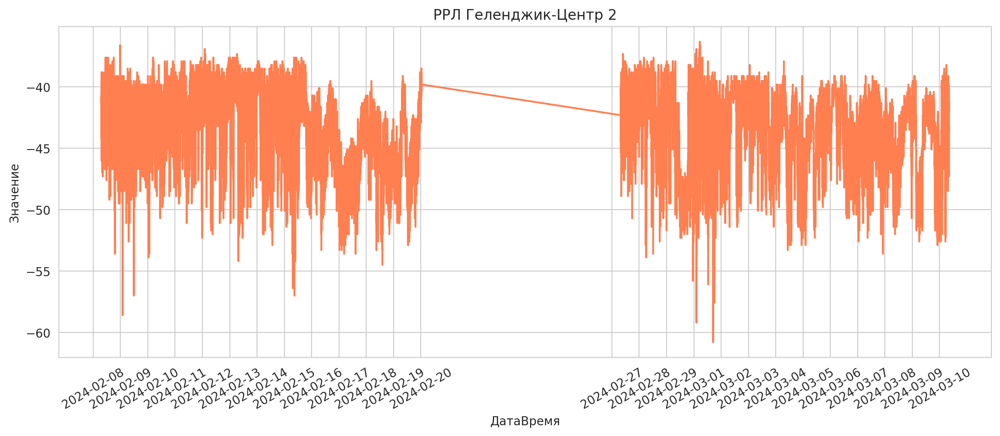

In [41]:
for i in range (0, len(spisok_df)):
    get_plot(spisok_df, colors, spisok_title)
    

### Распределение уровни сигнала РРЛ Геленджик.

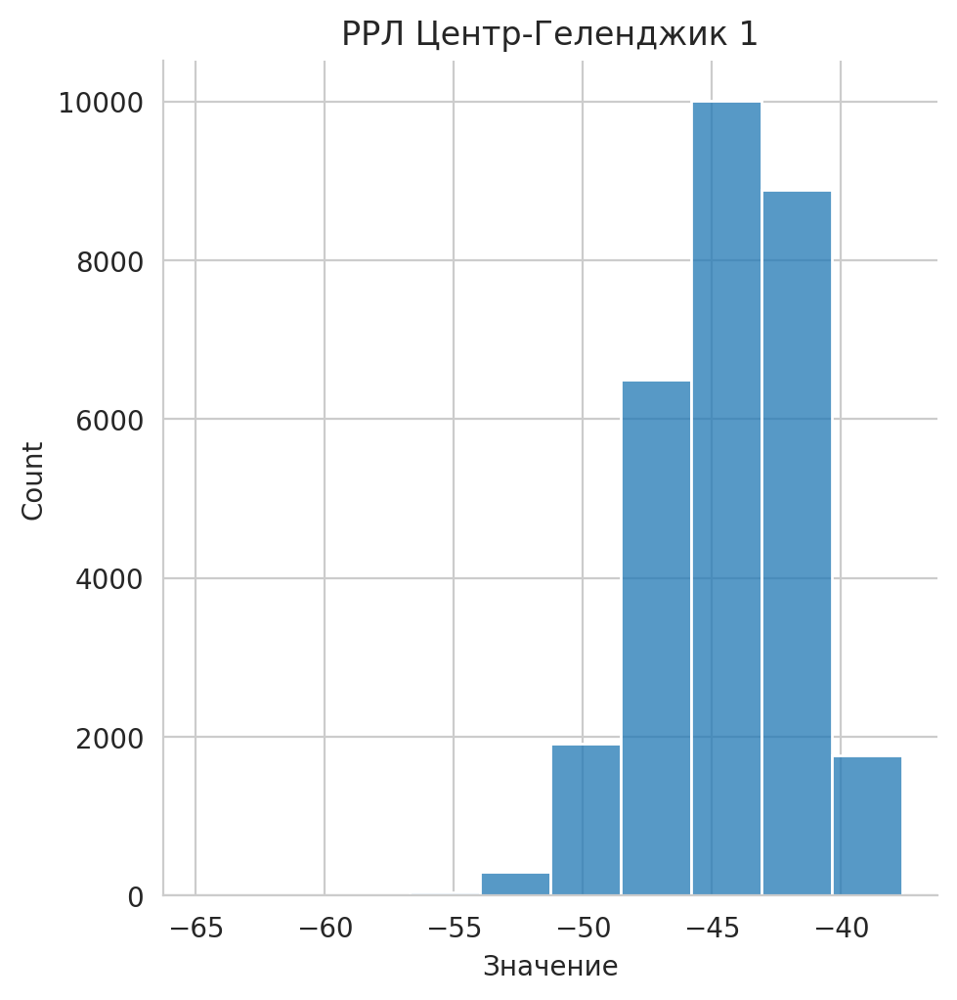

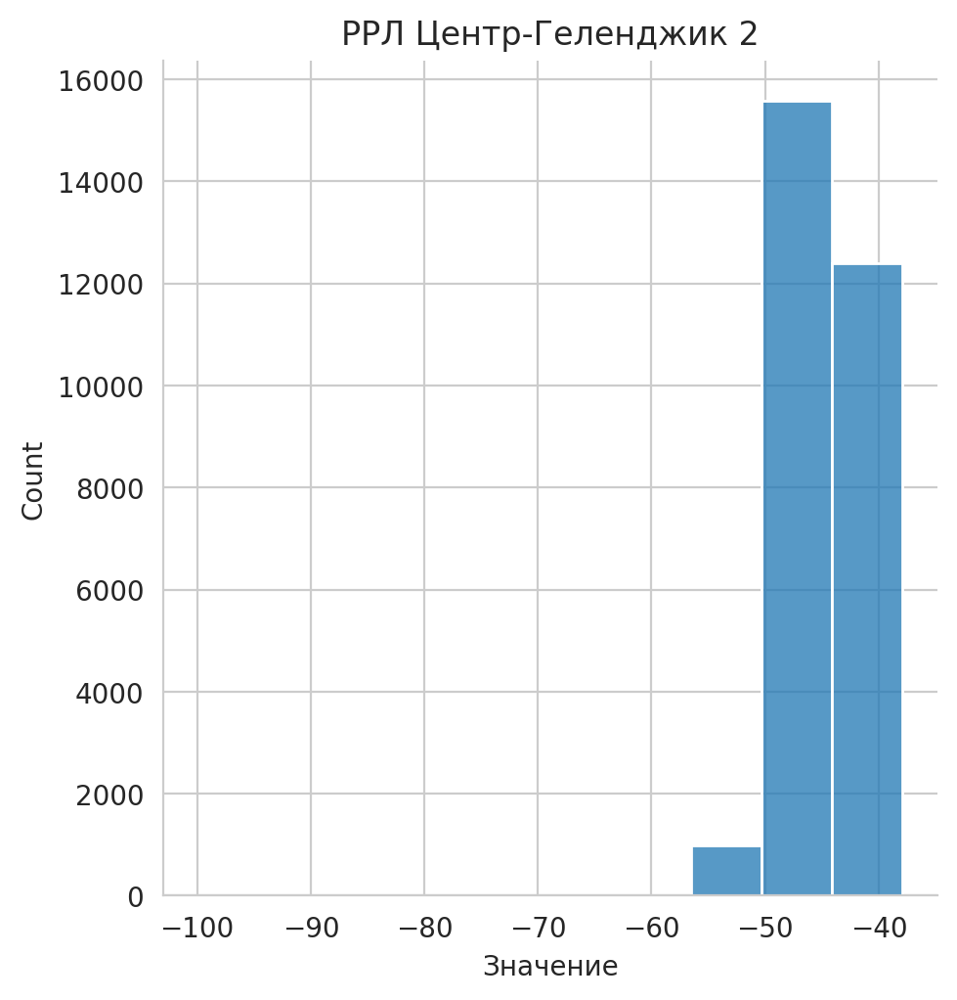

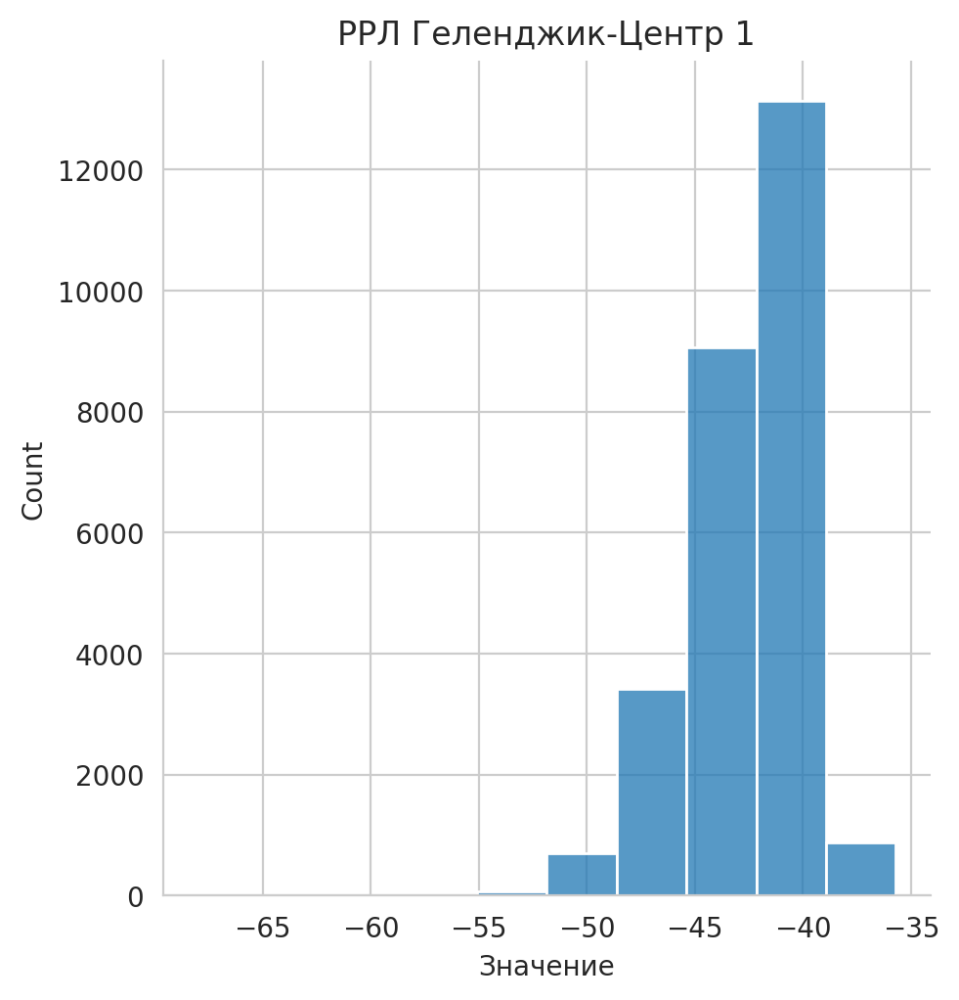

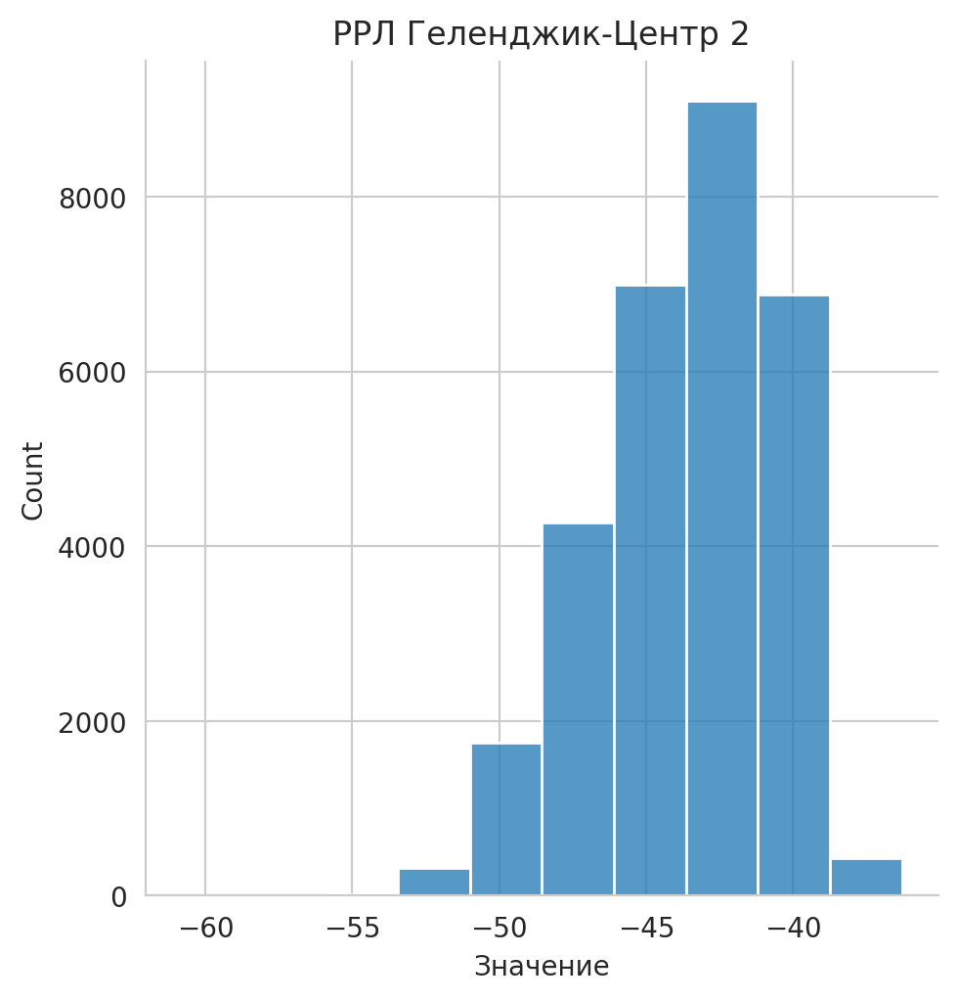

In [42]:
for i in range (0, len(spisok_df)):
    get_plot_dis(spisok_df, spisok_title)
    

## Средние значения и медиана по дням уровня сигнала РРЛ Геленджик.

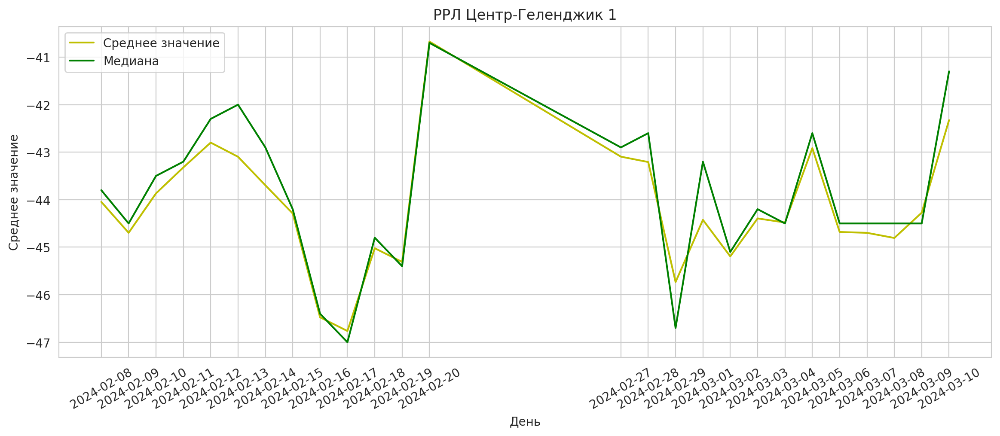

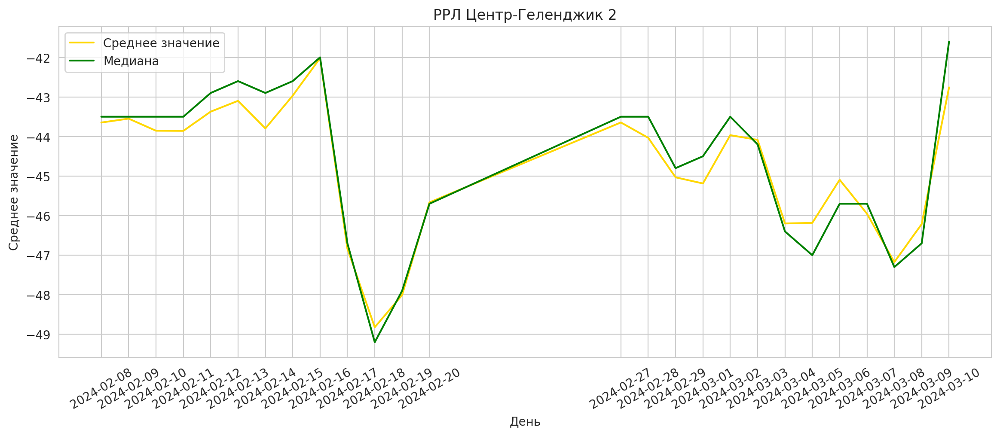

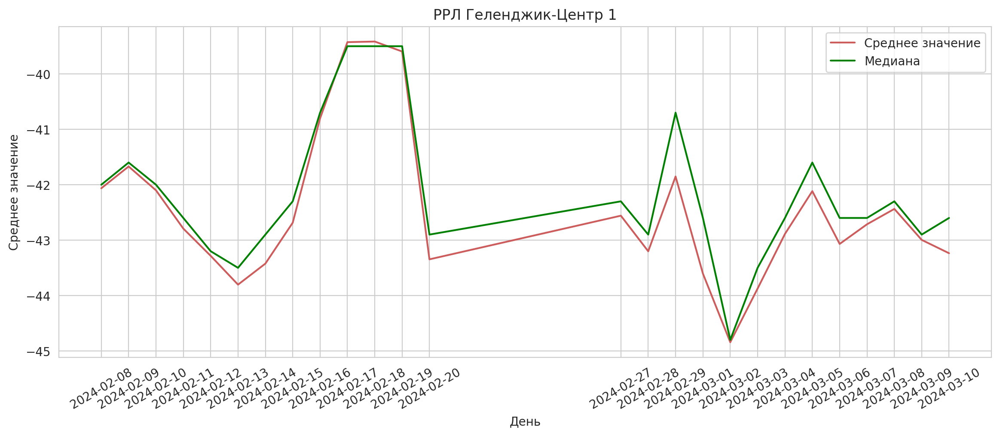

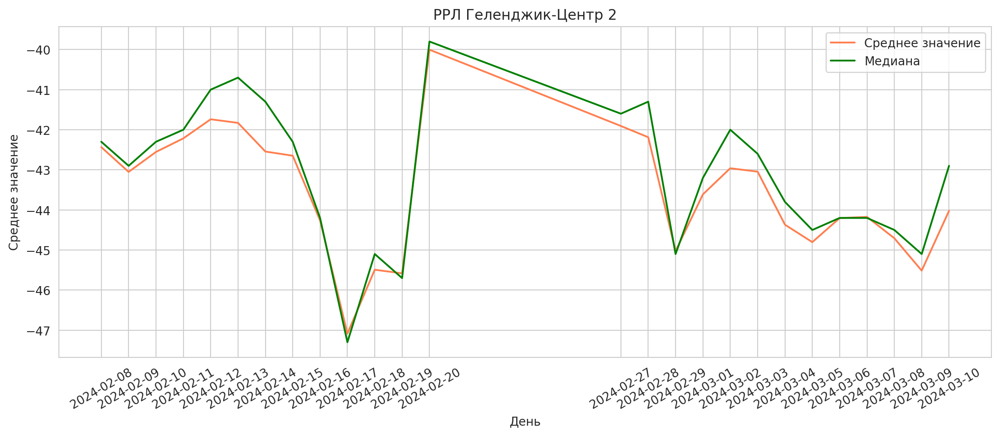

In [43]:
for i in range (0, len(spisok_df)):
    get_plot_mean(spisok_df, spisok_title)
    

### Интервалы между записями в БД сигнала РРЛ.

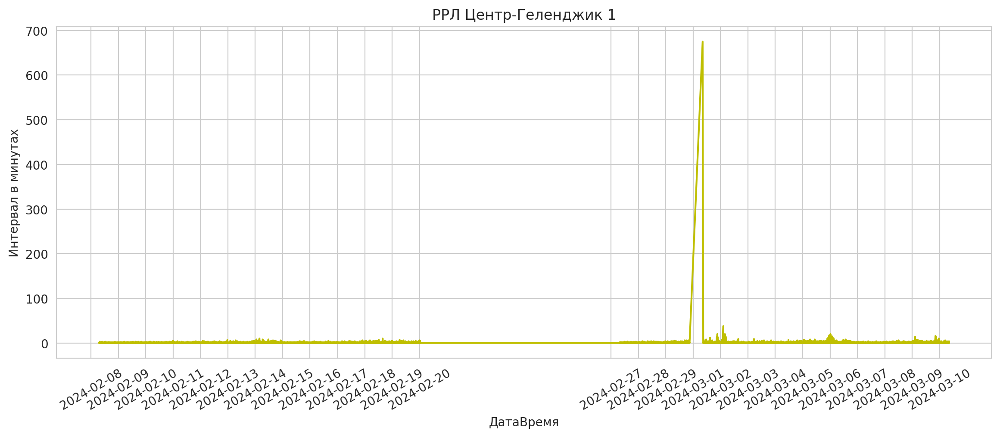

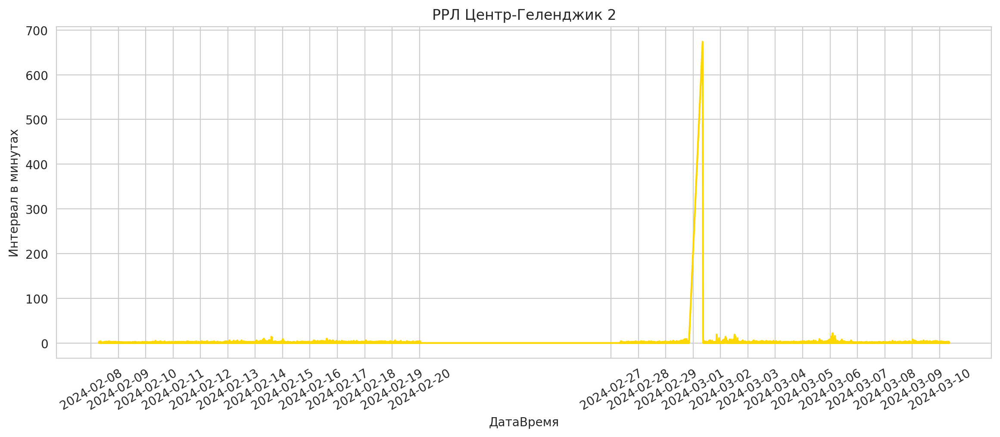

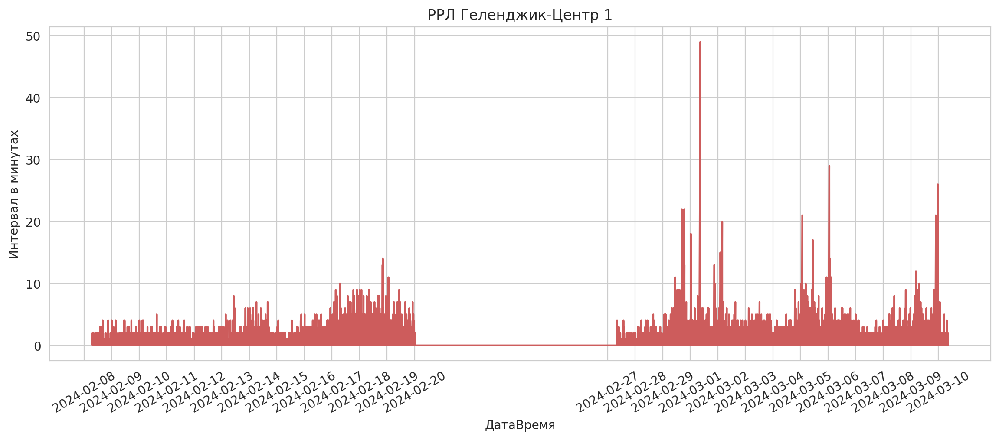

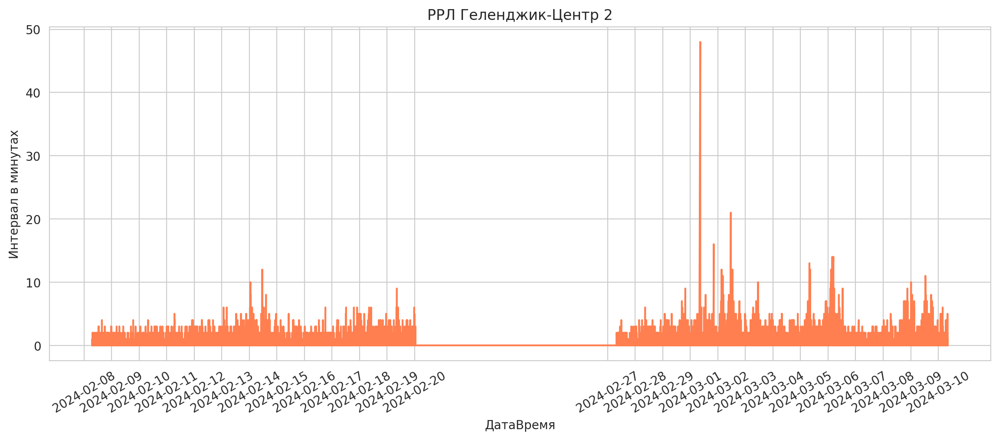

In [44]:
for i in range (0, len(spisok_df)):
    get_plot_int(spisok_df, spisok_title)
    

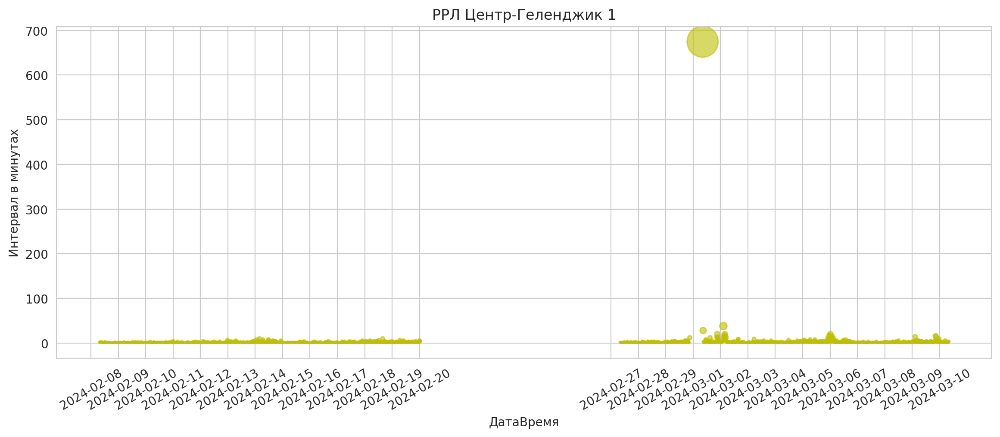

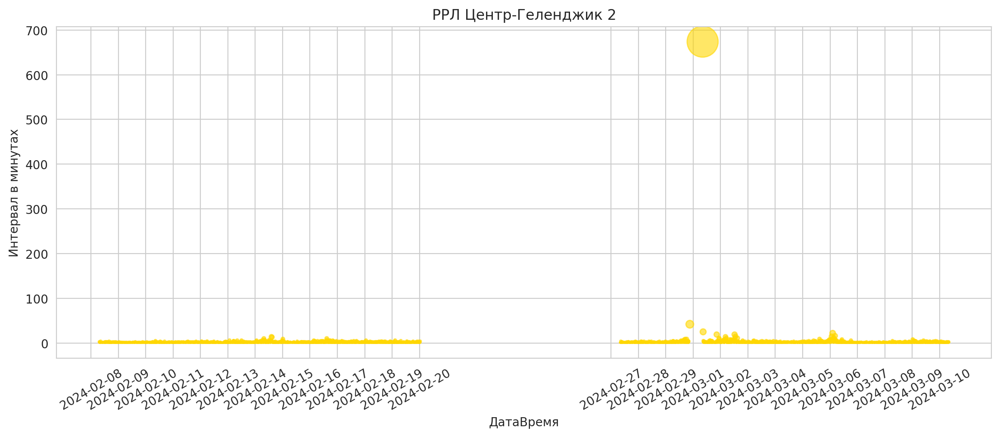

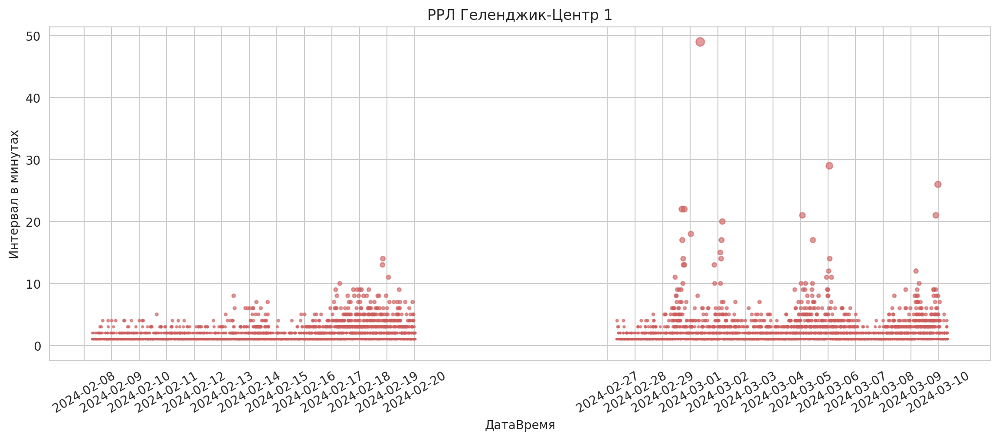

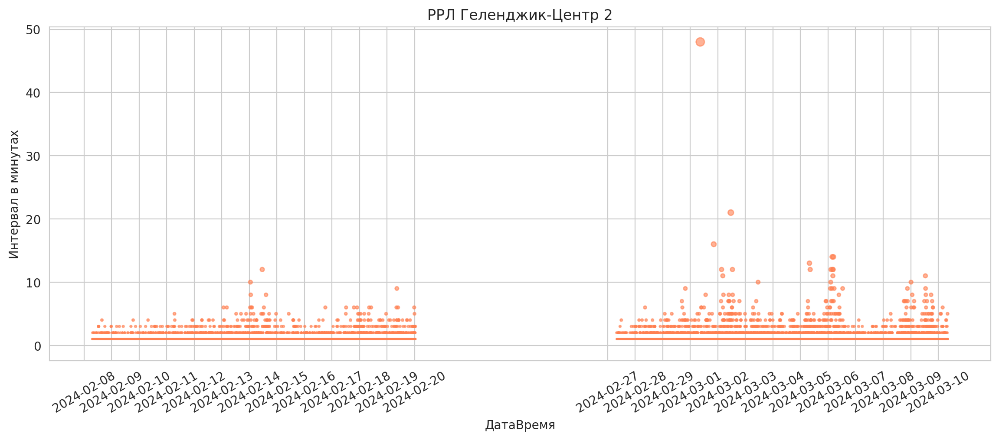

In [45]:
for i in range (0, len(spisok_df)):
    get_plot_int1(spisok_df, colors, spisok_title)
    

## РРЛ Центр - Ю. Озереевка

In [46]:
def get_agg1(df):
    pd.set_option("display.precision", 2)
    np.set_printoptions(precision=2)
    print(df[['Значение', 'Интервал в секундах','Интервал в часах']].agg([np.mean, np.median, np.min, np.max]))
    

### Пролёт Центр - КРТПЦ

In [47]:
df_cen_krtpc1 = df1[(df1['object_id'] == ' MonObj25') &
                    (df1['receiver_id'] == 13) & 
                    (df1['channel_id'] == 7)][['receiver_id', 'ДатаВремя','object_id',
                                                    'channel_id', 'Значение',
                                                    'description', 'unit']]
df_cen_krtpc1 = df_cen_krtpc1.sort_values(['ДатаВремя'],ascending=True).reset_index().drop(columns=['index'])
df_cen_krtpc1['Интервал']=0 # создаем непустой столбец для расчета
df_cen_krtpc1['Интервал в секундах']=0
df_cen_krtpc1['Интервал в часах']=0
for i in range (1, len(df_cen_krtpc1)): # находим интервал между измерениями
    df_cen_krtpc1['Интервал'][i] = (df_cen_krtpc1['ДатаВремя'][i]-df_cen_krtpc1['ДатаВремя'][i-1])
    df_cen_krtpc1['Интервал в секундах'][i] = (df_cen_krtpc1['ДатаВремя'][i]-df_cen_krtpc1['ДатаВремя'][i-1]) \
    .total_seconds()
df_cen_krtpc1['Интервал в часах']=df_cen_krtpc1['Интервал в секундах']/3600
df_cen_krtpc1['Интервал в секундах']=df_cen_krtpc1['Интервал в секундах'].astype(int)
df_cen_krtpc1['Интервал в часах']=df_cen_krtpc1['Интервал в часах'].astype(int)
df_cen_krtpc1 = df_cen_krtpc1.sort_values(['Интервал в секундах'],ascending=False).reset_index().drop(columns=['index'])
df_cen_krtpc1


,receiver_id,ДатаВремя,object_id,channel_id,Значение,description,unit,Интервал,Интервал в секундах,Интервал в часах
0,13,2024-02-27 07:43:02,MonObj25,7,-44.2,"Мощность приёма, Radio1",dB,7 days 06:58:19,629899,174
1,13,2024-02-18 01:16:02,MonObj25,7,-46.0,"Мощность приёма, Radio1",dB,1 days 07:18:32,112712,31
2,13,2024-02-19 06:22:11,MonObj25,7,-45.1,"Мощность приёма, Radio1",dB,0 days 22:44:21,81861,22
3,13,2024-03-09 22:41:01,MonObj25,7,-45.7,"Мощность приёма, Radio1",dB,0 days 13:03:37,47017,13
4,13,2024-02-19 21:57:35,MonObj25,7,-46.0,"Мощность приёма, Radio1",dB,0 days 11:41:26,42086,11
...,...,...,...,...,...,...,...,...,...,...
3775,13,2024-02-29 05:11:24,MonObj25,7,-45.4,"Мощность приёма, Radio1",dB,0 days 00:00:40,40,0
3776,13,2024-02-11 12:12:58,MonObj25,7,-45.7,"Мощность приёма, Radio1",dB,0 days 00:00:40,40,0
3777,13,2024-02-15 04:00:00,MonObj25,7,-44.5,"Мощность приёма, Radio1",dB,0 days 00:00:39,39,0
3778,13,2024-02-27 09:11:02,MonObj25,7,-44.8,"Мощность приёма, Radio1",dB,0 days 00:00:39,39,0


In [48]:
get_agg1(df_cen_krtpc1)


        Значение  Интервал в секундах  Интервал в часах
mean       -45.4               706.98              0.11
median     -45.4               109.00              0.00
amin       -48.9                 0.00              0.00
amax       -42.6            629899.00            174.00


In [49]:
df_cen_krtpc1.to_csv('cen_krtpc1.csv', index=False) # Центр - КРТПЦ 1


In [50]:
df_cen_krtpc1_mean= df_cen_krtpc1.groupby(by= df_cen_krtpc1['ДатаВремя'].dt.date)['Значение'] \
.agg([np.mean, np.median]) \
.reset_index().rename(columns={'ДатаВремя': "День", 'mean': "Среднее значение", 'median': "Медиана"})
df_cen_krtpc1_mean


,День,Среднее значение,Медиана
0,2024-02-08,-45.52,-45.4
1,2024-02-09,-45.59,-45.7
2,2024-02-10,-45.66,-45.7
3,2024-02-11,-45.35,-45.4
4,2024-02-12,-45.27,-45.1
5,2024-02-13,-45.16,-45.1
6,2024-02-14,-45.29,-45.4
7,2024-02-15,-45.52,-45.4
8,2024-02-16,-45.71,-45.7
9,2024-02-18,-45.65,-45.7


In [51]:
df_cen_krtpc2 = df1[(df1['object_id'] == ' MonObj25') &
                    (df1['receiver_id'] == 14) & 
                    (df1['channel_id'] == 8)][['receiver_id', 'ДатаВремя','object_id',
                                                    'channel_id', 'Значение',
                                                    'description', 'unit']]
df_cen_krtpc2 = df_cen_krtpc2.sort_values(['ДатаВремя'],ascending=True).reset_index().drop(columns=['index'])
df_cen_krtpc2['Интервал']=0 # создаем непустой столбец для расчета
df_cen_krtpc2['Интервал в секундах']=0
df_cen_krtpc2['Интервал в часах']=0
for i in range (1, len(df_cen_krtpc2)): # находим интервал между измерениями
    df_cen_krtpc2['Интервал'][i] = (df_cen_krtpc2['ДатаВремя'][i]-df_cen_krtpc2['ДатаВремя'][i-1])
    df_cen_krtpc2['Интервал в секундах'][i] = (df_cen_krtpc2['ДатаВремя'][i]-df_cen_krtpc2['ДатаВремя'][i-1]) \
    .total_seconds()
df_cen_krtpc2['Интервал в часах']=df_cen_krtpc2['Интервал в секундах']/3600
df_cen_krtpc2['Интервал в секундах']=df_cen_krtpc2['Интервал в секундах'].astype(int)
df_cen_krtpc2['Интервал в часах']=df_cen_krtpc2['Интервал в часах'].astype(int)
df_cen_krtpc2 = df_cen_krtpc2.sort_values(['Интервал в секундах'],ascending=False).reset_index().drop(columns=['index'])
df_cen_krtpc2


,receiver_id,ДатаВремя,object_id,channel_id,Значение,description,unit,Интервал,Интервал в секундах,Интервал в часах
0,14,2024-02-27 07:43:02,MonObj25,8,-40.1,"Мощность приёма, Radio2",dB,7 days 06:58:19,629899,174
1,14,2024-02-18 01:16:02,MonObj25,8,-40.7,"Мощность приёма, Radio2",dB,1 days 06:59:21,111561,30
2,14,2024-02-19 05:13:16,MonObj25,8,-40.4,"Мощность приёма, Radio2",dB,0 days 21:24:32,77072,21
3,14,2024-03-09 22:41:01,MonObj25,8,-41.3,"Мощность приёма, Radio2",dB,0 days 12:17:12,44232,12
4,14,2024-02-14 09:11:41,MonObj25,8,-41.3,"Мощность приёма, Radio2",dB,0 days 07:36:08,27368,7
...,...,...,...,...,...,...,...,...,...,...
3990,14,2024-03-02 20:53:57,MonObj25,8,-40.7,"Мощность приёма, Radio2",dB,0 days 00:00:40,40,0
3991,14,2024-02-15 07:41:42,MonObj25,8,-40.4,"Мощность приёма, Radio2",dB,0 days 00:00:40,40,0
3992,14,2024-03-01 08:11:17,MonObj25,8,-40.4,"Мощность приёма, Radio2",dB,0 days 00:00:40,40,0
3993,14,2024-02-27 09:11:02,MonObj25,8,-40.4,"Мощность приёма, Radio2",dB,0 days 00:00:39,39,0


In [52]:
get_agg1(df_cen_krtpc2)


        Значение  Интервал в секундах  Интервал в часах
mean      -40.44               668.12               0.1
median    -40.40               105.00               0.0
amin      -43.50                 0.00               0.0
amax      -38.20            629899.00             174.0


In [53]:
df_cen_krtpc2.to_csv('cen_krtpc2.csv', index=False) # Центр - КРТПЦ 2


In [54]:
df_cen_krtpc2_mean= df_cen_krtpc2.groupby(by= df_cen_krtpc2['ДатаВремя'].dt.date)['Значение'] \
.agg([np.mean, np.median]) \
.reset_index().rename(columns={'ДатаВремя': "День", 'mean': "Среднее значение", 'median': "Медиана"})
df_cen_krtpc2_mean


,День,Среднее значение,Медиана
0,2024-02-08,-40.31,-40.40
1,2024-02-09,-40.56,-40.70
2,2024-02-10,-40.43,-40.40
3,2024-02-11,-40.30,-40.40
4,2024-02-12,-40.52,-40.70
5,2024-02-13,-40.64,-40.70
6,2024-02-14,-40.37,-40.40
7,2024-02-15,-40.38,-40.40
8,2024-02-16,-40.53,-40.70
9,2024-02-18,-40.25,-40.40


In [55]:
df_krtpc_cen1 = df1[(df1['object_id'] == ' MonObj28') &
                    (df1['receiver_id'] == 15) & 
                    (df1['channel_id'] == 9)][['receiver_id', 'ДатаВремя','object_id',
                                                    'channel_id', 'Значение',
                                                    'description', 'unit']]
df_krtpc_cen1 = df_krtpc_cen1.sort_values(['ДатаВремя'],ascending=True).reset_index().drop(columns=['index'])
df_krtpc_cen1['Интервал']=0 # создаем непустой столбец для расчета
df_krtpc_cen1['Интервал в секундах']=0
df_krtpc_cen1['Интервал в часах']=0
for i in range (1, len(df_krtpc_cen1)): # находим интервал между измерениями
    df_krtpc_cen1['Интервал'][i] = (df_krtpc_cen1['ДатаВремя'][i]-df_krtpc_cen1['ДатаВремя'][i-1])
    df_krtpc_cen1['Интервал в секундах'][i] = (df_krtpc_cen1['ДатаВремя'][i]-df_krtpc_cen1['ДатаВремя'][i-1]) \
    .total_seconds()
df_krtpc_cen1['Интервал в часах']=df_krtpc_cen1['Интервал в секундах']/3600
df_krtpc_cen1['Интервал в секундах']=df_krtpc_cen1['Интервал в секундах'].astype(int)
df_krtpc_cen1['Интервал в часах']=df_krtpc_cen1['Интервал в часах'].astype(int)
df_krtpc_cen1 = df_krtpc_cen1.sort_values(['Интервал в секундах'],ascending=False).reset_index().drop(columns=['index'])
df_krtpc_cen1


,receiver_id,ДатаВремя,object_id,channel_id,Значение,description,unit,Интервал,Интервал в секундах,Интервал в часах
0,15,2024-02-27 07:43:05,MonObj28,9,-43.2,"Мощность приёма, Radio4",dB,7 days 07:07:25,630445,175
1,15,2024-02-18 03:48:34,MonObj28,9,-43.5,"Мощность приёма, Radio4",dB,1 days 08:44:47,117887,32
2,15,2024-02-19 05:15:46,MonObj28,9,-44.2,"Мощность приёма, Radio4",dB,0 days 20:16:24,72984,20
3,15,2024-02-19 21:56:22,MonObj28,9,-44.2,"Мощность приёма, Radio4",dB,0 days 10:41:00,38460,10
4,15,2024-03-09 20:55:55,MonObj28,9,-49.2,"Мощность приёма, Radio4",dB,0 days 09:52:02,35522,9
...,...,...,...,...,...,...,...,...,...,...
3766,15,2024-02-15 07:09:39,MonObj28,9,-45.1,"Мощность приёма, Radio4",dB,0 days 00:00:44,44,0
3767,15,2024-02-12 03:30:06,MonObj28,9,-44.5,"Мощность приёма, Radio4",dB,0 days 00:00:44,44,0
3768,15,2024-02-12 03:23:29,MonObj28,9,-44.5,"Мощность приёма, Radio4",dB,0 days 00:00:44,44,0
3769,15,2024-02-12 02:44:31,MonObj28,9,-44.8,"Мощность приёма, Radio4",dB,0 days 00:00:44,44,0


In [56]:
get_agg1(df_krtpc_cen1)


        Значение  Интервал в секундах  Интервал в часах
mean      -45.88               706.36              0.11
median    -44.50               107.00              0.00
amin      -52.00                 0.00              0.00
amax      -42.00            630445.00            175.00


In [57]:
df_krtpc_cen1.to_csv('krtpc_cen1.csv', index=False) # КРТПЦ - Центр 1


In [58]:
df_krtpc_cen1_mean= df_krtpc_cen1.groupby(by= df_krtpc_cen1['ДатаВремя'].dt.date)['Значение'] \
.agg([np.mean, np.median]) \
.reset_index().rename(columns={'ДатаВремя': "День", 'mean': "Среднее значение", 'median': "Медиана"})
df_krtpc_cen1_mean


,День,Среднее значение,Медиана
0,2024-02-08,-44.02,-43.8
1,2024-02-09,-44.17,-44.2
2,2024-02-10,-44.29,-44.2
3,2024-02-11,-44.10,-44.2
4,2024-02-12,-44.10,-44.2
5,2024-02-13,-43.93,-43.8
6,2024-02-14,-44.00,-43.8
7,2024-02-15,-44.14,-44.2
8,2024-02-16,-44.19,-44.2
9,2024-02-18,-43.83,-43.8


In [59]:
df_krtpc_cen2 = df1[(df1['object_id'] == ' MonObj28') &
                    (df1['receiver_id'] == 16) & 
                    (df1['channel_id'] == 10)][['receiver_id', 'ДатаВремя','object_id',
                                                    'channel_id', 'Значение',
                                                    'description', 'unit']]
df_krtpc_cen2 = df_krtpc_cen2.sort_values(['ДатаВремя'],ascending=True).reset_index().drop(columns=['index'])
df_krtpc_cen2['Интервал']=0 # создаем непустой столбец для расчета
df_krtpc_cen2['Интервал в секундах']=0
df_krtpc_cen2['Интервал в часах']=0
for i in range (1, len(df_krtpc_cen2)): # находим интервал между измерениями
    df_krtpc_cen2['Интервал'][i] = (df_krtpc_cen2['ДатаВремя'][i]-df_krtpc_cen2['ДатаВремя'][i-1])
    df_krtpc_cen2['Интервал в секундах'][i] = (df_krtpc_cen2['ДатаВремя'][i]-df_krtpc_cen2['ДатаВремя'][i-1]) \
    .total_seconds()
df_krtpc_cen2['Интервал в часах']=df_krtpc_cen2['Интервал в секундах']/3600
df_krtpc_cen2['Интервал в секундах']=df_krtpc_cen2['Интервал в секундах'].astype(int)
df_krtpc_cen2['Интервал в часах']=df_krtpc_cen2['Интервал в часах'].astype(int)
df_krtpc_cen2 = df_krtpc_cen2.sort_values(['Интервал в секундах'],ascending=False).reset_index().drop(columns=['index'])
df_krtpc_cen2


,receiver_id,ДатаВремя,object_id,channel_id,Значение,description,unit,Интервал,Интервал в секундах,Интервал в часах
0,16,2024-02-27 07:43:06,MonObj28,10,-39.1,"Мощность приёма, Radio5",dB,7 days 07:07:25,630445,175
1,16,2024-02-18 03:48:34,MonObj28,10,-39.5,"Мощность приёма, Radio5",dB,1 days 06:08:17,108497,30
2,16,2024-02-19 05:41:14,MonObj28,10,-39.5,"Мощность приёма, Radio5",dB,0 days 21:10:39,76239,21
3,16,2024-03-05 07:21:35,MonObj28,10,-44.8,"Мощность приёма, Radio5",dB,0 days 11:38:22,41902,11
4,16,2024-03-09 22:14:09,MonObj28,10,-44.5,"Мощность приёма, Radio5",dB,0 days 11:23:35,41015,11
...,...,...,...,...,...,...,...,...,...,...
4114,16,2024-02-28 13:14:39,MonObj28,10,-40.1,"Мощность приёма, Radio5",dB,0 days 00:00:44,44,0
4115,16,2024-03-03 02:10:36,MonObj28,10,-44.5,"Мощность приёма, Radio5",dB,0 days 00:00:44,44,0
4116,16,2024-02-13 11:49:10,MonObj28,10,-40.4,"Мощность приёма, Radio5",dB,0 days 00:00:44,44,0
4117,16,2024-02-27 11:59:56,MonObj28,10,-39.1,"Мощность приёма, Radio5",dB,0 days 00:00:44,44,0


In [60]:
get_agg1(df_krtpc_cen2)


        Значение  Интервал в секундах  Интервал в часах
mean      -41.42               648.12               0.1
median    -40.40               106.00               0.0
amin      -47.90                 0.00               0.0
amax      -37.30            630445.00             175.0


In [61]:
df_krtpc_cen2.to_csv('krtpc_cen2.csv', index=False) # КРТПЦ - Центр 2


In [62]:
df_krtpc_cen2_mean= df_krtpc_cen2.groupby(by= df_krtpc_cen2['ДатаВремя'].dt.date)['Значение'] \
.agg([np.mean, np.median]) \
.reset_index().rename(columns={'ДатаВремя': "День", 'mean': "Среднее значение", 'median': "Медиана"})
df_krtpc_cen2_mean


,День,Среднее значение,Медиана
0,2024-02-08,-39.86,-39.8
1,2024-02-09,-39.98,-40.1
2,2024-02-10,-40.14,-40.1
3,2024-02-11,-39.94,-39.8
4,2024-02-12,-39.94,-40.1
5,2024-02-13,-39.73,-39.8
6,2024-02-14,-39.83,-39.8
7,2024-02-15,-40.04,-40.1
8,2024-02-16,-40.43,-40.4
9,2024-02-18,-39.70,-39.5


### Пролёт КРТПЦ - Абрау

In [63]:
df_krtpc_abrau1 = df1[(df1['object_id'] == ' MonObj28') &
                    (df1['receiver_id'] == 17) & 
                    (df1['channel_id'] == 11)][['receiver_id', 'ДатаВремя','object_id',
                                                    'channel_id', 'Значение',
                                                    'description', 'unit']]
df_krtpc_abrau1 = df_krtpc_abrau1.sort_values(['ДатаВремя'],ascending=True).reset_index().drop(columns=['index'])
df_krtpc_abrau1['Интервал']=0 # создаем непустой столбец для расчета
df_krtpc_abrau1['Интервал в секундах']=0
df_krtpc_abrau1['Интервал в часах']=0
for i in range (1, len(df_krtpc_abrau1)): # находим интервал между измерениями
    df_krtpc_abrau1['Интервал'][i] = (df_krtpc_abrau1['ДатаВремя'][i]-df_krtpc_abrau1['ДатаВремя'][i-1])
    df_krtpc_abrau1['Интервал в секундах'][i] = (df_krtpc_abrau1['ДатаВремя'][i]-df_krtpc_abrau1['ДатаВремя'][i-1]) \
    .total_seconds()
df_krtpc_abrau1['Интервал в часах']=df_krtpc_abrau1['Интервал в секундах']/3600
df_krtpc_abrau1['Интервал в секундах']=df_krtpc_abrau1['Интервал в секундах'].astype(int)
df_krtpc_abrau1['Интервал в часах']=df_krtpc_abrau1['Интервал в часах'].astype(int)
df_krtpc_abrau1 = df_krtpc_abrau1.sort_values(['Интервал в секундах'],ascending=False).reset_index() \
.drop(columns=['index'])
df_krtpc_abrau1


,receiver_id,ДатаВремя,object_id,channel_id,Значение,description,unit,Интервал,Интервал в секундах,Интервал в часах
0,17,2024-02-27 07:43:26,MonObj28,11,-39.8,"Мощность приема, Radio2",dB,7 days 07:02:26,630146,175
1,17,2024-02-16 07:34:00,MonObj28,11,-40.7,"Мощность приема, Radio2",dB,0 days 08:53:36,32016,8
2,17,2024-02-17 09:51:22,MonObj28,11,-39.1,"Мощность приема, Radio2",dB,0 days 08:49:33,31773,8
3,17,2024-03-08 09:58:24,MonObj28,11,-39.1,"Мощность приема, Radio2",dB,0 days 08:19:37,29977,8
4,17,2024-02-19 05:16:05,MonObj28,11,-39.1,"Мощность приема, Radio2",dB,0 days 07:18:05,26285,7
...,...,...,...,...,...,...,...,...,...,...
7881,17,2024-03-09 03:16:56,MonObj28,11,-39.1,"Мощность приема, Radio2",dB,0 days 00:00:41,41,0
7882,17,2024-03-06 08:46:31,MonObj28,11,-38.8,"Мощность приема, Radio2",dB,0 days 00:00:40,40,0
7883,17,2024-03-09 11:01:32,MonObj28,11,-39.5,"Мощность приема, Radio2",dB,0 days 00:00:40,40,0
7884,17,2024-02-28 15:16:27,MonObj28,11,-39.5,"Мощность приема, Radio2",dB,0 days 00:00:35,35,0


In [64]:
get_agg1(df_krtpc_abrau1)


        Значение  Интервал в секундах  Интервал в часах
mean      -39.34               338.29              0.04
median    -39.50                93.00              0.00
amin      -43.20                 0.00              0.00
amax      -35.10            630146.00            175.00


In [65]:
df_krtpc_abrau1.to_csv('krtpc_abrau1.csv', index=False) # КРТПЦ - Абрау 1


In [66]:
df_krtpc_abrau1_mean= df_krtpc_abrau1.groupby(by= df_krtpc_abrau1['ДатаВремя'].dt.date)['Значение'] \
.agg([np.mean, np.median]) \
.reset_index().rename(columns={'ДатаВремя': "День", 'mean': "Среднее значение", 'median': "Медиана"})
df_krtpc_abrau1_mean


,День,Среднее значение,Медиана
0,2024-02-08,-39.72,-39.8
1,2024-02-09,-39.91,-39.8
2,2024-02-10,-39.50,-39.5
3,2024-02-11,-39.38,-39.5
4,2024-02-12,-39.39,-39.5
5,2024-02-13,-39.33,-39.5
6,2024-02-14,-39.30,-39.5
7,2024-02-15,-39.26,-39.1
8,2024-02-16,-39.45,-39.5
9,2024-02-17,-39.30,-39.3


In [67]:
df_krtpc_abrau2 = df1[(df1['object_id'] == ' MonObj28') &
                    (df1['receiver_id'] == 18) & 
                    (df1['channel_id'] == 12)][['receiver_id', 'ДатаВремя','object_id',
                                                    'channel_id', 'Значение',
                                                    'description', 'unit']]
df_krtpc_abrau2 = df_krtpc_abrau2.sort_values(['ДатаВремя'],ascending=True).reset_index().drop(columns=['index'])
df_krtpc_abrau2['Интервал']=0 # создаем непустой столбец для расчета
df_krtpc_abrau2['Интервал в секундах']=0
df_krtpc_abrau2['Интервал в часах']=0
for i in range (1, len(df_krtpc_abrau2)): # находим интервал между измерениями
    df_krtpc_abrau2['Интервал'][i] = (df_krtpc_abrau2['ДатаВремя'][i]-df_krtpc_abrau2['ДатаВремя'][i-1])
    df_krtpc_abrau2['Интервал в секундах'][i] = (df_krtpc_abrau2['ДатаВремя'][i]-df_krtpc_abrau2['ДатаВремя'][i-1]) \
    .total_seconds()
df_krtpc_abrau2['Интервал в часах']=df_krtpc_abrau2['Интервал в секундах']/3600
df_krtpc_abrau2['Интервал в секундах']=df_krtpc_abrau2['Интервал в секундах'].astype(int)
df_krtpc_abrau2['Интервал в часах']=df_krtpc_abrau2['Интервал в часах'].astype(int)
df_krtpc_abrau2 = df_krtpc_abrau2.sort_values(['Интервал в секундах'],ascending=False).reset_index() \
.drop(columns=['index'])
df_krtpc_abrau2


,receiver_id,ДатаВремя,object_id,channel_id,Значение,description,unit,Интервал,Интервал в секундах,Интервал в часах
0,18,2024-02-27 07:43:27,MonObj28,12,-35.1,"Мощность приема, Radio3",dB,7 days 14:41:53,657713,182
1,18,2024-02-17 15:44:50,MonObj28,12,-34.7,"Мощность приема, Radio3",dB,0 days 17:10:41,61841,17
2,18,2024-03-05 09:27:38,MonObj28,12,-34.7,"Мощность приема, Radio3",dB,0 days 10:18:10,37090,10
3,18,2024-02-19 05:16:05,MonObj28,12,-34.7,"Мощность приема, Radio3",dB,0 days 09:38:25,34705,9
4,18,2024-03-07 09:56:42,MonObj28,12,-34.7,"Мощность приема, Radio3",dB,0 days 09:37:38,34658,9
...,...,...,...,...,...,...,...,...,...,...
7402,18,2024-02-15 03:53:35,MonObj28,12,-34.7,"Мощность приема, Radio3",dB,0 days 00:00:43,43,0
7403,18,2024-03-07 12:16:54,MonObj28,12,-34.7,"Мощность приема, Radio3",dB,0 days 00:00:43,43,0
7404,18,2024-02-11 22:28:58,MonObj28,12,-34.7,"Мощность приема, Radio3",dB,0 days 00:00:43,43,0
7405,18,2024-03-09 04:01:54,MonObj28,12,-35.1,"Мощность приема, Radio3",dB,0 days 00:00:38,38,0


In [68]:
get_agg1(df_krtpc_abrau2)


        Значение  Интервал в секундах  Интервал в часах
mean      -34.96               360.54              0.05
median    -35.10                91.00              0.00
amin      -39.10                 0.00              0.00
amax      -29.70            657713.00            182.00


In [69]:
df_krtpc_abrau2.to_csv('krtpc_abrau2.csv', index=False) # КРТПЦ - Абрау 2


In [70]:
df_krtpc_abrau2_mean= df_krtpc_abrau2.groupby(by= df_krtpc_abrau2['ДатаВремя'].dt.date)['Значение'] \
.agg([np.mean, np.median]) \
.reset_index().rename(columns={'ДатаВремя': "День", 'mean': "Среднее значение", 'median': "Медиана"})
df_krtpc_abrau2_mean


,День,Среднее значение,Медиана
0,2024-02-08,-35.32,-35.4
1,2024-02-09,-35.56,-35.4
2,2024-02-10,-35.09,-35.1
3,2024-02-11,-34.98,-35.1
4,2024-02-12,-34.99,-35.1
5,2024-02-13,-34.91,-35.1
6,2024-02-14,-34.90,-35.1
7,2024-02-15,-34.89,-34.7
8,2024-02-16,-35.72,-35.1
9,2024-02-17,-34.90,-34.9


In [71]:
df_abrau_krtpc1 = df1[(df1['object_id'] == ' MonObj27') &
                    (df1['receiver_id'] == 19) & 
                    (df1['channel_id'] == 9)][['receiver_id', 'ДатаВремя','object_id',
                                                    'channel_id', 'Значение',
                                                    'description', 'unit']]
df_abrau_krtpc1 = df_abrau_krtpc1.sort_values(['ДатаВремя'],ascending=True).reset_index().drop(columns=['index'])
df_abrau_krtpc1['Интервал']=0 # создаем непустой столбец для расчета
df_abrau_krtpc1['Интервал в секундах']=0
df_abrau_krtpc1['Интервал в часах']=0
for i in range (1, len(df_abrau_krtpc1)): # находим интервал между измерениями
    df_abrau_krtpc1['Интервал'][i] = (df_abrau_krtpc1['ДатаВремя'][i]-df_abrau_krtpc1['ДатаВремя'][i-1])
    df_abrau_krtpc1['Интервал в секундах'][i] = (df_abrau_krtpc1['ДатаВремя'][i]-df_abrau_krtpc1['ДатаВремя'][i-1]) \
    .total_seconds()
df_abrau_krtpc1['Интервал в часах']=df_abrau_krtpc1['Интервал в секундах']/3600
df_abrau_krtpc1['Интервал в секундах']=df_abrau_krtpc1['Интервал в секундах'].astype(int)
df_abrau_krtpc1['Интервал в часах']=df_abrau_krtpc1['Интервал в часах'].astype(int)
df_abrau_krtpc1 = df_abrau_krtpc1.sort_values(['Интервал в секундах'],ascending=False).reset_index() \
.drop(columns=['index'])
df_abrau_krtpc1


,receiver_id,ДатаВремя,object_id,channel_id,Значение,description,unit,Интервал,Интервал в секундах,Интервал в часах
0,19,2024-02-27 07:43:06,MonObj27,9,-39.1,"Мощность приёма, Radio4",dB,7 days 07:11:37,630697,175
1,19,2024-03-09 23:34:13,MonObj27,9,-38.5,"Мощность приёма, Radio4",dB,0 days 13:37:39,49059,13
2,19,2024-02-28 14:29:55,MonObj27,9,-39.5,"Мощность приёма, Radio4",dB,0 days 12:16:00,44160,12
3,19,2024-02-18 22:19:09,MonObj27,9,-39.5,"Мощность приёма, Radio4",dB,0 days 10:43:07,38587,10
4,19,2024-03-06 04:30:26,MonObj27,9,-39.1,"Мощность приёма, Radio4",dB,0 days 08:46:11,31571,8
...,...,...,...,...,...,...,...,...,...,...
5911,19,2024-02-29 01:53:52,MonObj27,9,-40.7,"Мощность приёма, Radio4",dB,0 days 00:00:45,45,0
5912,19,2024-02-29 00:19:17,MonObj27,9,-39.1,"Мощность приёма, Radio4",dB,0 days 00:00:45,45,0
5913,19,2024-02-28 22:07:06,MonObj27,9,-39.1,"Мощность приёма, Radio4",dB,0 days 00:00:45,45,0
5914,19,2024-02-29 06:54:59,MonObj27,9,-39.5,"Мощность приёма, Radio4",dB,0 days 00:00:45,45,0


In [72]:
get_agg1(df_abrau_krtpc1)


        Значение  Интервал в секундах  Интервал в часах
mean      -39.29               451.35              0.07
median    -39.10                76.50              0.00
amin      -43.50                 0.00              0.00
amax      -35.10            630697.00            175.00


In [73]:
df_abrau_krtpc1.to_csv('abrau_krtpc1.csv', index=False) # Абрау - КРТПЦ 1


In [74]:
df_abrau_krtpc1_mean= df_abrau_krtpc1.groupby(by= df_abrau_krtpc1['ДатаВремя'].dt.date)['Значение'] \
.agg([np.mean, np.median]) \
.reset_index().rename(columns={'ДатаВремя': "День", 'mean': "Среднее значение", 'median': "Медиана"})
df_abrau_krtpc1_mean


,День,Среднее значение,Медиана
0,2024-02-08,-39.34,-39.5
1,2024-02-09,-39.33,-39.5
2,2024-02-10,-39.30,-39.1
3,2024-02-11,-39.28,-39.1
4,2024-02-12,-39.31,-39.1
5,2024-02-13,-39.27,-39.1
6,2024-02-14,-39.12,-39.1
7,2024-02-15,-39.17,-39.1
8,2024-02-16,-39.33,-39.5
9,2024-02-17,-39.30,-39.1


In [75]:
df_abrau_krtpc2 = df1[(df1['object_id'] == ' MonObj27') &
                    (df1['receiver_id'] == 20) & 
                    (df1['channel_id'] == 10)][['receiver_id', 'ДатаВремя','object_id',
                                                    'channel_id', 'Значение',
                                                    'description', 'unit']]
df_abrau_krtpc2 = df_abrau_krtpc2.sort_values(['ДатаВремя'],ascending=True).reset_index().drop(columns=['index'])
df_abrau_krtpc2['Интервал']=0 # создаем непустой столбец для расчета
df_abrau_krtpc2['Интервал в секундах']=0
df_abrau_krtpc2['Интервал в часах']=0
for i in range (1, len(df_abrau_krtpc2)): # находим интервал между измерениями
    df_abrau_krtpc2['Интервал'][i] = (df_abrau_krtpc2['ДатаВремя'][i]-df_abrau_krtpc2['ДатаВремя'][i-1])
    df_abrau_krtpc2['Интервал в секундах'][i] = (df_abrau_krtpc2['ДатаВремя'][i]-df_abrau_krtpc2['ДатаВремя'][i-1]) \
    .total_seconds()
df_abrau_krtpc2['Интервал в часах']=df_abrau_krtpc2['Интервал в секундах']/3600
df_abrau_krtpc2['Интервал в секундах']=df_abrau_krtpc2['Интервал в секундах'].astype(int)
df_abrau_krtpc2['Интервал в часах']=df_abrau_krtpc2['Интервал в часах'].astype(int)
df_abrau_krtpc2 = df_abrau_krtpc2.sort_values(['Интервал в секундах'],ascending=False).reset_index() \
.drop(columns=['index'])
df_abrau_krtpc2


,receiver_id,ДатаВремя,object_id,channel_id,Значение,description,unit,Интервал,Интервал в секундах,Интервал в часах
0,20,2024-02-27 07:43:07,MonObj27,10,-34.7,"Мощность приёма, Radio5",dB,7 days 07:13:39,630819,175
1,20,2024-03-04 23:28:53,MonObj27,10,-35.1,"Мощность приёма, Radio5",dB,0 days 13:12:41,47561,13
2,20,2024-03-09 23:32:10,MonObj27,10,-34.7,"Мощность приёма, Radio5",dB,0 days 12:56:26,46586,12
3,20,2024-02-28 13:24:46,MonObj27,10,-34.7,"Мощность приёма, Radio5",dB,0 days 11:10:51,40251,11
4,20,2024-02-18 22:19:10,MonObj27,10,-35.1,"Мощность приёма, Radio5",dB,0 days 10:43:08,38588,10
...,...,...,...,...,...,...,...,...,...,...
5032,20,2024-02-29 00:19:17,MonObj27,10,-34.7,"Мощность приёма, Radio5",dB,0 days 00:00:45,45,0
5033,20,2024-02-29 07:21:26,MonObj27,10,-35.1,"Мощность приёма, Radio5",dB,0 days 00:00:45,45,0
5034,20,2024-02-29 03:48:40,MonObj27,10,-35.7,"Мощность приёма, Radio5",dB,0 days 00:00:45,45,0
5035,20,2024-02-29 00:33:08,MonObj27,10,-34.7,"Мощность приёма, Radio5",dB,0 days 00:00:45,45,0


In [76]:
get_agg1(df_abrau_krtpc2)


        Значение  Интервал в секундах  Интервал в часах
mean      -34.86               530.22              0.08
median    -34.70               107.00              0.00
amin      -39.80                 0.00              0.00
amax      -30.00            630819.00            175.00


In [77]:
df_abrau_krtpc2.to_csv('abrau_krtpc2.csv', index=False) # Абрау - КРТПЦ 2


In [78]:
df_abrau_krtpc2_mean= df_abrau_krtpc2.groupby(by= df_abrau_krtpc2['ДатаВремя'].dt.date)['Значение'] \
.agg([np.mean, np.median]) \
.reset_index().rename(columns={'ДатаВремя': "День", 'mean': "Среднее значение", 'median': "Медиана"})
df_abrau_krtpc2_mean


,День,Среднее значение,Медиана
0,2024-02-08,-34.90,-35.1
1,2024-02-09,-34.92,-35.1
2,2024-02-10,-34.89,-34.7
3,2024-02-11,-34.84,-34.7
4,2024-02-12,-34.90,-34.7
5,2024-02-13,-34.84,-34.7
6,2024-02-14,-34.69,-34.7
7,2024-02-15,-34.71,-34.7
8,2024-02-16,-34.94,-35.1
9,2024-02-17,-34.90,-34.9


### Пролёт Абрау - Ю.Озереевка

In [79]:
df_abrau_ozer1 = df1[(df1['object_id'] == ' MonObj27') &
                    (df1['receiver_id'] == 21) & 
                    (df1['channel_id'] == 11)][['receiver_id', 'ДатаВремя','object_id',
                                                    'channel_id', 'Значение',
                                                    'description', 'unit']]
df_abrau_ozer1 = df_abrau_ozer1.sort_values(['ДатаВремя'],ascending=True).reset_index().drop(columns=['index'])
df_abrau_ozer1['Интервал']=0 # создаем непустой столбец для расчета
df_abrau_ozer1['Интервал в секундах']=0
df_abrau_ozer1['Интервал в часах']=0
for i in range (1, len(df_abrau_ozer1)): # находим интервал между измерениями
    df_abrau_ozer1['Интервал'][i] = (df_abrau_ozer1['ДатаВремя'][i]-df_abrau_ozer1['ДатаВремя'][i-1])
    df_abrau_ozer1['Интервал в секундах'][i] = (df_abrau_ozer1['ДатаВремя'][i]-df_abrau_ozer1['ДатаВремя'][i-1]) \
    .total_seconds()
df_abrau_ozer1['Интервал в часах']=df_abrau_ozer1['Интервал в секундах']/3600
df_abrau_ozer1['Интервал в секундах']=df_abrau_ozer1['Интервал в секундах'].astype(int)
df_abrau_ozer1['Интервал в часах']=df_abrau_ozer1['Интервал в часах'].astype(int)
df_abrau_ozer1 = df_abrau_ozer1.sort_values(['Интервал в секундах'],ascending=False).reset_index() \
.drop(columns=['index'])
df_abrau_ozer1


,receiver_id,ДатаВремя,object_id,channel_id,Значение,description,unit,Интервал,Интервал в секундах,Интервал в часах
0,21,2024-02-27 07:43:36,MonObj27,11,-41.6,"Мощность приема, Radio2",dB,7 days 22:43:50,686630,190
1,21,2024-02-19 08:59:46,MonObj27,11,-43.5,"Мощность приема, Radio2",dB,3 days 21:34:37,336877,93
2,21,2024-03-09 04:15:20,MonObj27,11,-41.6,"Мощность приема, Radio2",dB,2 days 07:14:00,198840,55
3,21,2024-02-28 11:43:48,MonObj27,11,-41.0,"Мощность приема, Radio2",dB,1 days 03:22:56,98576,27
4,21,2024-02-14 20:37:54,MonObj27,11,-41.0,"Мощность приема, Radio2",dB,1 days 01:24:59,91499,25
...,...,...,...,...,...,...,...,...,...,...
268,21,2024-02-29 04:56:34,MonObj27,11,-41.3,"Мощность приема, Radio2",dB,0 days 00:00:50,50,0
269,21,2024-02-29 02:16:08,MonObj27,11,-42.0,"Мощность приема, Radio2",dB,0 days 00:00:49,49,0
270,21,2024-02-29 00:12:05,MonObj27,11,-41.6,"Мощность приема, Radio2",dB,0 days 00:00:49,49,0
271,21,2024-02-29 05:20:05,MonObj27,11,-42.0,"Мощность приема, Radio2",dB,0 days 00:00:45,45,0


In [80]:
get_agg1(df_abrau_ozer1)


        Значение  Интервал в секундах  Интервал в часах
mean      -41.33              8981.23              2.27
median    -41.30               487.00              0.00
amin      -43.50                 0.00              0.00
amax      -40.40            686630.00            190.00


In [81]:
df_abrau_ozer1.to_csv('abrau_ozer1.csv', index=False) # Абрау - Ю. Озереевка 1


In [82]:
df_abrau_ozer1_mean= df_abrau_ozer1.groupby(by= df_abrau_ozer1['ДатаВремя'].dt.date)['Значение'] \
.agg([np.mean, np.median]) \
.reset_index().rename(columns={'ДатаВремя': "День", 'mean': "Среднее значение", 'median': "Медиана"})
df_abrau_ozer1_mean


,День,Среднее значение,Медиана
0,2024-02-10,-41.41,-41.6
1,2024-02-11,-41.39,-41.6
2,2024-02-12,-41.42,-41.6
3,2024-02-13,-41.45,-41.6
4,2024-02-14,-41.00,-41.0
5,2024-02-15,-41.27,-41.0
6,2024-02-19,-43.50,-43.5
7,2024-02-27,-41.60,-41.6
8,2024-02-28,-41.11,-41.0
9,2024-02-29,-41.41,-41.3


In [83]:
df_abrau_ozer2 = df1[(df1['object_id'] == ' MonObj27') &
                    (df1['receiver_id'] == 22) & 
                    (df1['channel_id'] == 12)][['receiver_id', 'ДатаВремя','object_id',
                                                    'channel_id', 'Значение',
                                                    'description', 'unit']]
df_abrau_ozer2 = df_abrau_ozer2.sort_values(['ДатаВремя'],ascending=True).reset_index().drop(columns=['index'])
df_abrau_ozer2['Интервал']=0 # создаем непустой столбец для расчета
df_abrau_ozer2['Интервал в секундах']=0
df_abrau_ozer2['Интервал в часах']=0
for i in range (1, len(df_abrau_ozer2)): # находим интервал между измерениями
    df_abrau_ozer2['Интервал'][i] = (df_abrau_ozer2['ДатаВремя'][i]-df_abrau_ozer2['ДатаВремя'][i-1])
    df_abrau_ozer2['Интервал в секундах'][i] = (df_abrau_ozer2['ДатаВремя'][i]-df_abrau_ozer2['ДатаВремя'][i-1]) \
    .total_seconds()
df_abrau_ozer2['Интервал в часах']=df_abrau_ozer2['Интервал в секундах']/3600
df_abrau_ozer2['Интервал в секундах']=df_abrau_ozer2['Интервал в секундах'].astype(int)
df_abrau_ozer2['Интервал в часах']=df_abrau_ozer2['Интервал в часах'].astype(int)
df_abrau_ozer2 = df_abrau_ozer2.sort_values(['Интервал в секундах'],ascending=False).reset_index() \
.drop(columns=['index'])
df_abrau_ozer2


,receiver_id,ДатаВремя,object_id,channel_id,Значение,description,unit,Интервал,Интервал в секундах,Интервал в часах
0,22,2024-02-27 07:43:37,MonObj27,12,-36.9,"Мощность приема, Radio3",dB,7 days 19:52:56,676376,187
1,22,2024-02-19 07:48:03,MonObj27,12,-37.3,"Мощность приема, Radio3",dB,2 days 19:23:24,242604,67
2,22,2024-03-09 00:11:36,MonObj27,12,-36.9,"Мощность приема, Radio3",dB,2 days 00:53:07,175987,48
3,22,2024-03-05 18:56:43,MonObj27,12,-36.3,"Мощность приема, Radio3",dB,1 days 06:30:50,109850,30
4,22,2024-02-10 04:34:56,MonObj27,12,-36.9,"Мощность приема, Radio3",dB,1 days 04:58:07,104287,28
...,...,...,...,...,...,...,...,...,...,...
418,22,2024-02-29 05:08:03,MonObj27,12,-36.9,"Мощность приема, Radio3",dB,0 days 00:00:48,48,0
419,22,2024-02-29 04:37:13,MonObj27,12,-37.3,"Мощность приема, Radio3",dB,0 days 00:00:48,48,0
420,22,2024-02-29 05:28:23,MonObj27,12,-36.9,"Мощность приема, Radio3",dB,0 days 00:00:47,47,0
421,22,2024-02-29 07:13:48,MonObj27,12,-37.3,"Мощность приема, Radio3",dB,0 days 00:00:45,45,0


In [84]:
get_agg1(df_abrau_ozer2)


        Значение  Интервал в секундах  Интервал в часах
mean      -36.84              6157.72              1.53
median    -36.90               287.00              0.00
amin      -39.50                 0.00              0.00
amax      -35.70            676376.00            187.00


In [85]:
df_abrau_ozer2.to_csv('abrau_ozer2.csv', index=False) # Абрау - Ю. Озереевка 2


In [86]:
df_abrau_ozer2_mean= df_abrau_ozer2.groupby(by= df_abrau_ozer2['ДатаВремя'].dt.date)['Значение'] \
.agg([np.mean, np.median]) \
.reset_index().rename(columns={'ДатаВремя': "День", 'mean': "Среднее значение", 'median': "Медиана"})
df_abrau_ozer2_mean


,День,Среднее значение,Медиана
0,2024-02-08,-37.10,-37.1
1,2024-02-10,-36.78,-36.9
2,2024-02-11,-36.68,-36.9
3,2024-02-12,-36.70,-36.9
4,2024-02-13,-36.70,-36.9
5,2024-02-14,-36.90,-36.9
6,2024-02-15,-36.87,-36.9
7,2024-02-16,-37.10,-37.1
8,2024-02-19,-38.46,-39.1
9,2024-02-27,-36.90,-36.9


In [87]:
df_ozer_abrau1 = df1[(df1['object_id'] == ' MonObj26') &
                    (df1['receiver_id'] == 23) & 
                    (df1['channel_id'] == 7)][['receiver_id', 'ДатаВремя','object_id',
                                                    'channel_id', 'Значение',
                                                    'description', 'unit']]
df_ozer_abrau1 = df_ozer_abrau1.sort_values(['ДатаВремя'],ascending=True).reset_index().drop(columns=['index'])
df_ozer_abrau1['Интервал']=0 # создаем непустой столбец для расчета
df_ozer_abrau1['Интервал в секундах']=0
df_ozer_abrau1['Интервал в часах']=0
for i in range (1, len(df_ozer_abrau1)): # находим интервал между измерениями
    df_ozer_abrau1['Интервал'][i] = (df_ozer_abrau1['ДатаВремя'][i]-df_ozer_abrau1['ДатаВремя'][i-1])
    df_ozer_abrau1['Интервал в секундах'][i] = (df_ozer_abrau1['ДатаВремя'][i]-df_ozer_abrau1['ДатаВремя'][i-1]) \
    .total_seconds()
df_ozer_abrau1['Интервал в часах']=df_ozer_abrau1['Интервал в секундах']/3600
df_ozer_abrau1['Интервал в секундах']=df_ozer_abrau1['Интервал в секундах'].astype(int)
df_ozer_abrau1['Интервал в часах']=df_ozer_abrau1['Интервал в часах'].astype(int)
df_ozer_abrau1 = df_ozer_abrau1.sort_values(['Интервал в секундах'],ascending=False).reset_index() \
.drop(columns=['index'])
df_ozer_abrau1


,receiver_id,ДатаВремя,object_id,channel_id,Значение,description,unit,Интервал,Интервал в секундах,Интервал в часах
0,23,2024-02-27 07:43:03,MonObj26,7,-42.0,"Мощность приёма, Radio1",dB,7 days 22:44:21,686661,190
1,23,2024-03-10 01:09:46,MonObj26,7,-42.0,"Мощность приёма, Radio1",dB,3 days 03:23:18,271398,75
2,23,2024-02-19 08:58:42,MonObj26,7,-43.5,"Мощность приёма, Radio1",dB,2 days 20:57:09,248229,68
3,23,2024-03-05 18:39:35,MonObj26,7,-41.3,"Мощность приёма, Radio1",dB,2 days 04:16:41,188201,52
4,23,2024-02-14 18:58:03,MonObj26,7,-41.0,"Мощность приёма, Radio1",dB,1 days 03:21:02,98462,27
...,...,...,...,...,...,...,...,...,...,...
325,23,2024-03-01 10:45:48,MonObj26,7,-41.3,"Мощность приёма, Radio1",dB,0 days 00:00:40,40,0
326,23,2024-02-28 14:10:12,MonObj26,7,-41.3,"Мощность приёма, Radio1",dB,0 days 00:00:40,40,0
327,23,2024-03-10 01:22:48,MonObj26,7,-41.6,"Мощность приёма, Radio1",dB,0 days 00:00:39,39,0
328,23,2024-02-29 04:57:36,MonObj26,7,-42.6,"Мощность приёма, Radio1",dB,0 days 00:00:39,39,0


In [88]:
get_agg1(df_ozer_abrau1)


        Значение  Интервал в секундах  Интервал в часах
mean      -41.62              7581.78              1.92
median    -41.60               314.50              0.00
amin      -43.50                 0.00              0.00
amax      -40.70            686661.00            190.00


In [89]:
df_ozer_abrau1.to_csv('ozer_abrau1.csv', index=False) # Ю. Озереевка - Абрау 1


In [90]:
df_ozer_abrau1_mean= df_ozer_abrau1.groupby(by= df_ozer_abrau1['ДатаВремя'].dt.date)['Значение'] \
.agg([np.mean, np.median]) \
.reset_index().rename(columns={'ДатаВремя': "День", 'mean': "Среднее значение", 'median': "Медиана"})
df_ozer_abrau1_mean


,День,Среднее значение,Медиана
0,2024-02-10,-41.74,-41.80
1,2024-02-11,-41.63,-41.60
2,2024-02-12,-41.47,-41.30
3,2024-02-13,-41.44,-41.30
4,2024-02-14,-41.43,-41.30
5,2024-02-15,-41.59,-41.45
6,2024-02-16,-42.60,-42.60
7,2024-02-19,-43.50,-43.50
8,2024-02-27,-42.00,-42.00
9,2024-02-28,-41.46,-41.30


In [91]:
df_ozer_abrau2 = df1[(df1['object_id'] == ' MonObj26') &
                    (df1['receiver_id'] == 24) & 
                    (df1['channel_id'] == 8)][['receiver_id', 'ДатаВремя','object_id',
                                                    'channel_id', 'Значение',
                                                    'description', 'unit']]
df_ozer_abrau2 = df_ozer_abrau2.sort_values(['ДатаВремя'],ascending=True).reset_index().drop(columns=['index'])
df_ozer_abrau2['Интервал']=0 # создаем непустой столбец для расчета
df_ozer_abrau2['Интервал в секундах']=0
df_ozer_abrau2['Интервал в часах']=0
for i in range (1, len(df_ozer_abrau2)): # находим интервал между измерениями
    df_ozer_abrau2['Интервал'][i] = (df_ozer_abrau2['ДатаВремя'][i]-df_ozer_abrau2['ДатаВремя'][i-1])
    df_ozer_abrau2['Интервал в секундах'][i] = (df_ozer_abrau2['ДатаВремя'][i]-df_ozer_abrau2['ДатаВремя'][i-1]) \
    .total_seconds()
df_ozer_abrau2['Интервал в часах']=df_ozer_abrau2['Интервал в секундах']/3600
df_ozer_abrau2['Интервал в секундах']=df_ozer_abrau2['Интервал в секундах'].astype(int)
df_ozer_abrau2['Интервал в часах']=df_ozer_abrau2['Интервал в часах'].astype(int)
df_ozer_abrau2 = df_ozer_abrau2.sort_values(['Интервал в секундах'],ascending=False).reset_index() \
.drop(columns=['index'])
df_ozer_abrau2


,receiver_id,ДатаВремя,object_id,channel_id,Значение,description,unit,Интервал,Интервал в секундах,Интервал в часах
0,24,2024-02-27 07:43:03,MonObj26,8,-37.3,"Мощность приёма, Radio2",dB,7 days 15:29:40,660580,183
1,24,2024-02-09 08:11:36,MonObj26,8,-36.9,"Мощность приёма, Radio2",dB,0 days 18:26:54,66414,18
2,24,2024-02-19 08:59:37,MonObj26,8,-39.5,"Мощность приёма, Radio2",dB,0 days 12:19:48,44388,12
3,24,2024-02-17 10:00:26,MonObj26,8,-36.9,"Мощность приёма, Radio2",dB,0 days 08:48:39,31719,8
4,24,2024-02-16 03:44:15,MonObj26,8,-36.9,"Мощность приёма, Radio2",dB,0 days 08:43:08,31388,8
...,...,...,...,...,...,...,...,...,...,...
6473,24,2024-03-04 11:38:43,MonObj26,8,-37.3,"Мощность приёма, Radio2",dB,0 days 00:00:39,39,0
6474,24,2024-02-29 04:57:36,MonObj26,8,-38.2,"Мощность приёма, Radio2",dB,0 days 00:00:39,39,0
6475,24,2024-02-15 07:12:01,MonObj26,8,-36.9,"Мощность приёма, Radio2",dB,0 days 00:00:39,39,0
6476,24,2024-03-06 18:00:19,MonObj26,8,-36.9,"Мощность приёма, Radio2",dB,0 days 00:00:38,38,0


In [92]:
get_agg1(df_ozer_abrau2)


        Значение  Интервал в секундах  Интервал в часах
mean       -37.1               413.03              0.06
median     -37.3                89.50              0.00
amin       -39.5                 0.00              0.00
amax       -36.0            660580.00            183.00


In [93]:
df_ozer_abrau2.to_csv('ozer_abrau2.csv', index=False) # Ю. Озереевка - Абрау 2


In [94]:
df_ozer_abrau2_mean= df_ozer_abrau2.groupby(by= df_ozer_abrau2['ДатаВремя'].dt.date)['Значение'] \
.agg([np.mean, np.median]) \
.reset_index().rename(columns={'ДатаВремя': "День", 'mean': "Среднее значение", 'median': "Медиана"})
df_ozer_abrau2_mean


,День,Среднее значение,Медиана
0,2024-02-08,-37.10,-37.1
1,2024-02-09,-37.10,-37.1
2,2024-02-10,-37.10,-37.3
3,2024-02-11,-37.10,-37.3
4,2024-02-12,-37.10,-37.1
5,2024-02-13,-37.10,-36.9
6,2024-02-14,-37.09,-37.1
7,2024-02-15,-37.10,-37.3
8,2024-02-16,-37.10,-37.1
9,2024-02-17,-37.10,-37.1


In [95]:
spisok_df1=[df_cen_krtpc1, df_cen_krtpc2, df_krtpc_cen1, df_krtpc_cen2]
spisok_df2=[df_krtpc_abrau1, df_krtpc_abrau2, df_abrau_krtpc1, df_abrau_krtpc2]
spisok_df3=[df_abrau_ozer1, df_abrau_ozer2, df_ozer_abrau1, df_ozer_abrau2]
spisok_df1_mean=[df_cen_krtpc1_mean, df_cen_krtpc2_mean, df_krtpc_cen1_mean, df_krtpc_cen2_mean]
spisok_df2_mean=[df_krtpc_abrau1_mean, df_krtpc_abrau2_mean, df_abrau_krtpc1_mean, df_abrau_krtpc2_mean]
spisok_df3_mean=[df_abrau_ozer1_mean, df_abrau_ozer2_mean, df_ozer_abrau1_mean, df_ozer_abrau2_mean]
spisok_title1=['РРЛ Центр-КРТПЦ 1', 'РРЛ Центр-КРТПЦ 2', 'РРЛ КРТПЦ-Центр 1', 'РРЛ КРТПЦ-Центр 2'] 
spisok_title2=['РРЛ КРТПЦ-Абрау 1', 'РРЛ КРТПЦ-Абрау 2', 'РРЛ Абрау-КРТПЦ 1', 'РРЛ Абрау-КРТПЦ 2']
spisok_title3=['РРЛ Абрау-Ю.Озереевка 1', 'РРЛ Абрау-Ю.Озереевка 2', 
               'РРЛ Ю.Озереевка-Абрау 1', 'РРЛ Ю.Озереевка-Абрау 2']
colors1=['g','g','b','b']
colors2=['brown','brown','gold','gold']
colors3=['indianred','indianred','coral','coral']


In [96]:
def get_plot1(df_spisok,list_colors,list_title):
    plt.figure(figsize=(14, 5))
    ax = sns.lineplot(data = df_spisok[i], x = "ДатаВремя", y = "Значение", color = list_colors[i])
    plt.xticks(np.unique(df_spisok[i]["ДатаВремя"].dt.date.values), rotation=30)                                                                   
    ax.set(title=list_title[i]);
plt.show()
    

In [97]:
def get_plot1_dis(df_spisok, list_title):
    # Распределение значений
    ax = sns.displot(df_spisok[i]['Значение'], kde = False, bins=10)
    ax.set(title=list_title[i]);
plt.show()
    

In [98]:
def get_plot1_mean(df_spisok,list_colors,list_title):
    plt.figure(figsize=(14, 5))
    ax = sns.lineplot(data = df_spisok[i], x = "День", y = "Среднее значение", 
                      color = list_colors[i], label = 'Среднее значение')
    ax1 = sns.lineplot(data = df_spisok[i], x = "День", y = "Медиана", 
                       color = 'red', label = 'Медиана')
    plt.xticks(df_spisok[i]["День"].values, rotation=30)                                                            
    ax.set(title=list_title[i]);
plt.show()
    

In [99]:
def get_plot1_int(df_spisok,list_colors,list_title):
    plt.figure(figsize=(14, 5))
    ax = sns.lineplot(data = df_spisok[i][1:], x = "ДатаВремя", y = "Интервал в часах", color = list_colors[i])
    plt.xticks(np.unique(df_spisok[i]["ДатаВремя"].dt.date.values), rotation=30)
    ax.set(title=list_title[i]);
plt.show()
    

In [100]:
def get_plot1_int1(df_spisok, list_colors, list_title):
    df=df_spisok[i][1:]
    plt.figure(figsize=(14, 5))
    plt.title(list_title[i])
    plt.scatter(df['ДатаВремя'], df['Интервал в часах'], c = list_colors[i], cmap='viridis', 
            s=df['Интервал в часах']*20, alpha = 0.6)
    plt.xlabel('ДатаВремя')
    plt.xticks(np.unique(df_spisok[i]["ДатаВремя"].dt.date.values), rotation=30)
    plt.ylabel('Интервал в часах');
plt.show()

In [101]:
def get_plot1_int2(df_spisok, list_colors, list_title):
    df=df_spisok[i][1:]
    plt.figure(figsize=(14, 8))
    plt.title(list_title[i])
    plt.scatter(df['ДатаВремя'], df['Интервал в часах'], c = list_colors[i], cmap='viridis', 
            s=df['Интервал в часах']*10, alpha = 0.6)
    plt.xlabel('ДатаВремя')
    plt.xticks(np.unique(df_spisok[i]["ДатаВремя"].dt.date.values), rotation=30)
    plt.ylabel('Интервал в часах');
plt.show()

### Уровни сигнала РРЛ между ЦСУДС и КРТПЦ.

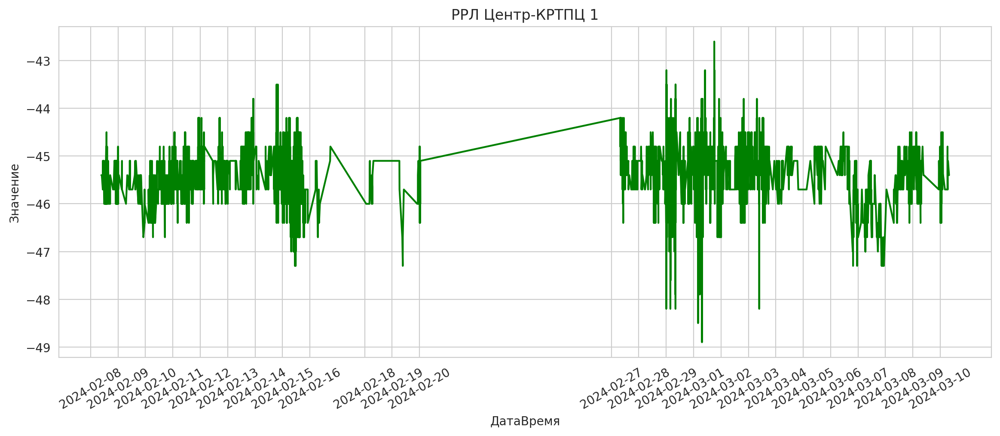

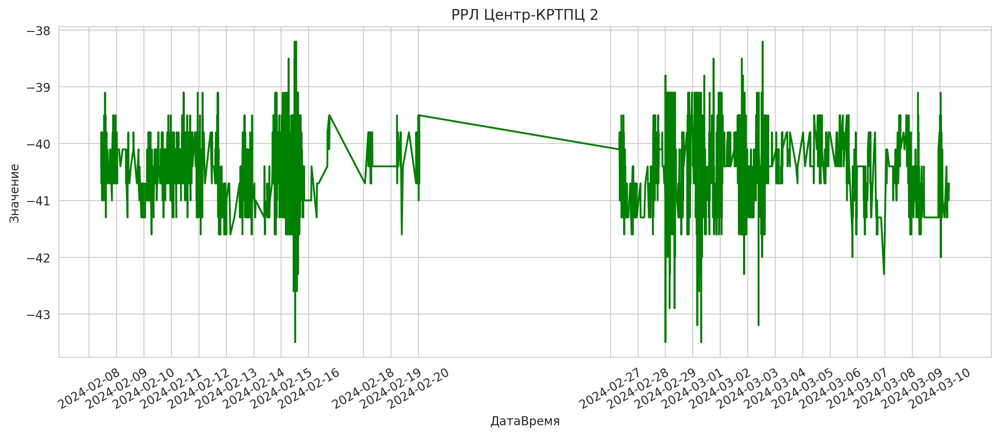

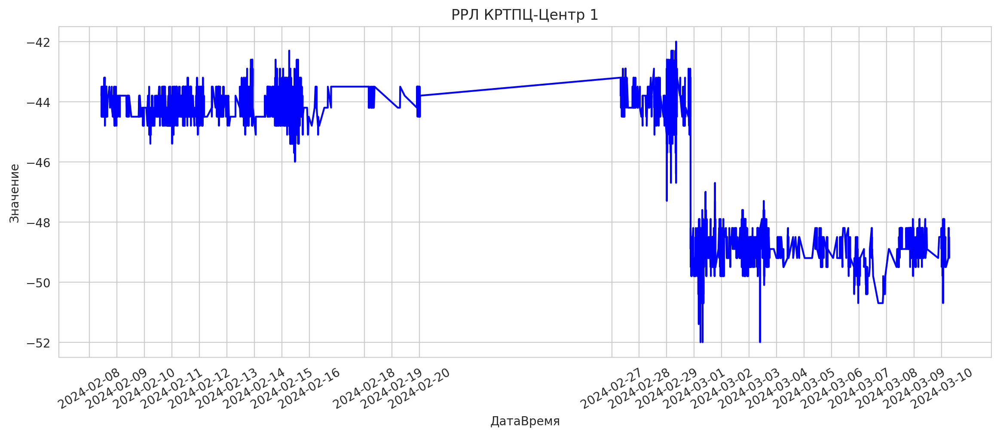

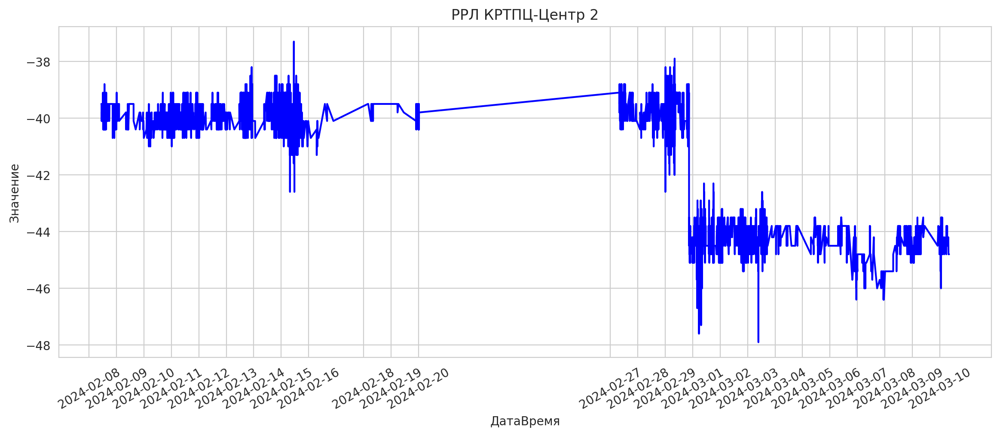

In [102]:
for i in range (0, len(spisok_df1)):
    get_plot1(spisok_df1,colors1,spisok_title1)
    

### Распределение уровни сигнала РРЛ между ЦСУДС и КРТПЦ.

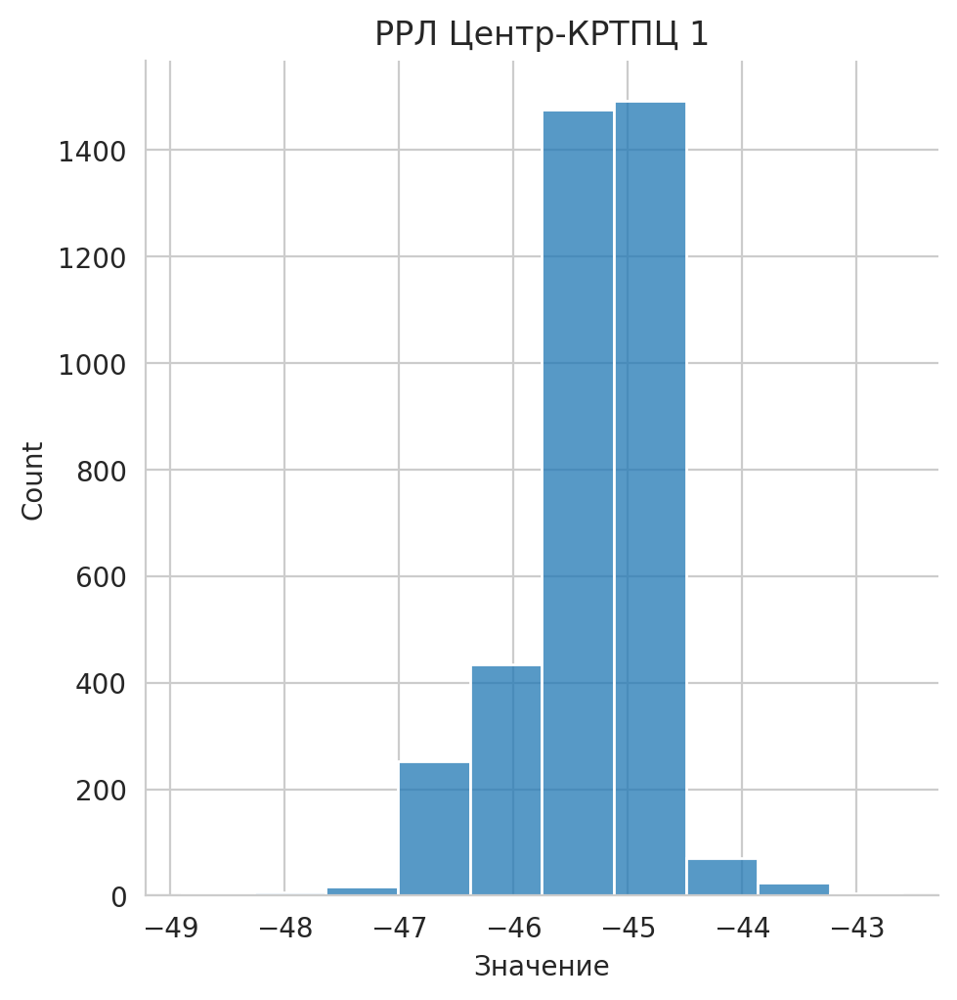

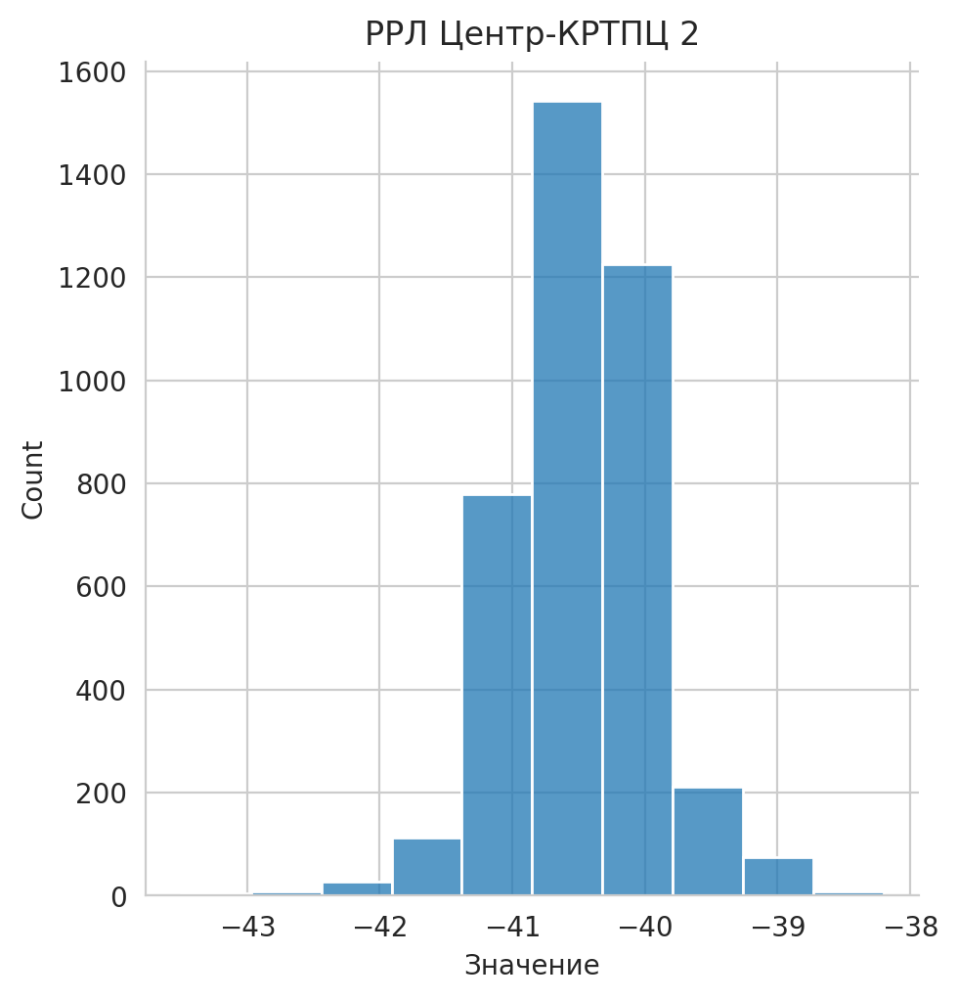

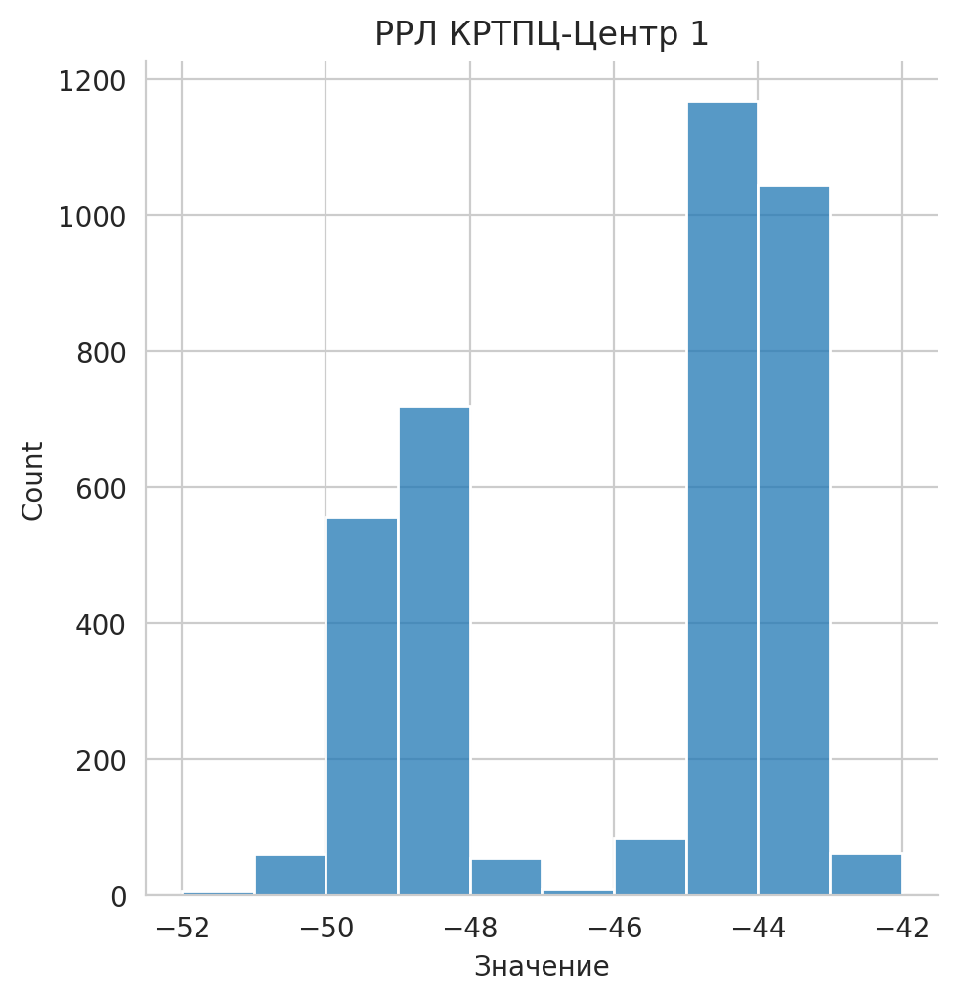

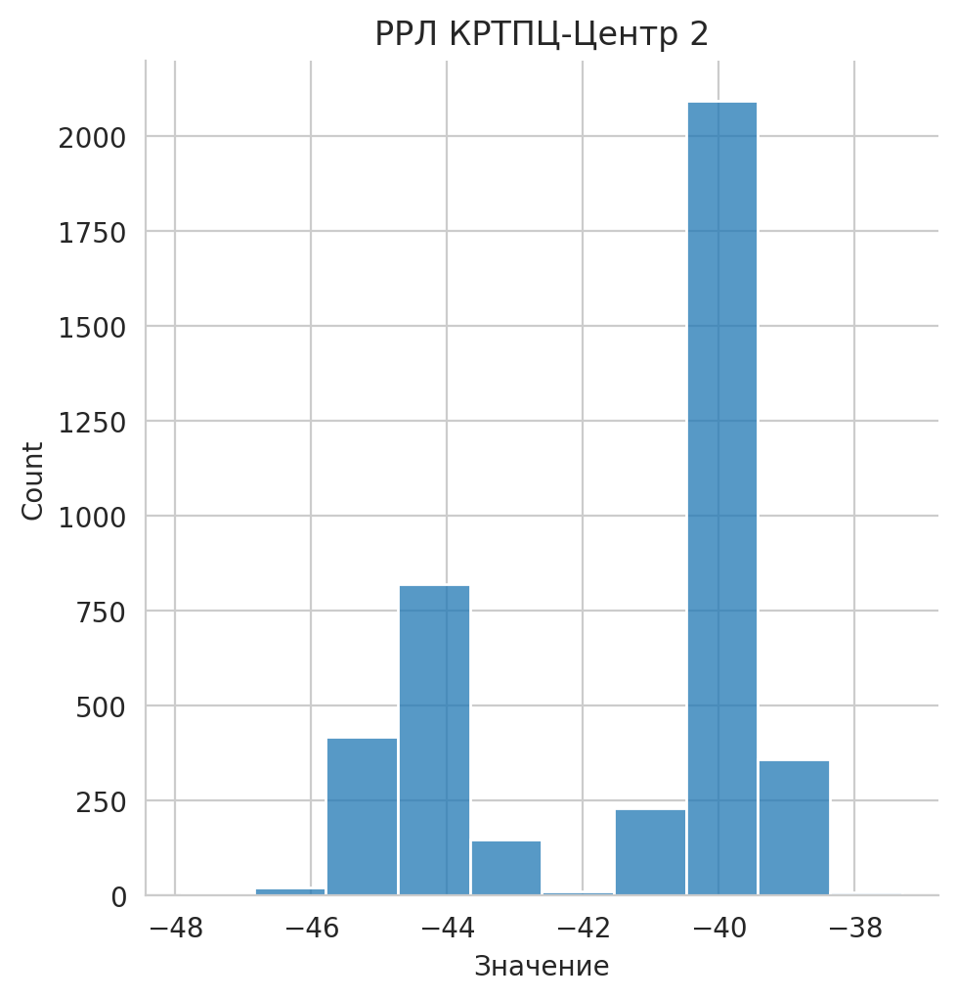

In [103]:
for i in range (0, len(spisok_df1)):
    get_plot1_dis(spisok_df1,spisok_title1)

## Средние значения и медиана по дням уровня сигнала РРЛ Ю. Озереевка.

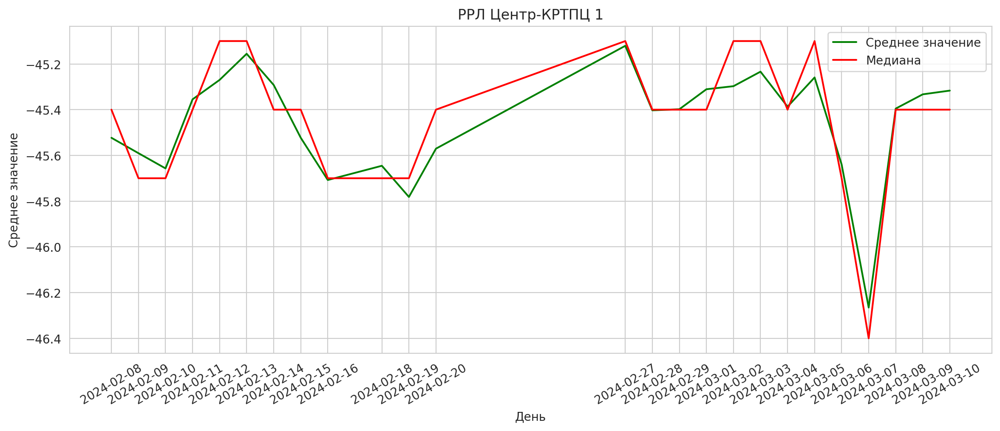

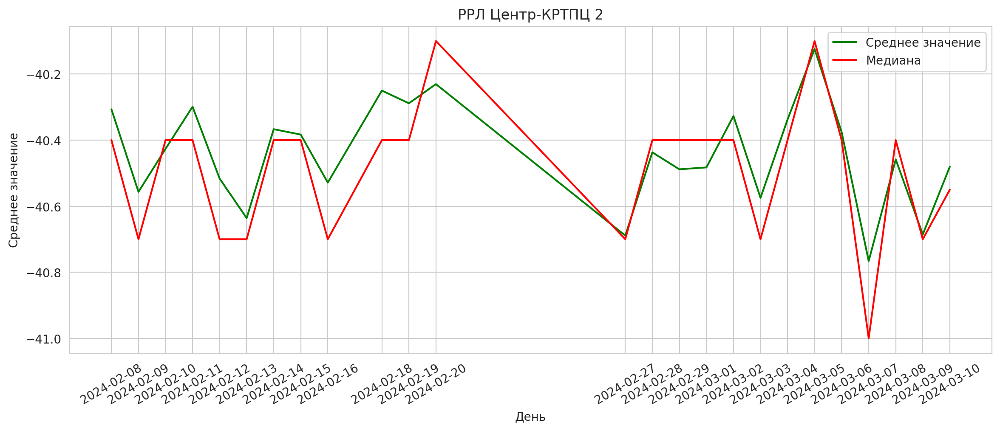

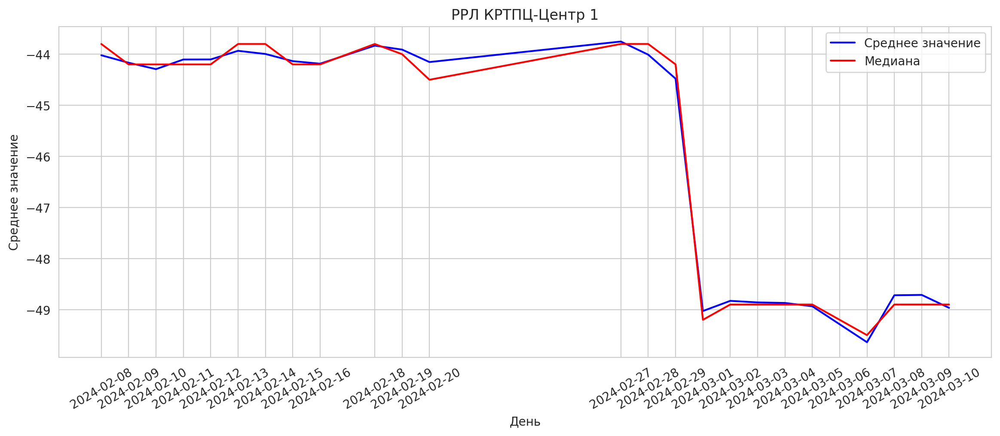

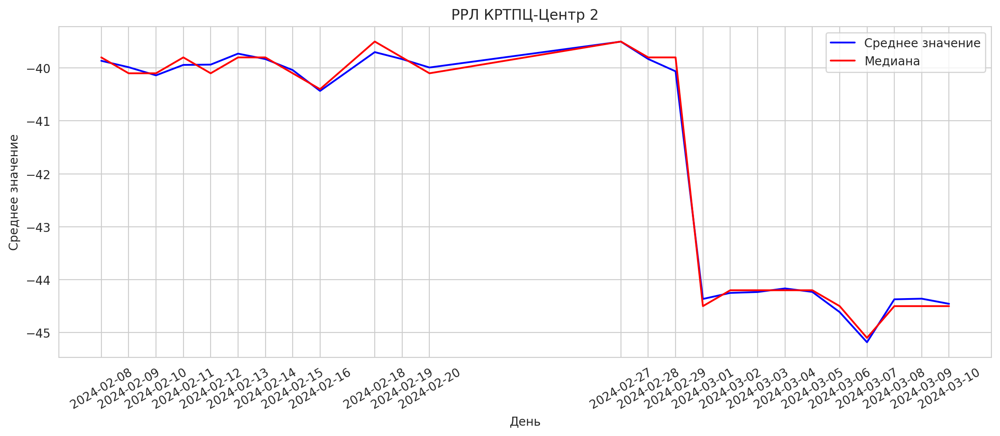

In [104]:
for i in range (0, len(spisok_df1_mean)):
    get_plot1_mean(spisok_df1_mean,colors1,spisok_title1)
    

### Интервалы между записями в БД сигнала РРЛ между ЦСУДС и КРТПЦ.

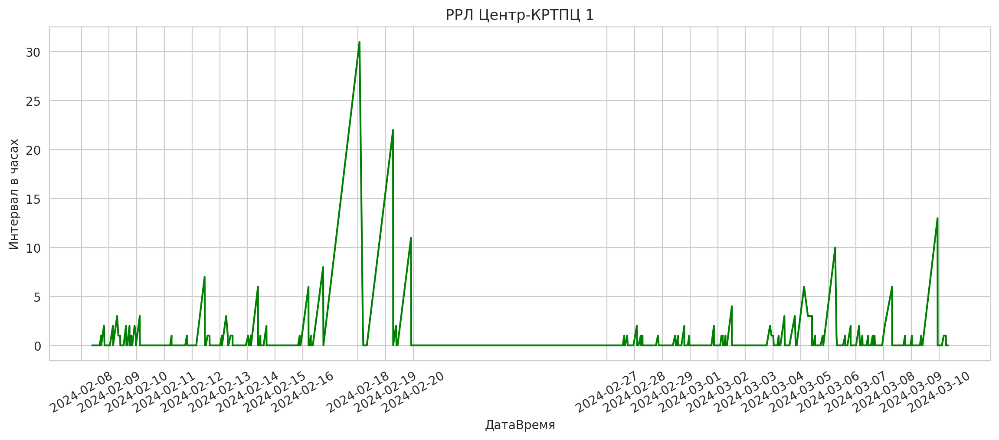

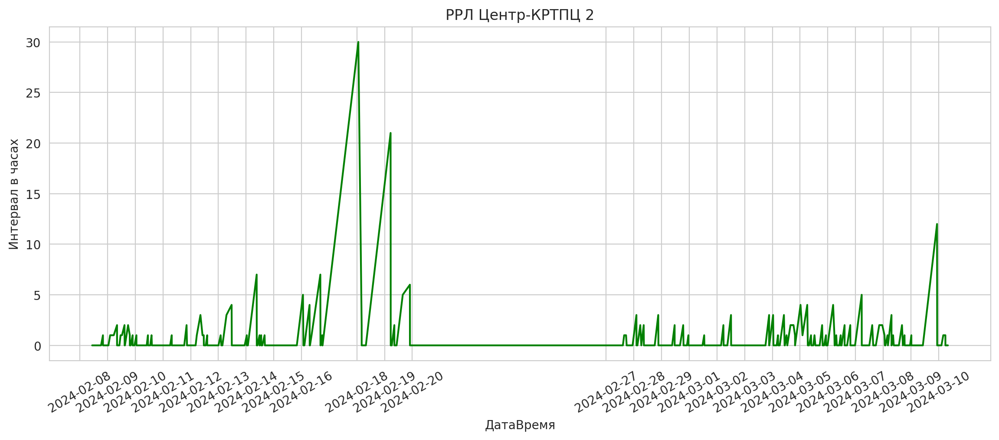

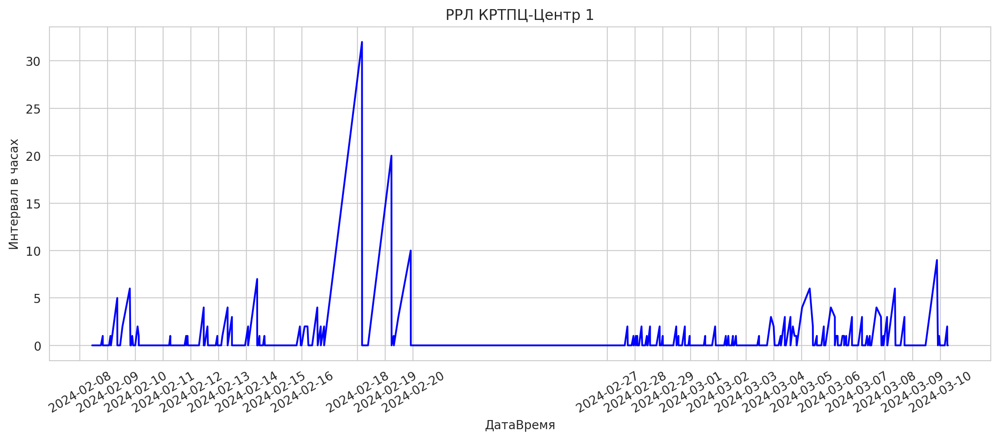

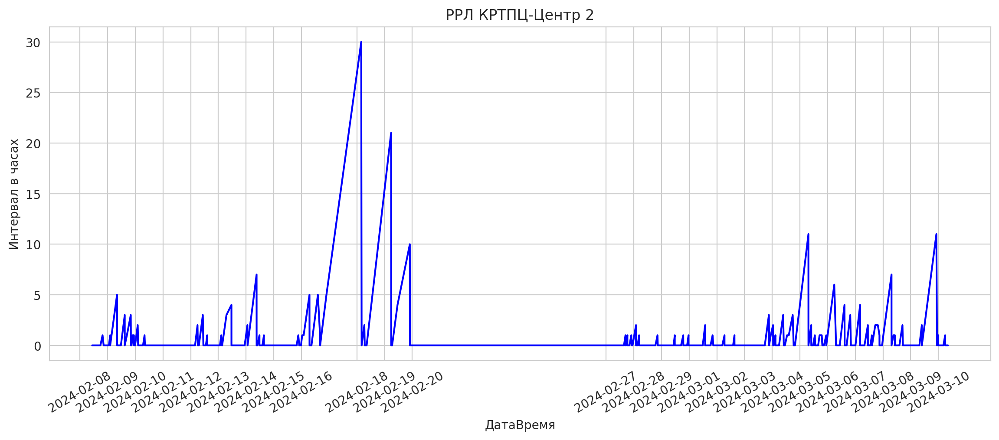

In [105]:
for i in range (0, len(spisok_df1)):
    get_plot1_int(spisok_df1,colors1,spisok_title1)
    

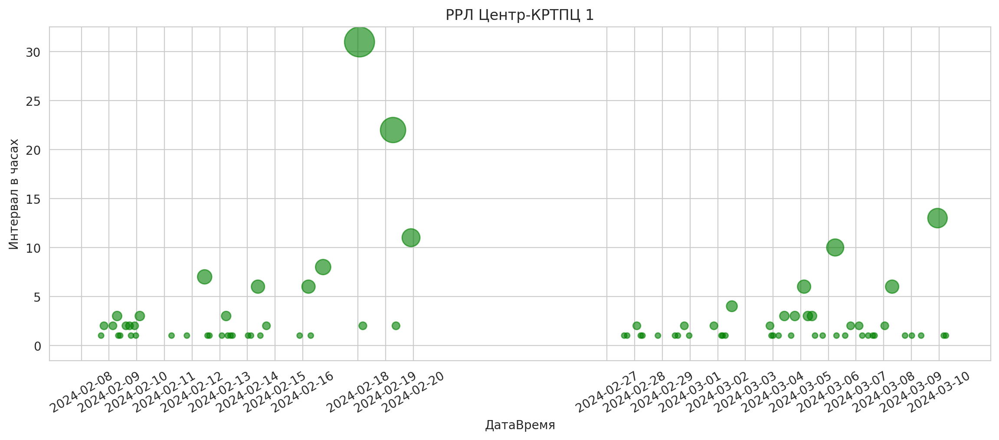

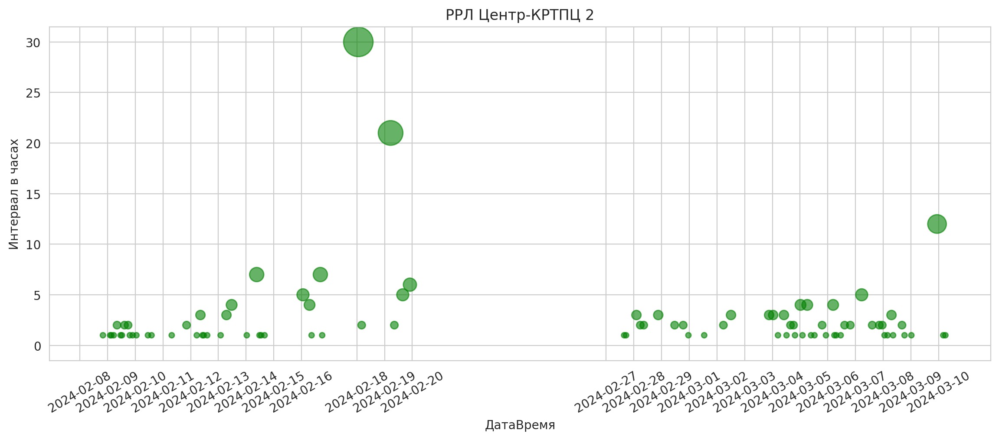

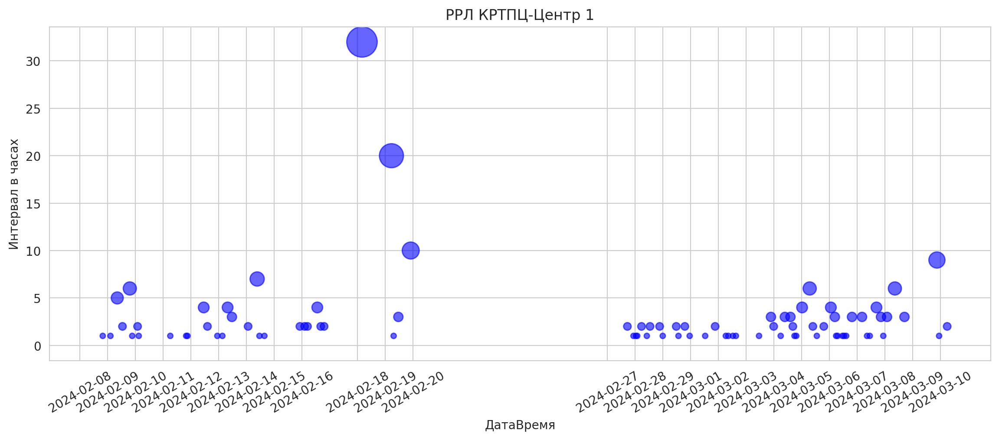

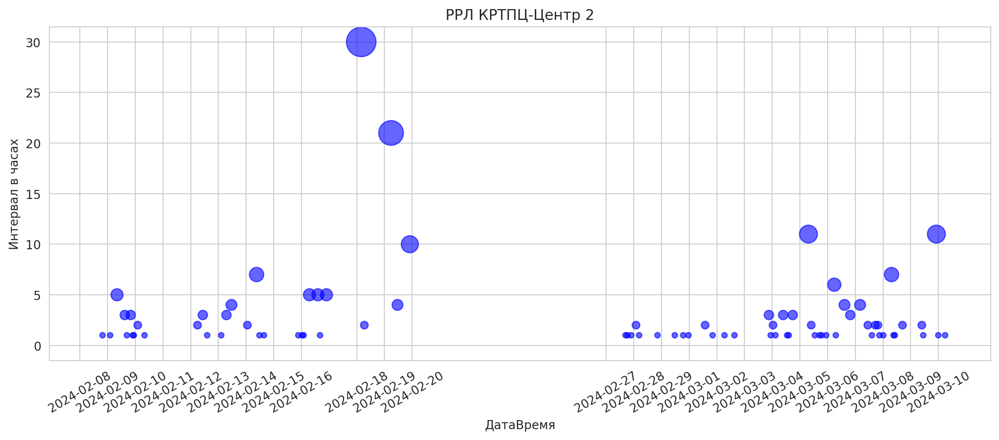

In [106]:
for i in range (0, len(spisok_df1)):
    get_plot1_int1(spisok_df1, colors1, spisok_title1)
    

### Уровни сигнала РРЛ между Абрау и КРТПЦ.

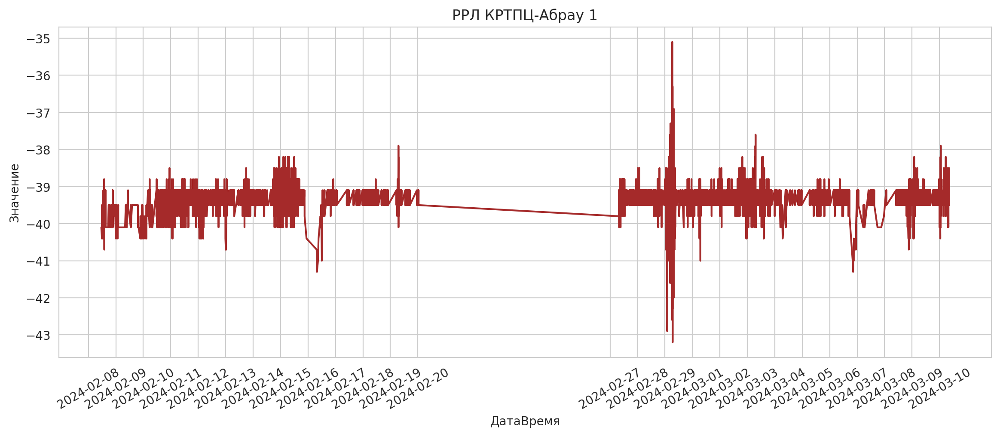

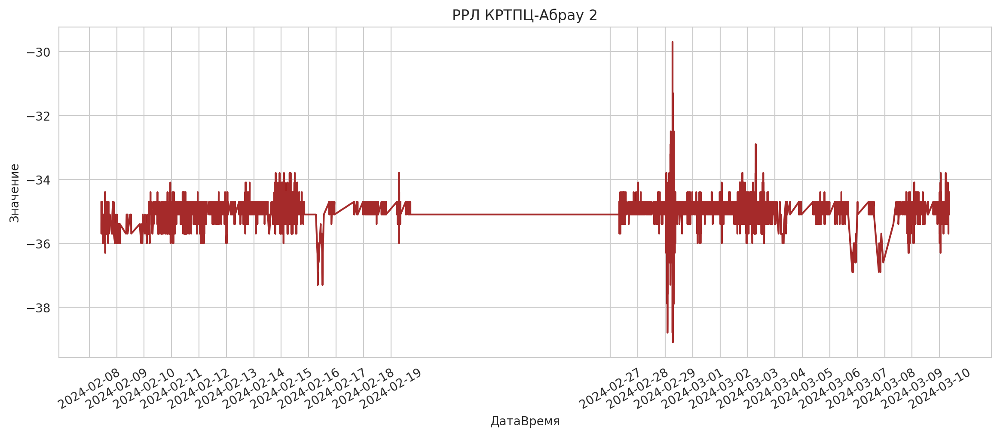

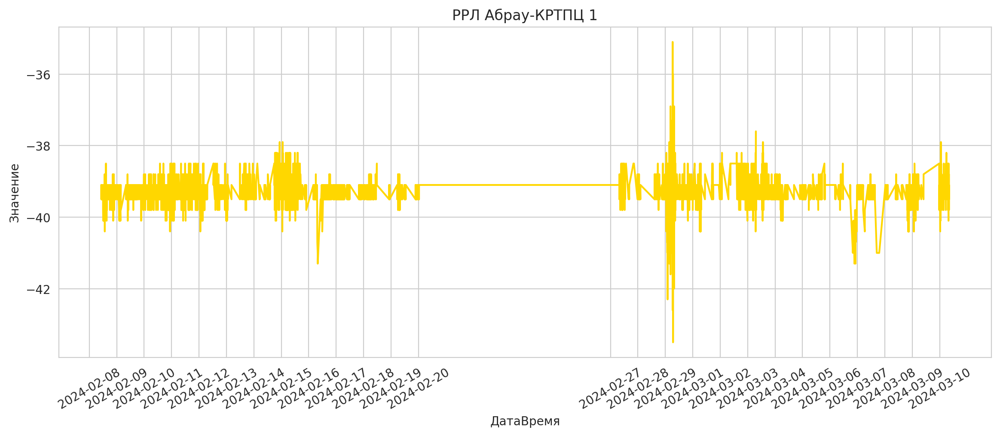

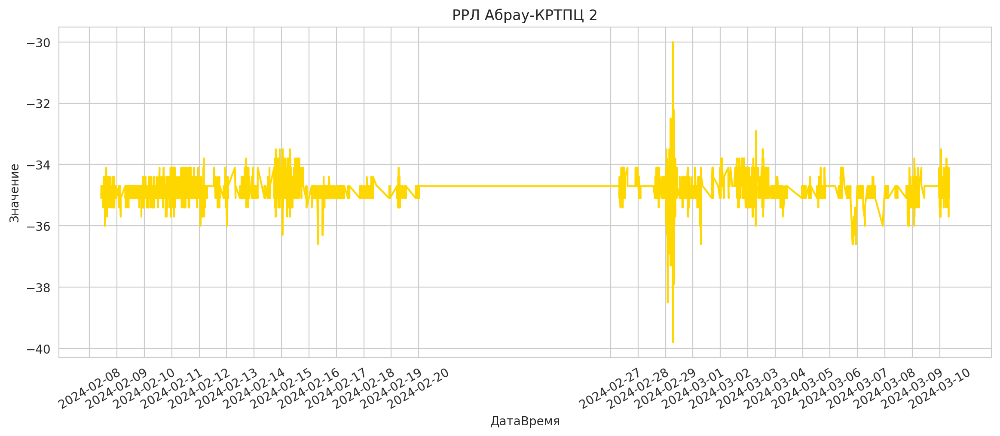

In [107]:
for i in range (0, len(spisok_df2)):
    get_plot1(spisok_df2,colors2,spisok_title2)
    

### Распределение уровни сигнала РРЛ между Абрау и КРТПЦ.

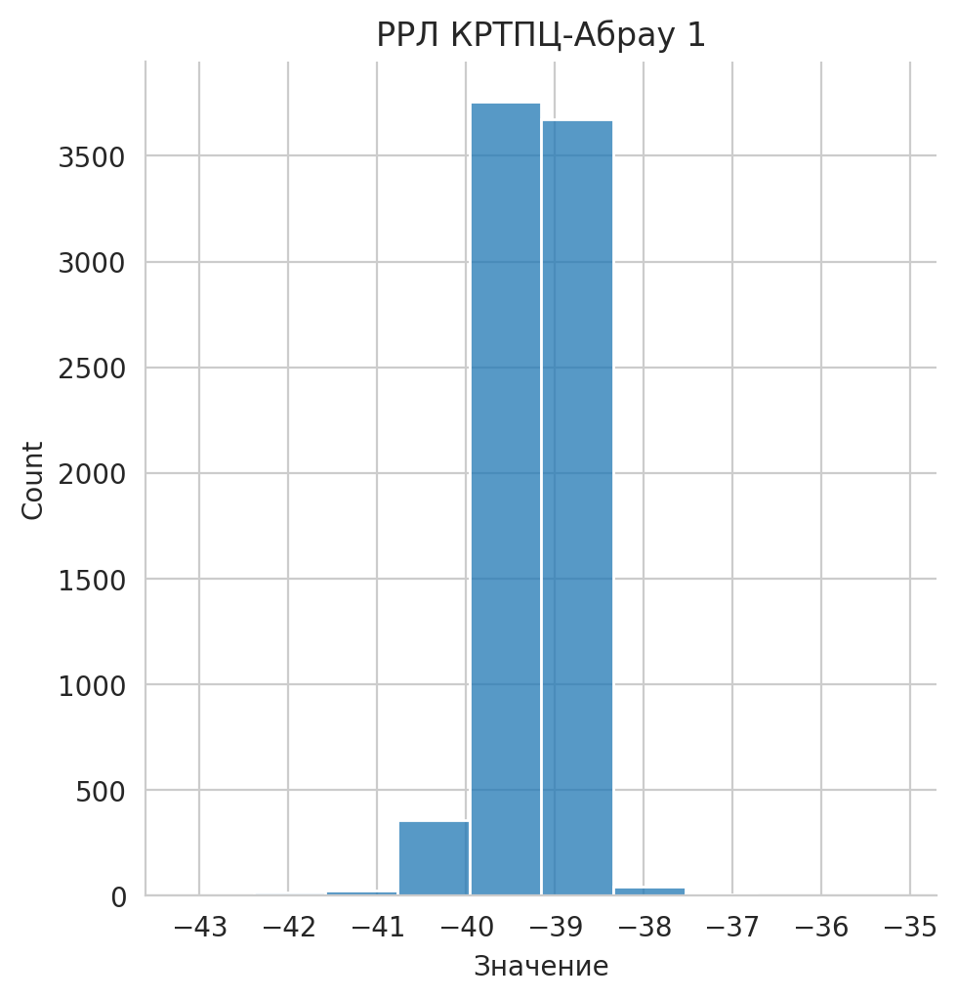

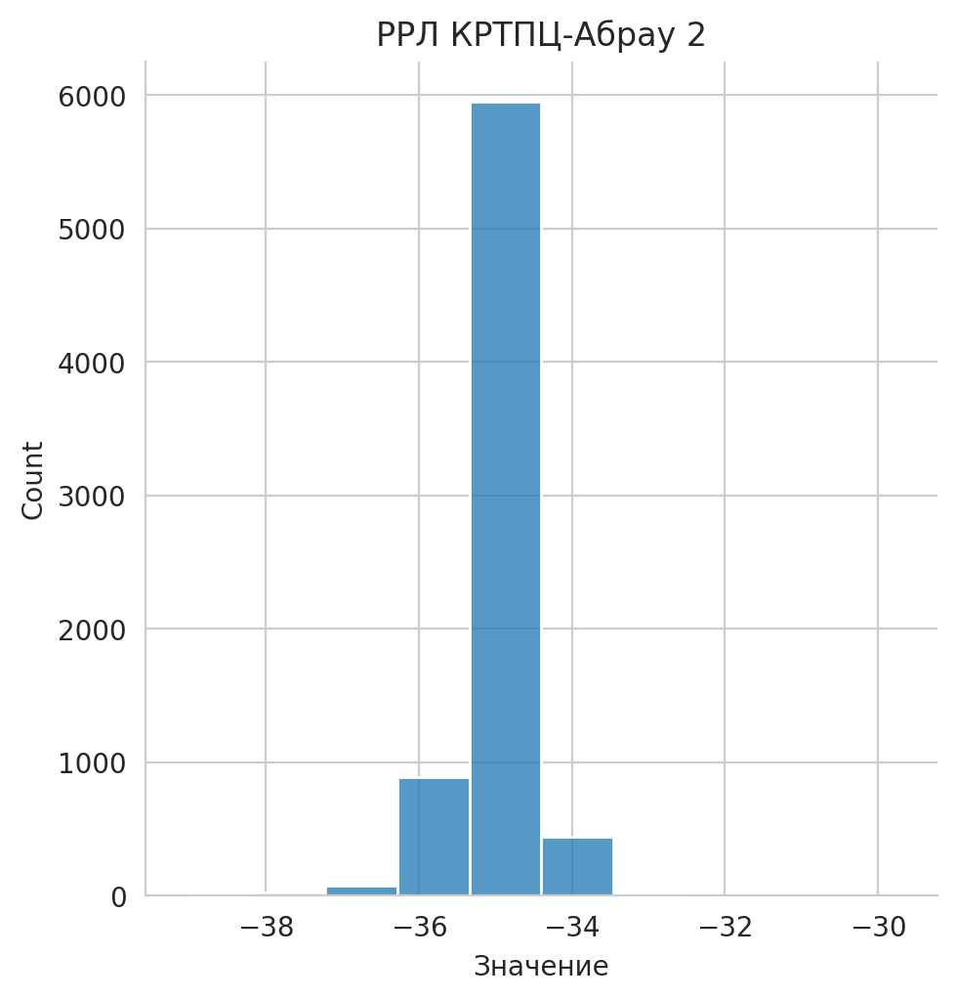

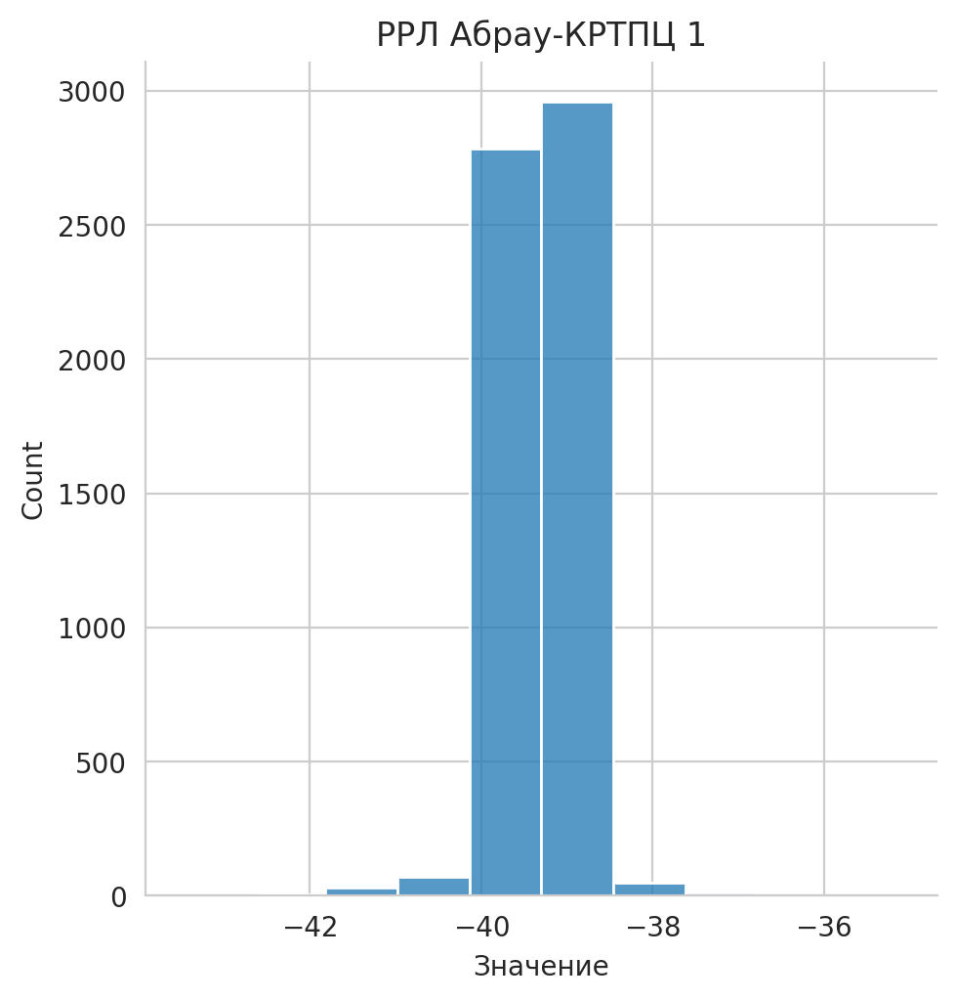

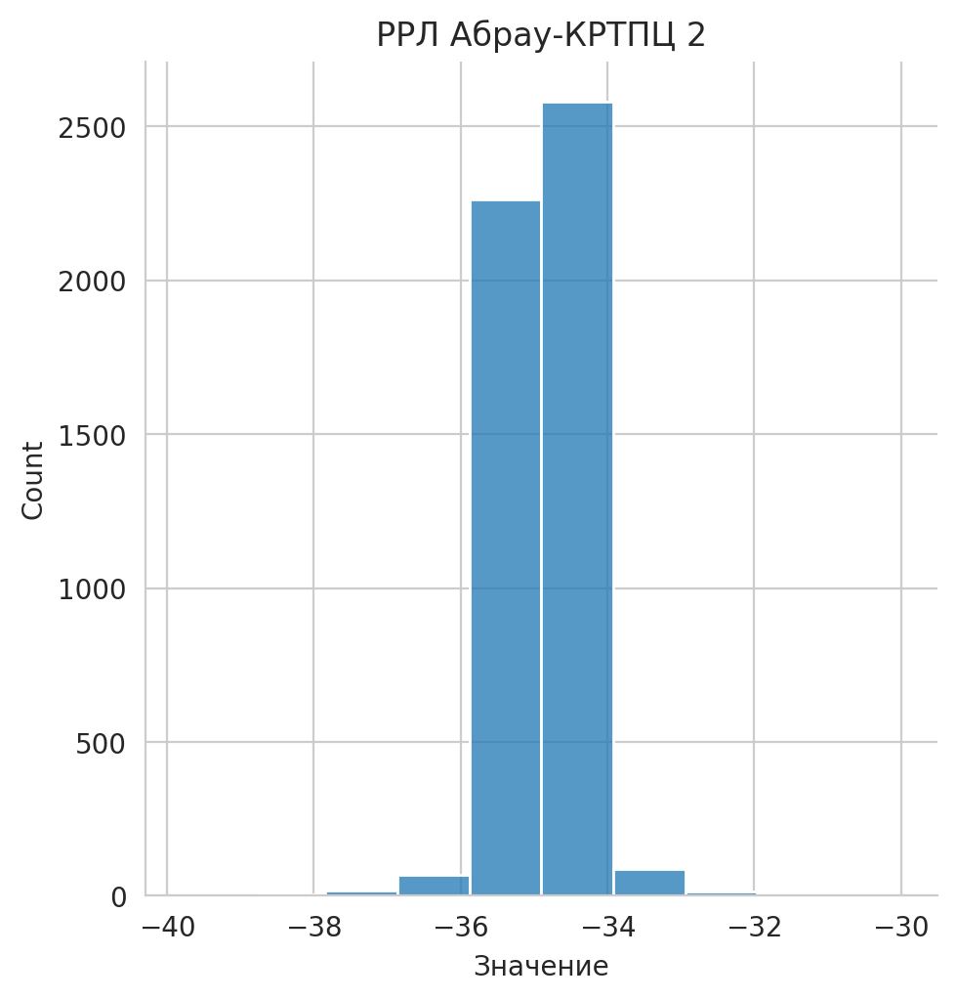

In [108]:
for i in range (0, len(spisok_df2)):
    get_plot1_dis(spisok_df2,spisok_title2)

## Средние значения и медиана по дням уровня сигнала РРЛ Ю. Озереевка.

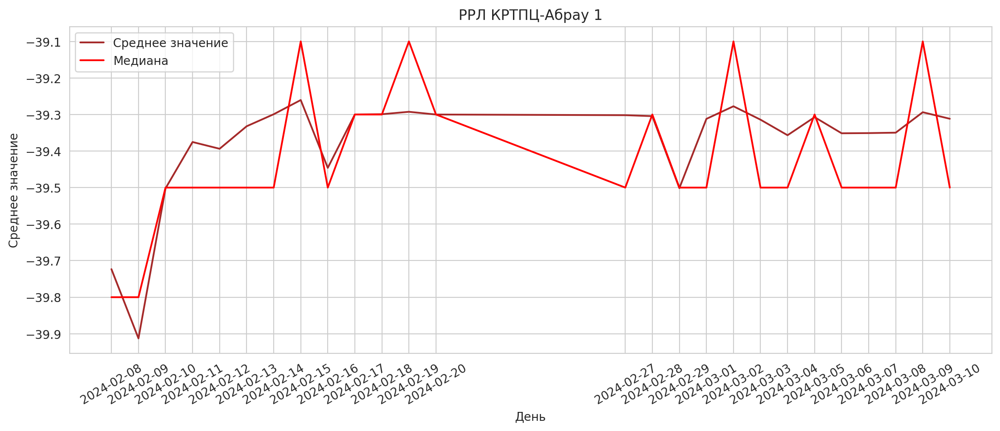

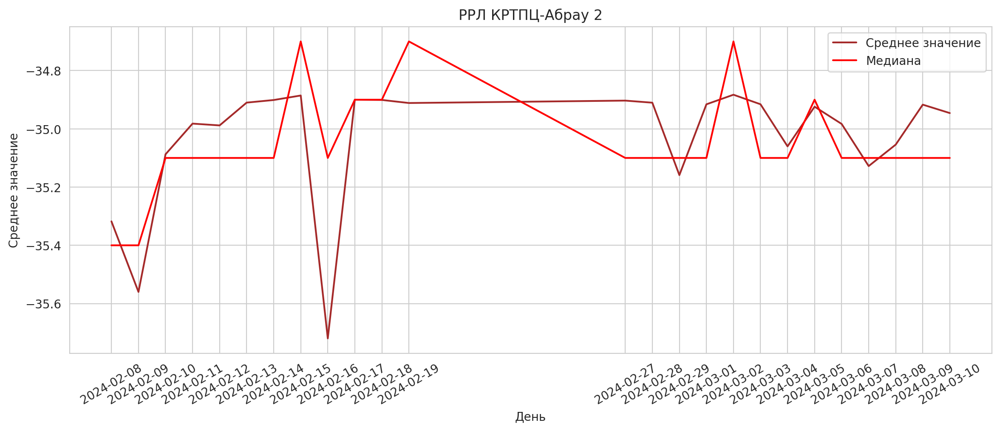

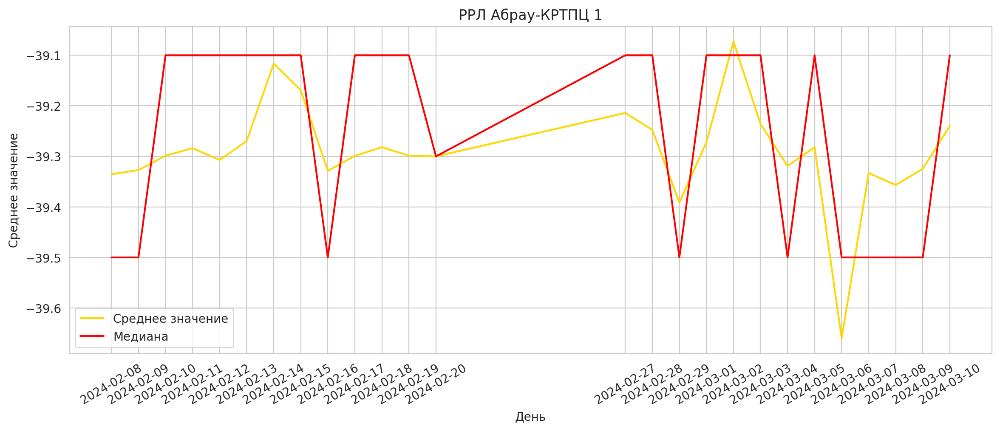

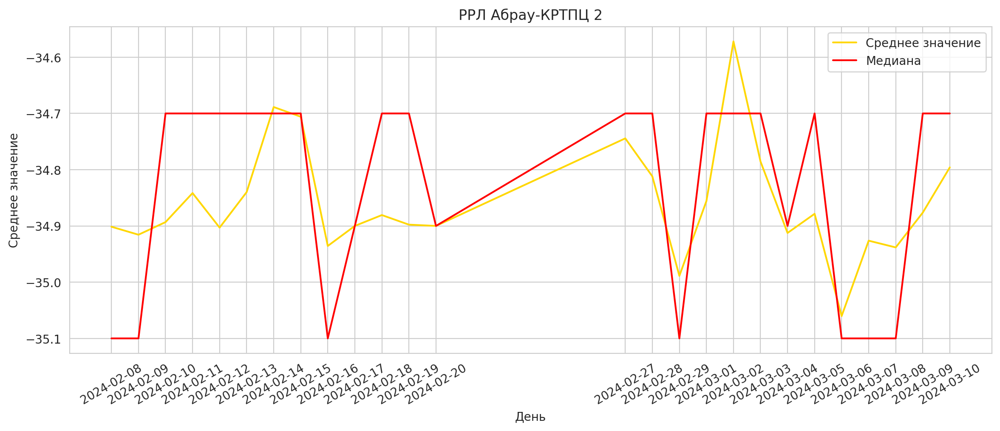

In [109]:
for i in range (0, len(spisok_df2_mean)):
    get_plot1_mean(spisok_df2_mean,colors2,spisok_title2)
    

### Интервалы между записями в БД сигнала РРЛ между Абрау и КРТПЦ.

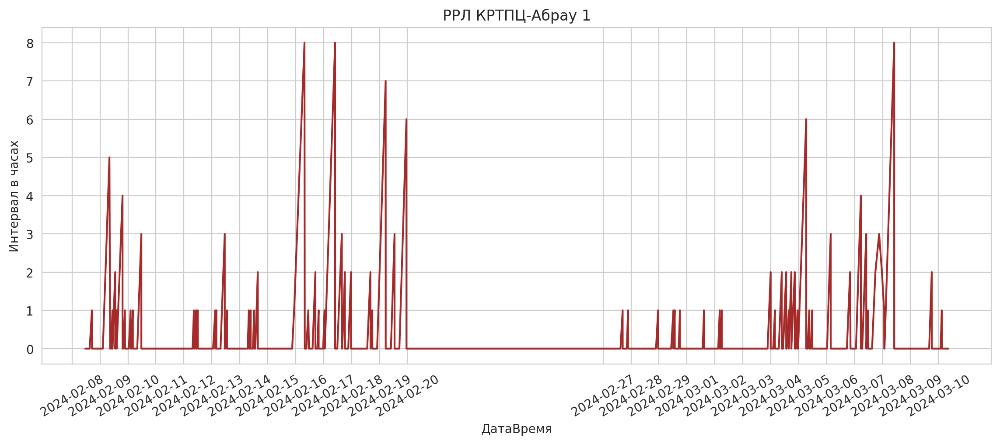

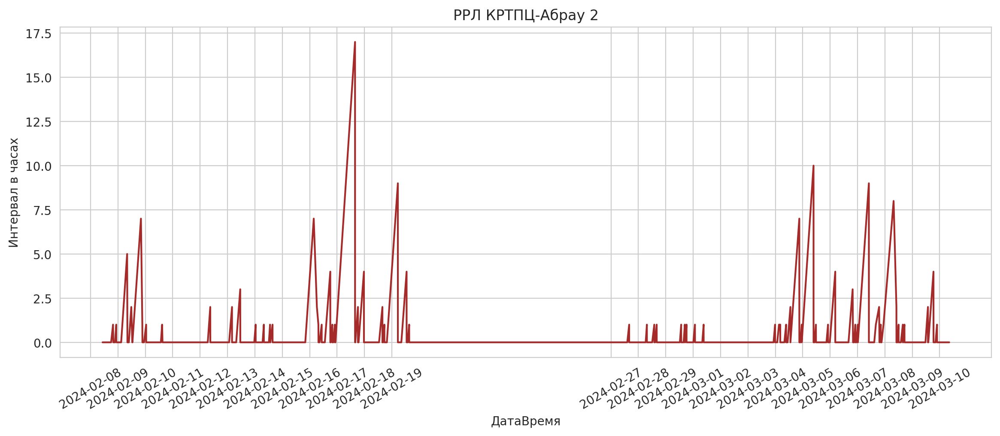

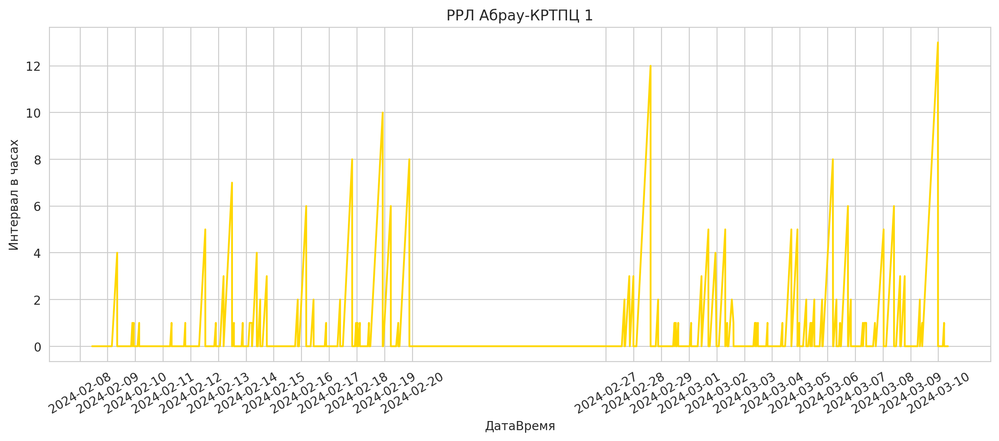

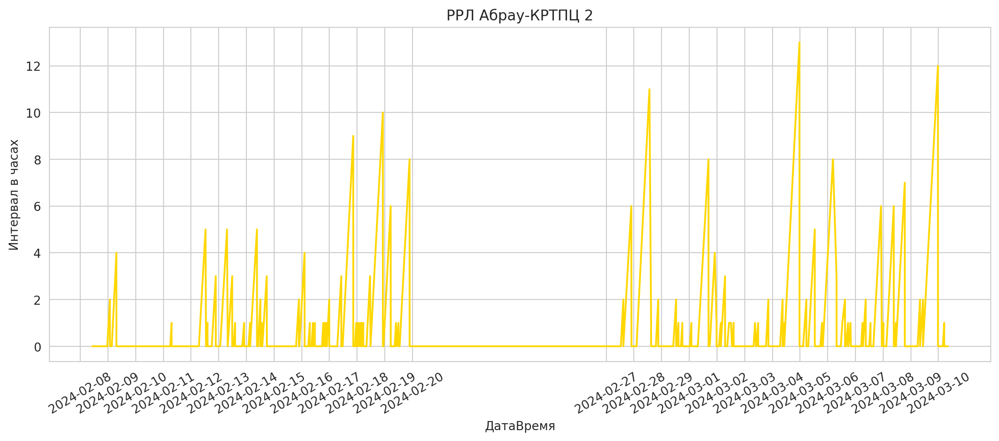

In [110]:
for i in range (0, len(spisok_df2)):
    get_plot1_int(spisok_df2,colors2,spisok_title2)
    

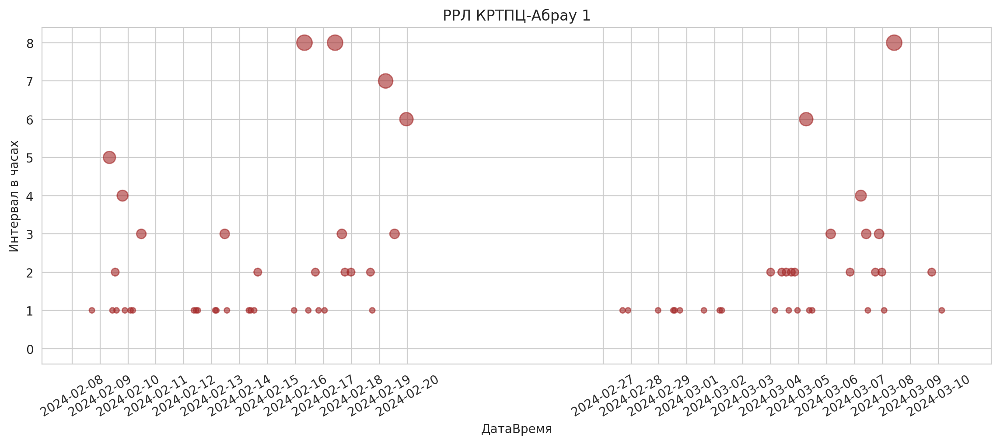

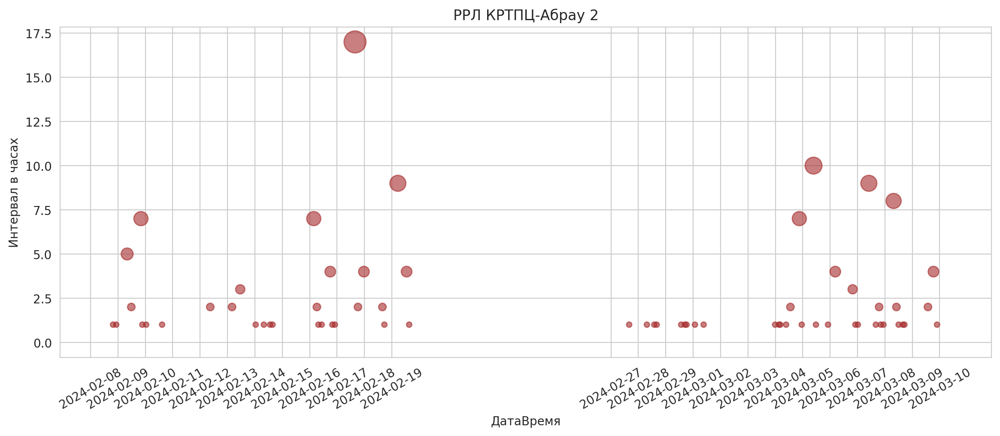

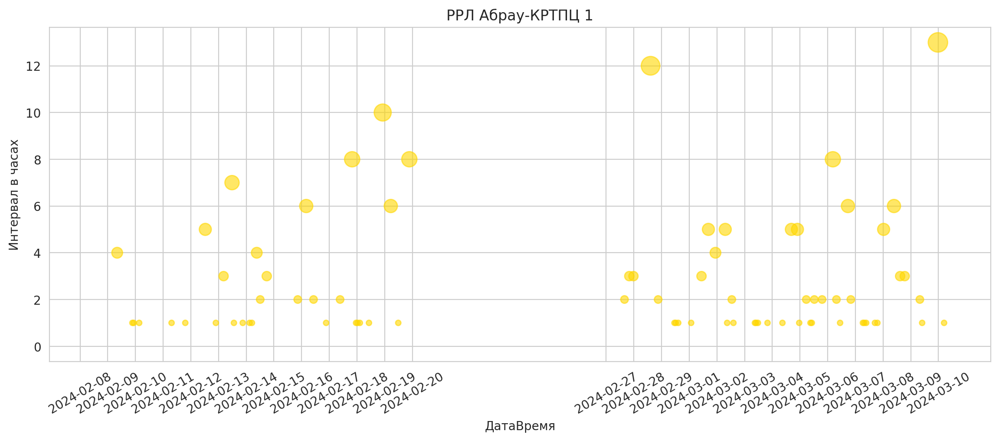

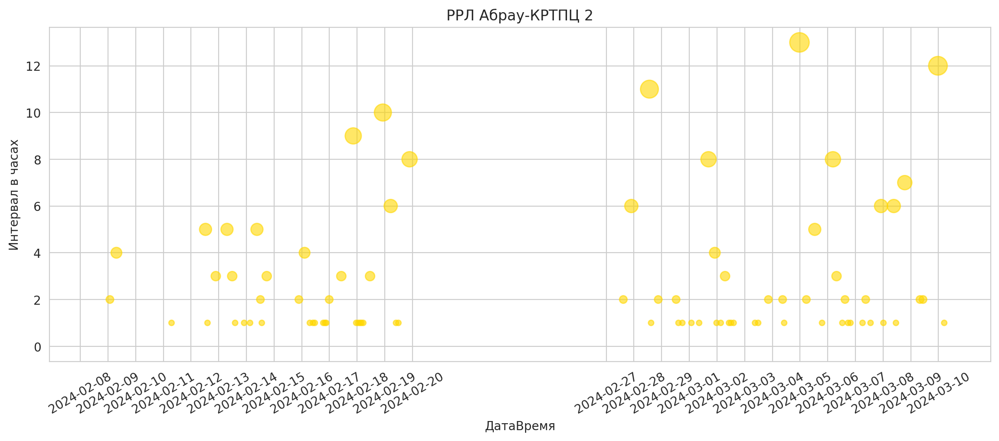

In [111]:
for i in range (0, len(spisok_df2)):
    get_plot1_int1(spisok_df2, colors2, spisok_title2)
    

### Уровни сигнала РРЛ между Абрау и Ю.Озереевка.

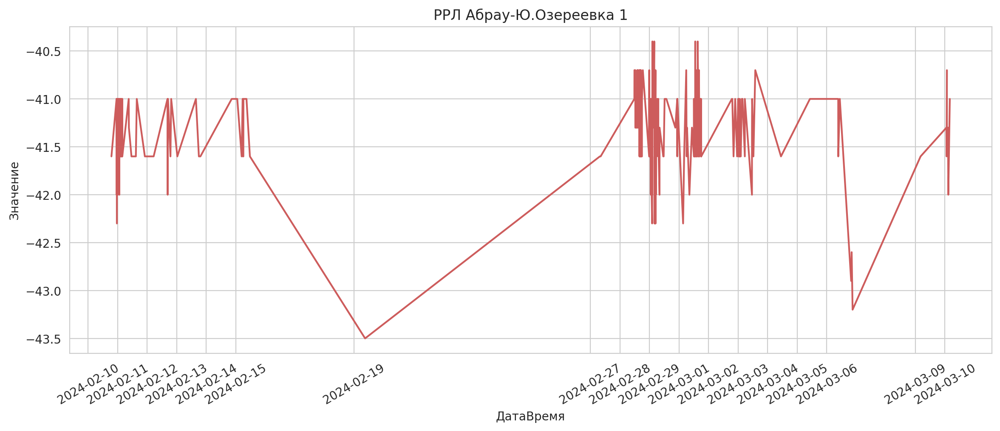

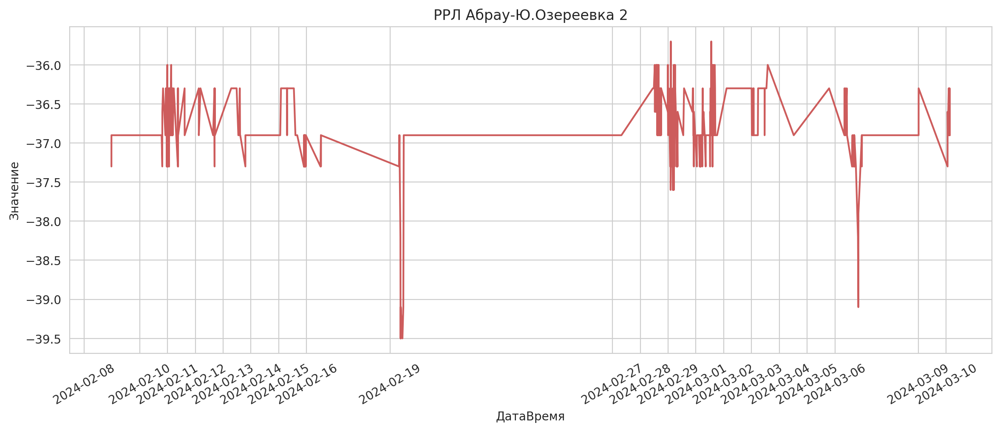

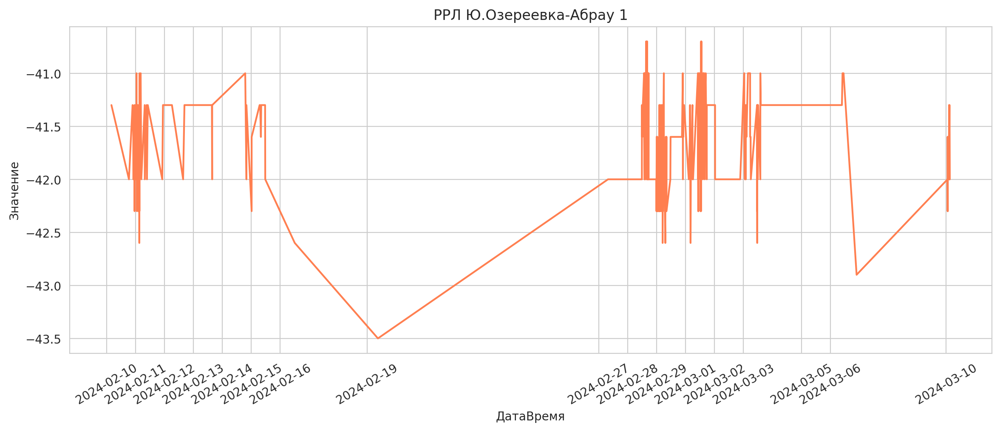

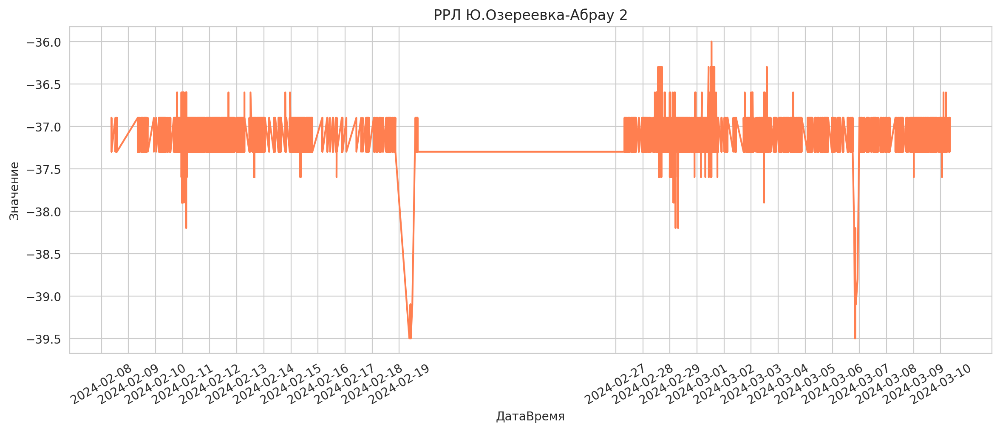

In [112]:
for i in range (0, len(spisok_df3)):
    get_plot1(spisok_df3,colors3,spisok_title3)


### Распределение уровни сигнала РРЛ между Абрау и Ю.Озереевка.

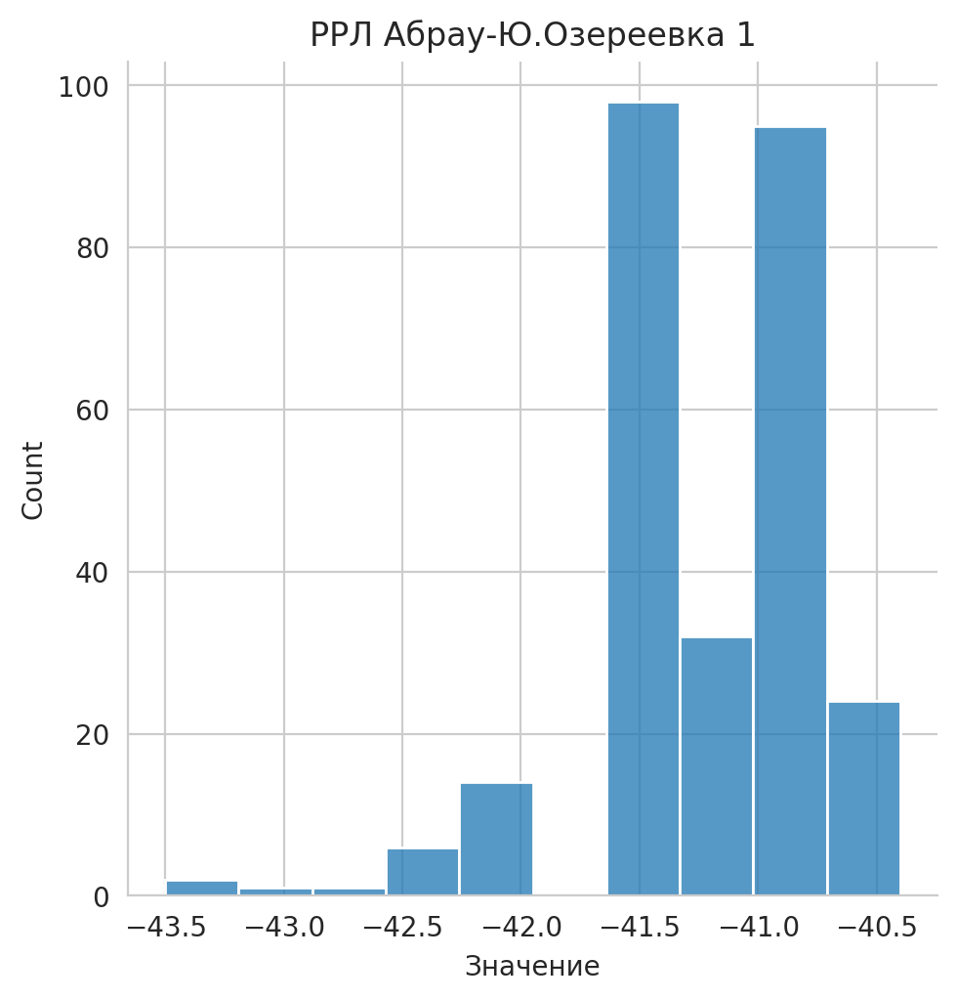

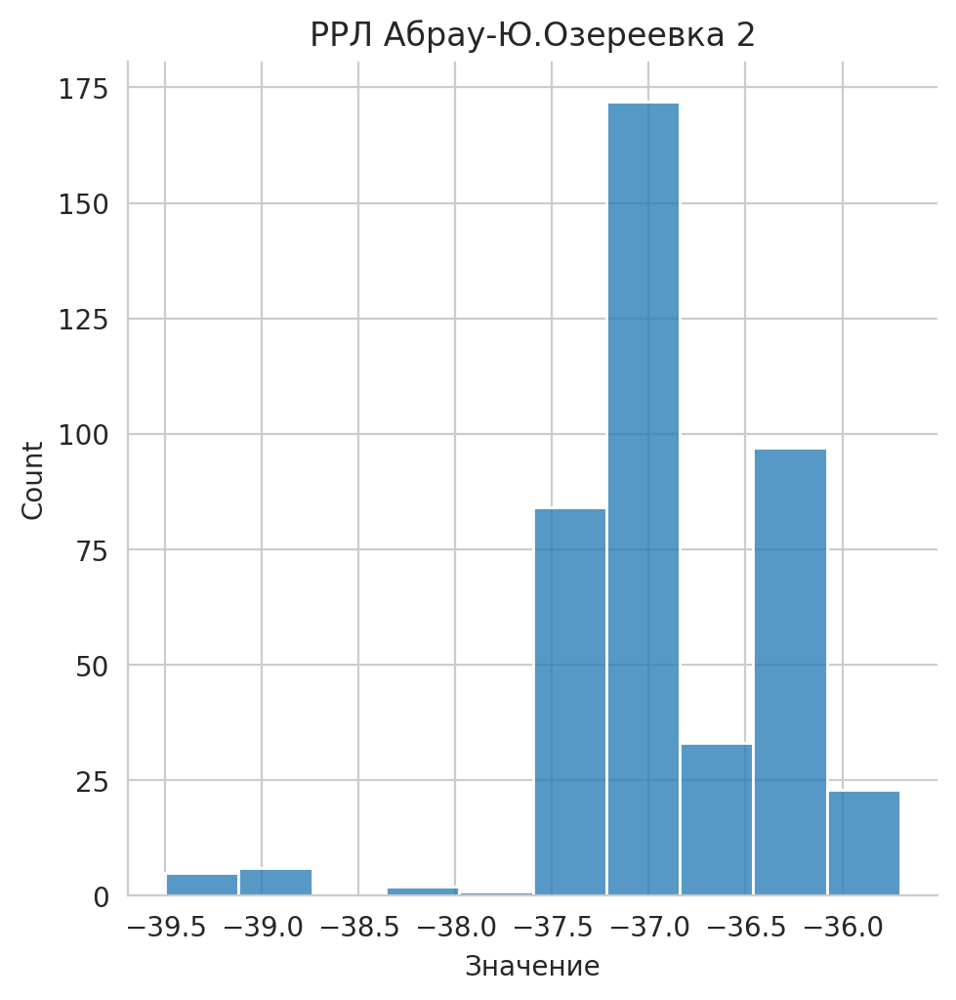

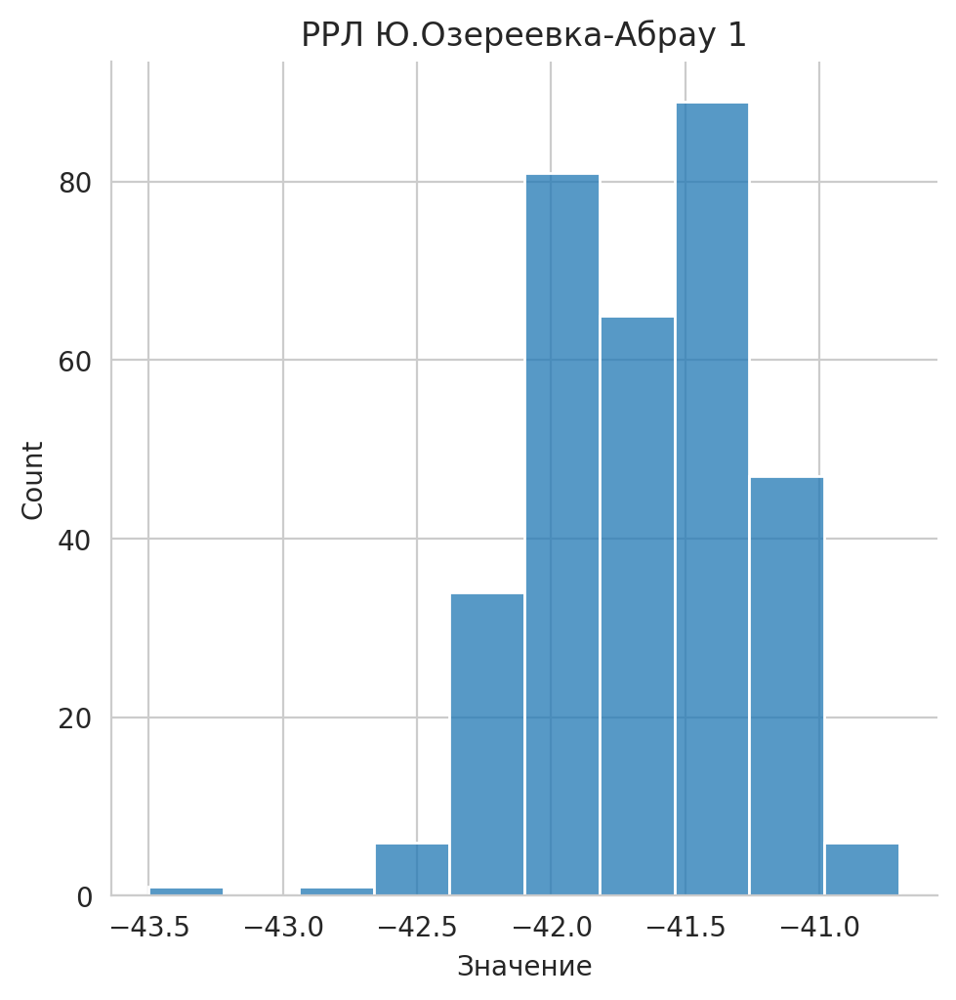

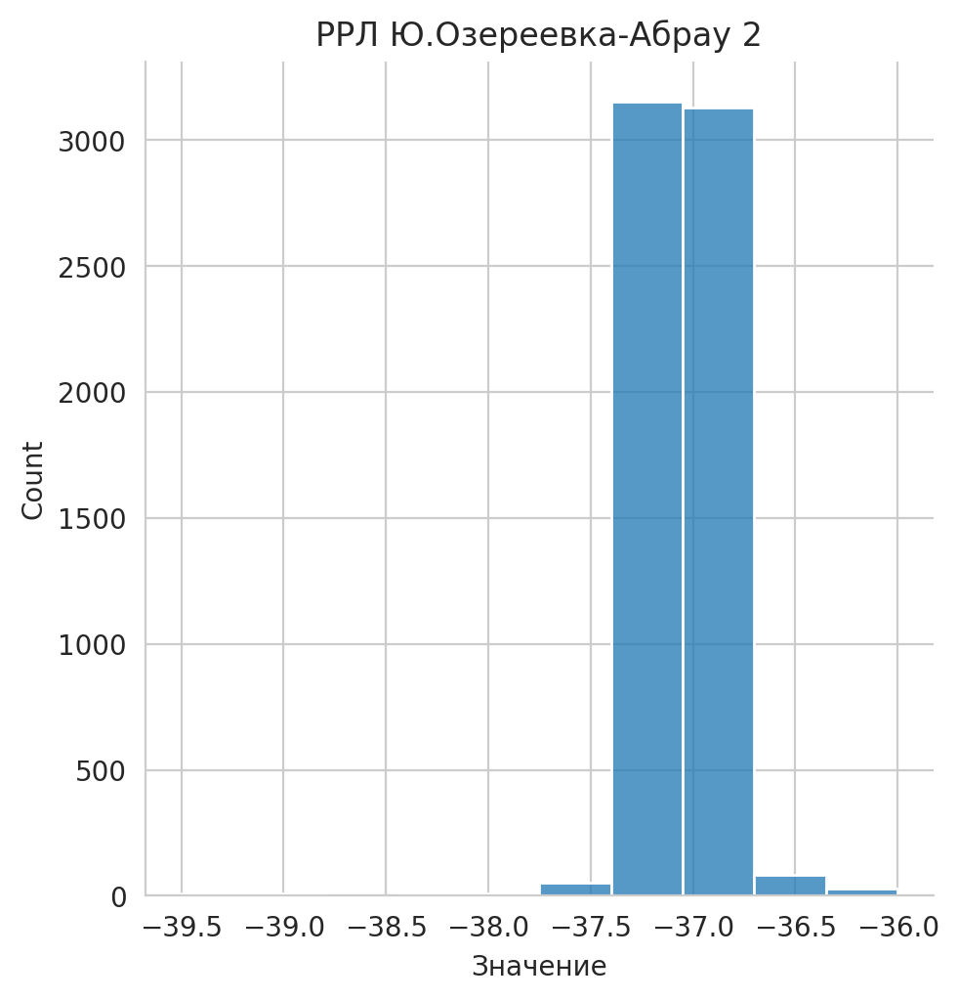

In [113]:
for i in range (0, len(spisok_df3)):
    get_plot1_dis(spisok_df3,spisok_title3)

## Средние значения и медиана по дням уровня сигнала РРЛ Ю. Озереевка.

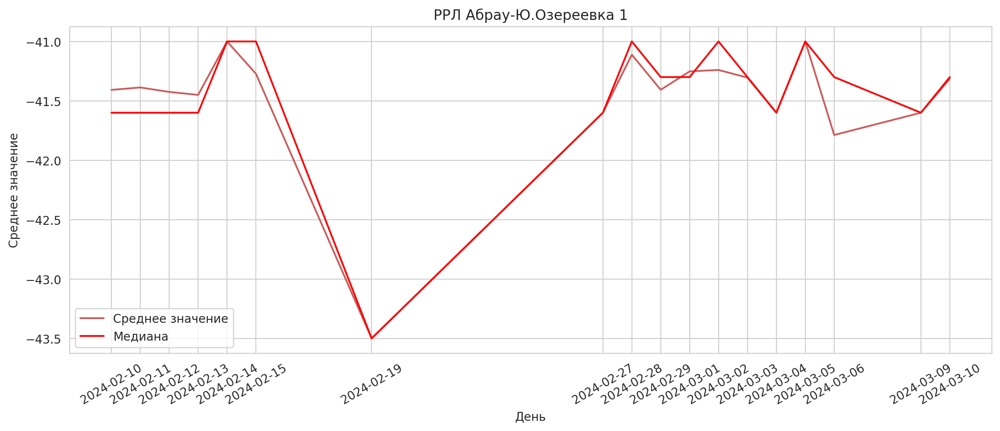

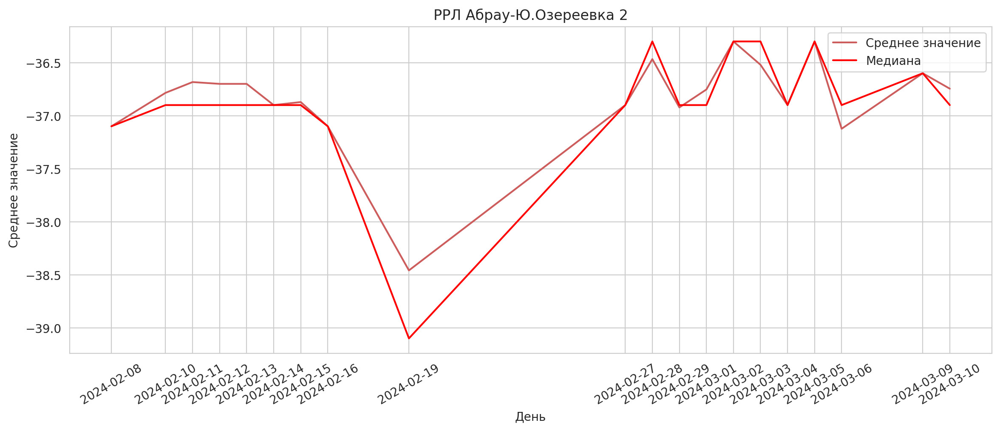

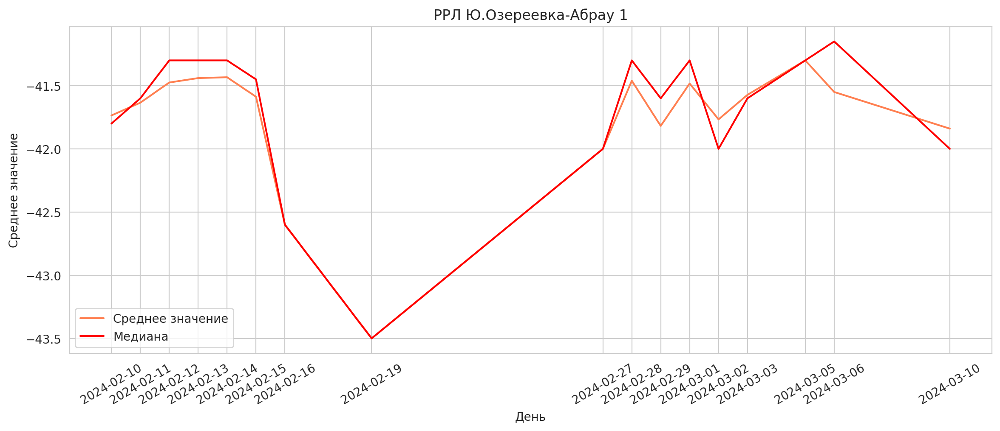

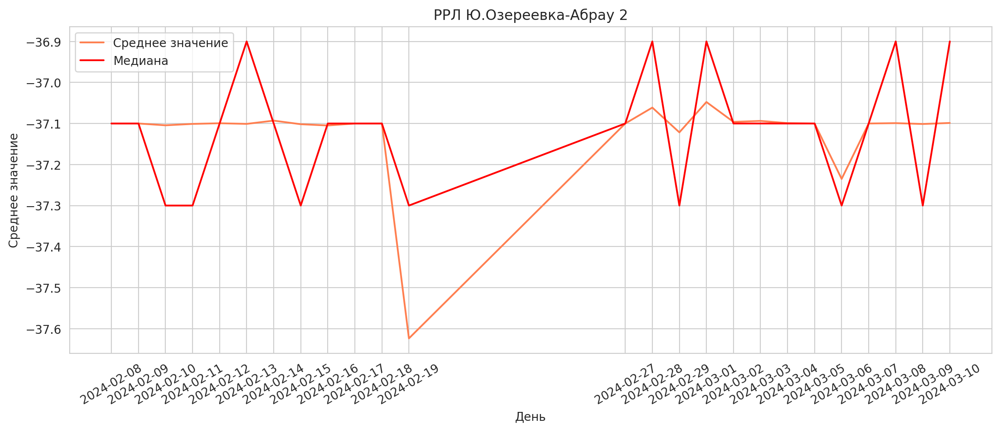

In [114]:
for i in range (0, len(spisok_df3_mean)):
    get_plot1_mean(spisok_df3_mean,colors3,spisok_title3)
    

### Интервалы между записями в БД сигнала РРЛ между Абрау и Ю.Озереевка.

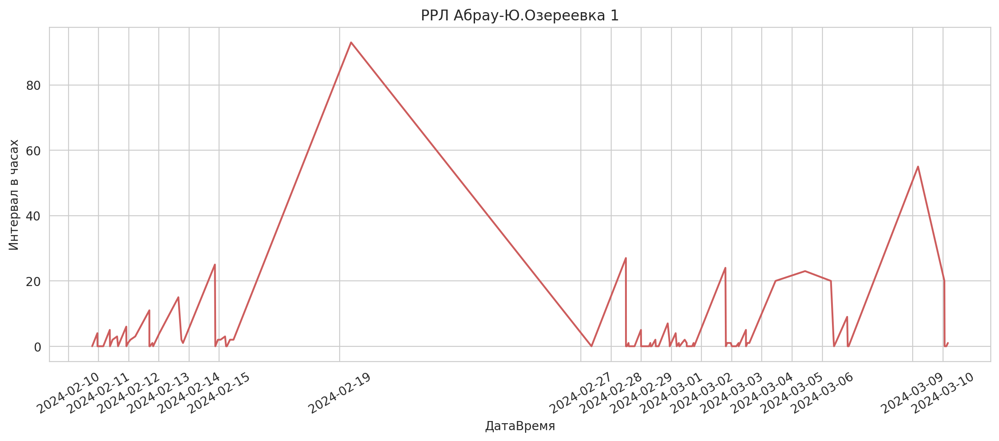

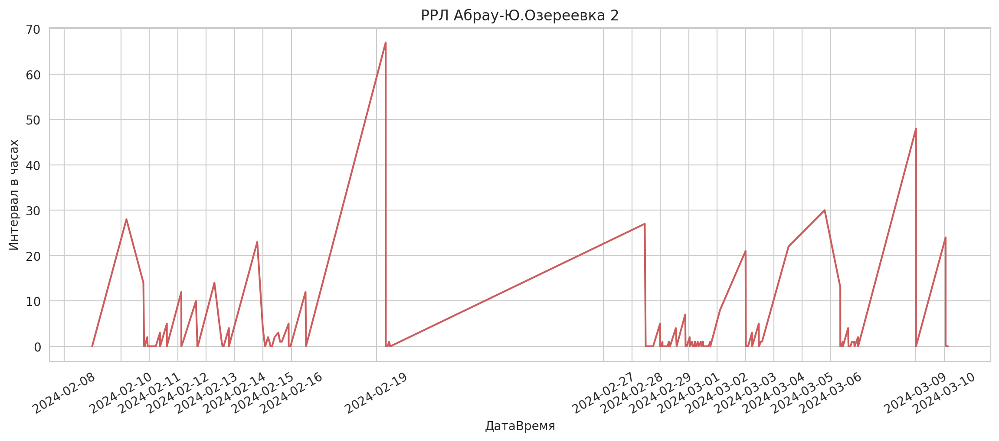

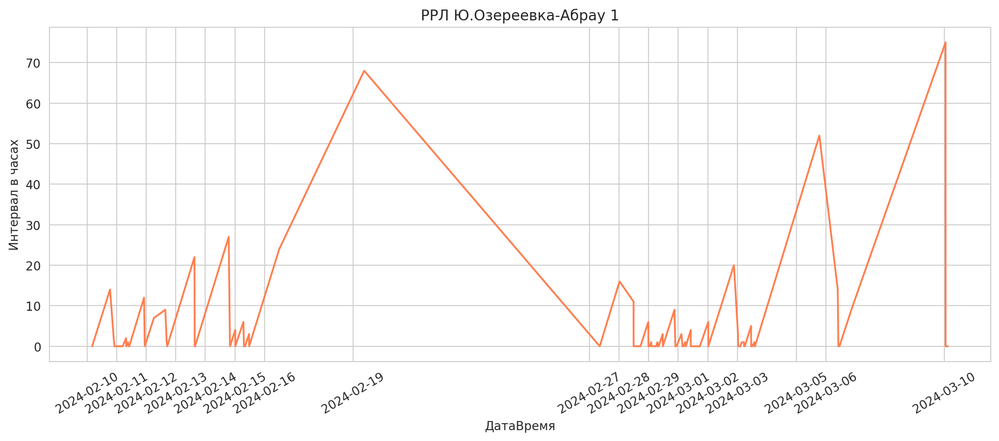

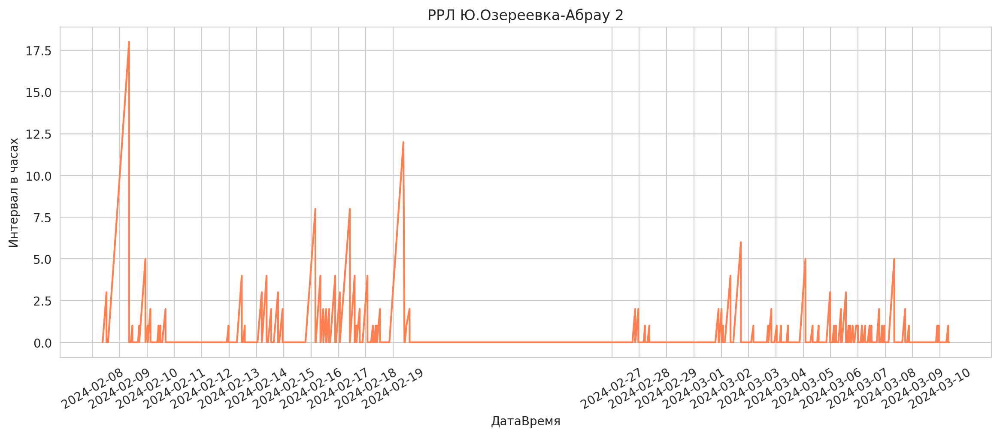

In [115]:
for i in range (0, len(spisok_df3)):
    get_plot1_int(spisok_df3,colors3,spisok_title3)


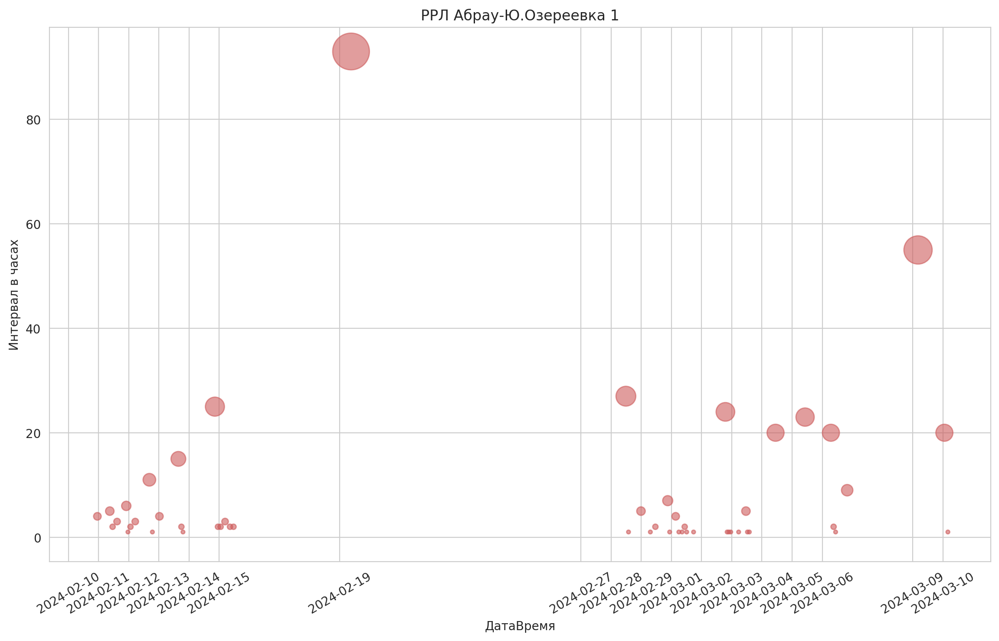

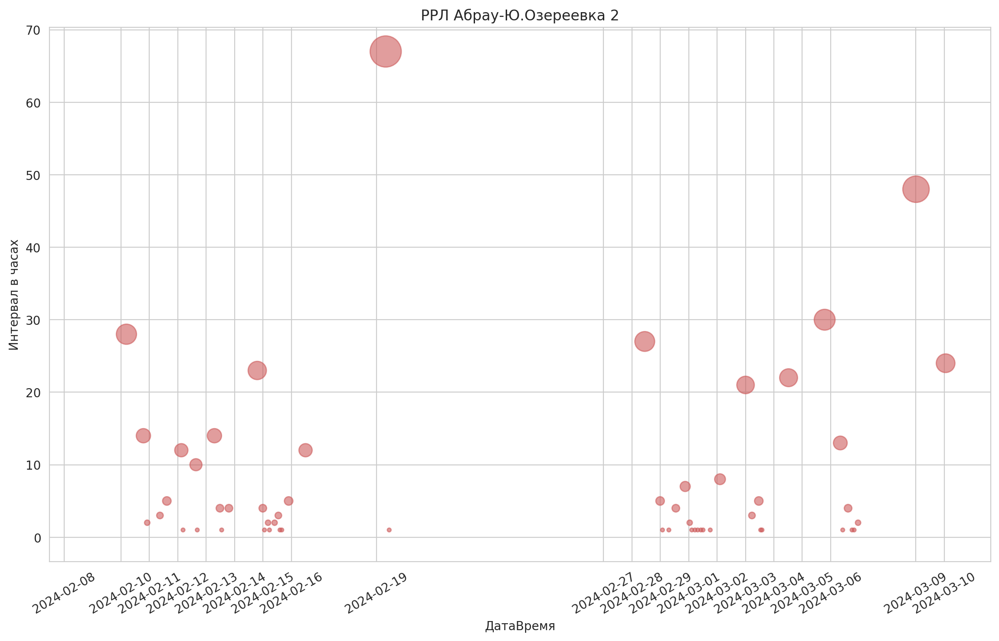

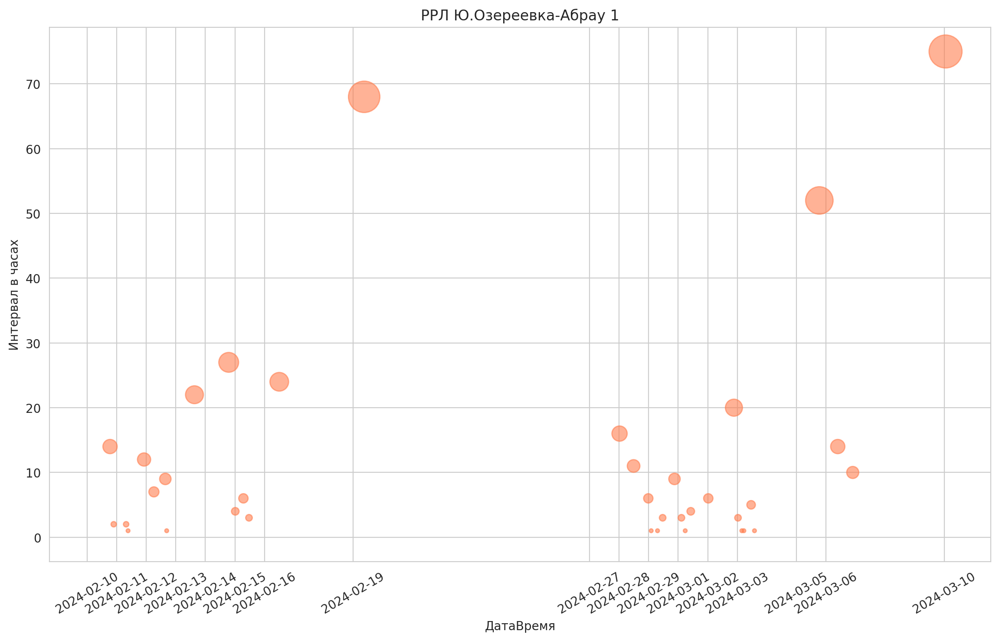

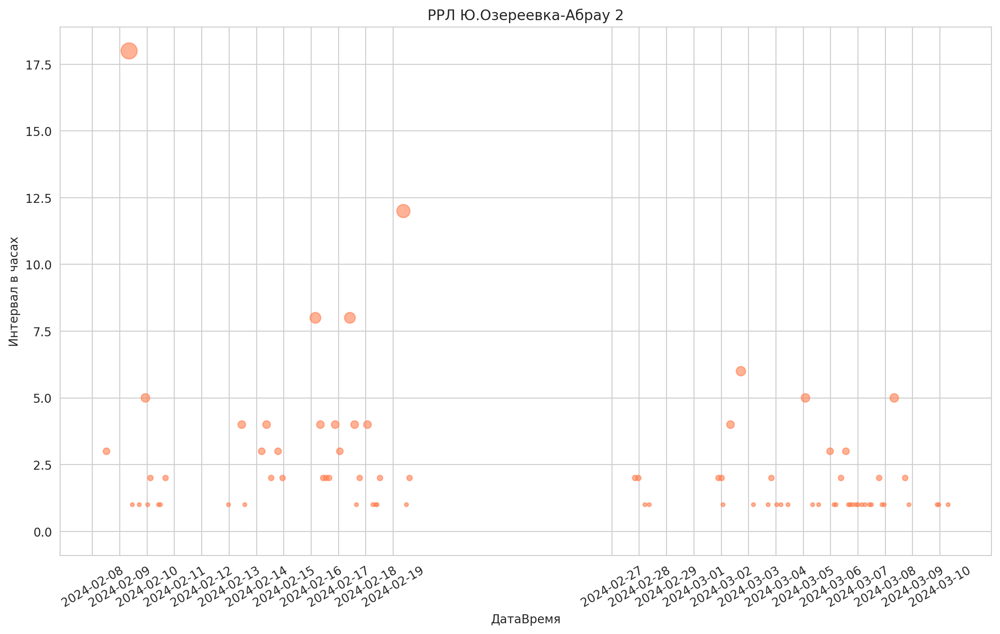

In [116]:
for i in range (0, len(spisok_df3)):
    get_plot1_int2(spisok_df3, colors3, spisok_title3)
    

## Вывод:

**По радио-релейной линии Геленджик уровни сигнала и временные интервалы между значениями находятся в допустимых пределах. По радио-релейной линии Ю.Озеревка временные интервалы между значениями после настройки программы мониторинга стали меньше. Между 19 и 27 февраля пропуск в данных (было переключение на другую БД для тестирования). Кроме того на пролете РРЛ КРТПЦ-Центр есть аномальное ступенчатое уменьшение уровня сигнала и среднего значения уровня сигнала. На распределении тоже видна группировка значений возле двух максимумов. Возможно необходимо настроить направление зеркал антенн по отношению друг к другу.**